# Final Project - (4th year)

The Synthetic Employee Attrition Dataset is a simulated dataset designed for the analysis and prediction of employee attrition. It contains detailed information about various aspects of an employee's profile, including demographics, job-related features, and personal circumstances.

 The goal is to understand the factors contributing to attrition and develop predictive models to identify at-risk employees.




**Employee ID:** A unique identifier assigned to each employee.

**Age:** The age of the employee, ranging from 18 to 60 years.

**Gender:** The gender of the employee

**Years at Company:** The number of years the employee has been working at the company.

**Monthly Income:** The monthly salary of the employee, in dollars.

**Job Role:** The department or role the employee works in, encoded into
categories such as Finance, Healthcare, Technology, Education, and Media.

**Work-Life Balance:** The employee's perceived balance between work and personal life, (Poor, Below Average, Good, Excellent)

**Job Satisfaction:** The employee's satisfaction with their job: (Very Low, Low, Medium, High)

**Performance Rating:** The employee's performance rating: (Low, Below Average, Average, High)

**Number of Promotions:** The total number of promotions the employee has received.

**Distance from Home:** The distance between the employee's home and workplace, in miles.

**Education Level:** The highest education level attained by the employee: (High School, Associate Degree, Bachelor’s Degree, Master’s Degree, PhD)

**Marital Status:** The marital status of the employee: (Divorced, Married, Single)

**Job Level:** The job level of the employee: (Entry, Mid, Senior)

**Company Size:** The size of the company the employee works for: (Small,Medium,Large)

**Company Tenure:** The total number of years the employee has been working in the industry.

**Remote Work:** Whether the employee works remotely: (Yes or No)

**Leadership Opportunities:**  Whether the employee has leadership opportunities: (Yes or No)

**Innovation Opportunities:** Whether the employee has opportunities for innovation: (Yes or No)

**Company Reputation:** The employee's perception of the company's reputation: (Very Poor, Poor,Good, Excellent)

**Employee Recognition:** The level of recognition the employee receives:(Very Low, Low, Medium, High)

***Attrition: Whether the employee has left the company, encoded as 0 (stayed) and 1 (Left).***

## Importing Dataset

In [ ]:
pip install gower

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Importing the data
train=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Final Project Y4/train.csv")
test=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Final Project Y4/test.csv")

In [ ]:
#dropping ID column
train=train.drop(['Employee ID'],axis=1)
test=test.drop(['Employee ID'],axis=1)

In [ ]:
train.head()

,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,31,Male,19,Education,5390,Excellent,Medium,Average,2,No,...,0,Mid,Medium,89,No,No,No,Excellent,Medium,Stayed
1,59,Female,4,Media,5534,Poor,High,Low,3,No,...,3,Mid,Medium,21,No,No,No,Fair,Low,Stayed
2,24,Female,10,Healthcare,8159,Good,High,Low,0,No,...,3,Mid,Medium,74,No,No,No,Poor,Low,Stayed
3,36,Female,7,Education,3989,Good,High,High,1,No,...,2,Mid,Small,50,Yes,No,No,Good,Medium,Stayed
4,56,Male,41,Education,4821,Fair,Very High,Average,0,Yes,...,0,Senior,Medium,68,No,No,No,Fair,Medium,Stayed


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59598 entries, 0 to 59597
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       59598 non-null  int64 
 1   Gender                    59598 non-null  object
 2   Years at Company          59598 non-null  int64 
 3   Job Role                  59598 non-null  object
 4   Monthly Income            59598 non-null  int64 
 5   Work-Life Balance         59598 non-null  object
 6   Job Satisfaction          59598 non-null  object
 7   Performance Rating        59598 non-null  object
 8   Number of Promotions      59598 non-null  int64 
 9   Overtime                  59598 non-null  object
 10  Distance from Home        59598 non-null  int64 
 11  Education Level           59598 non-null  object
 12  Marital Status            59598 non-null  object
 13  Number of Dependents      59598 non-null  int64 
 14  Job Level             

In [ ]:
#checking number of variables and numbert of rows in train and test set
print(train.shape)
print(test.shape)

(59598, 23)
(14900, 23)


## Data Preprocessing


In [ ]:
train.describe()

,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
count,59598.000000,59598.000000,59598.000000,59598.000000,59598.000000,59598.000000,59598.000000
mean,38.565875,15.753901,7302.397983,0.832578,50.007651,1.648075,55.758415
std,12.079673,11.245981,2151.457423,0.994991,28.466459,1.555689,25.411090
min,18.000000,1.000000,1316.000000,0.000000,1.000000,0.000000,2.000000
25%,28.000000,7.000000,5658.000000,0.000000,25.000000,0.000000,36.000000
50%,39.000000,13.000000,7354.000000,1.000000,50.000000,1.000000,56.000000
75%,49.000000,23.000000,8880.000000,2.000000,75.000000,3.000000,76.000000
max,59.000000,51.000000,16149.000000,4.000000,99.000000,6.000000,128.000000


In [ ]:
test.describe()


,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
count,14900.000000,14900.000000,14900.000000,14900.000000,14900.000000,14900.000000,14900.000000
mean,38.385235,15.592416,7287.306040,0.834362,49.927315,1.659329,55.603624
std,12.097904,11.133792,2156.737934,0.996511,28.702307,1.545401,25.352807
min,18.000000,1.000000,1226.000000,0.000000,1.000000,0.000000,2.000000
25%,28.000000,7.000000,5633.750000,0.000000,25.000000,0.000000,36.000000
50%,38.000000,13.000000,7332.000000,1.000000,50.000000,1.000000,56.000000
75%,49.000000,23.000000,8852.000000,2.000000,75.000000,3.000000,75.000000
max,59.000000,51.000000,15063.000000,4.000000,99.000000,6.000000,127.000000


In [ ]:
train.describe(include="O")


,Gender,Job Role,Work-Life Balance,Job Satisfaction,Performance Rating,Overtime,Education Level,Marital Status,Job Level,Company Size,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
count,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598
unique,2,5,4,4,4,2,5,3,3,3,2,2,2,4,4,2
top,Male,Technology,Good,High,Average,No,Bachelor’s Degree,Married,Entry,Medium,No,No,No,Good,Low,Stayed
freq,32739,15507,22528,29779,35810,40148,17826,29908,23867,29745,48239,56680,49895,29766,23758,31260


In [ ]:
test.describe(include="O")

,Gender,Job Role,Work-Life Balance,Job Satisfaction,Performance Rating,Overtime,Education Level,Marital Status,Job Level,Company Size,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
count,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900,14900
unique,2,5,4,4,4,2,5,3,3,3,2,2,2,4,4,2
top,Male,Technology,Good,High,Average,No,Bachelor’s Degree,Married,Mid,Medium,No,No,No,Good,Low,Stayed
freq,8087,3815,5630,7466,8909,10009,4505,7511,5925,7486,12061,14165,12499,7416,5862,7868


In [ ]:
train.columns

Index(['Age', 'Gender', 'Years at Company', 'Job Role', 'Monthly Income',
       'Work-Life Balance', 'Job Satisfaction', 'Performance Rating',
       'Number of Promotions', 'Overtime', 'Distance from Home',
       'Education Level', 'Marital Status', 'Number of Dependents',
       'Job Level', 'Company Size', 'Company Tenure', 'Remote Work',
       'Leadership Opportunities', 'Innovation Opportunities',
       'Company Reputation', 'Employee Recognition', 'Attrition'],
      dtype='object')

In [ ]:
#dividing features for catgorical and quantitative
#Dividing Categoricals and Quants
quants=['Age',	'Years at Company',	'Monthly Income',	'Number of Promotions',
        'Distance from Home',	'Number of Dependents',	'Company Tenure']
norm=['Gender',	'Job Role' ,'Overtime',		'Marital Status',	'Remote Work',	'Leadership Opportunities',	'Innovation Opportunities',	'Attrition']
ord=['Work-Life Balance',	'Job Satisfaction',	'Performance Rating' ,'Education Level' ,'Job Level'	,'Company Size' ,'Company Reputation'	,'Employee Recognition']

In [ ]:
#number of duplicates in dataset
train.duplicated().sum(), test.duplicated().sum()
# no duplicates in dataset train and test

(0, 0)

In [ ]:
#Checking unique values in each variables with thier count percentage
for i in norm:
  print(i)
  print(train[i].value_counts(normalize=True))
#no lots of levels norminal variables

Gender
Gender
Male      0.549331
Female    0.450669
Name: proportion, dtype: float64
Job Role
Job Role
Technology    0.260193
Healthcare    0.228900
Education     0.209571
Media         0.160643
Finance       0.140693
Name: proportion, dtype: float64
Overtime
Overtime
No     0.673647
Yes    0.326353
Name: proportion, dtype: float64
Marital Status
Marital Status
Married     0.501829
Single      0.349592
Divorced    0.148579
Name: proportion, dtype: float64
Remote Work
Remote Work
No     0.809406
Yes    0.190594
Name: proportion, dtype: float64
Leadership Opportunities
Leadership Opportunities
No     0.951039
Yes    0.048961
Name: proportion, dtype: float64
Innovation Opportunities
Innovation Opportunities
No     0.837193
Yes    0.162807
Name: proportion, dtype: float64
Attrition
Attrition
Stayed    0.524514
Left      0.475486
Name: proportion, dtype: float64


In [ ]:
#unique numbers in quants variables
for i in quants:
  print(i)
  print(train[i].unique())

for i in quants:
  print(i)
  print(test[i].unique())
#no imposible values for numerical data

Age
[31 59 24 36 56 38 47 48 57 30 29 40 19 33 49 51 39 54 23 45 42 53 37 34
 25 41 55 21 28 26 52 50 27 58 43 35 46 44 20 18 22 32]
Years at Company
[19  4 10  7 41  3 23 16 44  1 12  6 38 22 30  9 37 33 13  5 21 32 34 11
  2 18 27 17 36  8 28 35 14 24 40 15 45 39 20 43 26 29 46 42 25 31 47 48
 49 50 51]
Monthly Income
[ 5390  5534  8159 ... 12440  2975 12260]
Number of Promotions
[2 3 0 1 4]
Distance from Home
[22 21 11 27 71 37 75  5 39 57 51 26 78 30 98 48 17 86 60 10 18 95 23 16
 63 92 58 55 31 32 82  8 74  3 76 47 67 84 14 36 79 52 44 89 64  7 87 24
 15 81 13 35 68 56 73 41 34 29 19 50 62 49 69 33 61 53 72 91 65 93 28 46
 54  9 45 96 94  1 88 25  6 70 12 99  4 97 42 38 90 43 59 85  2 40 20 77
 83 80 66]
Number of Dependents
[0 3 2 4 1 5 6]
Company Tenure
[ 89  21  74  50  68  47  93  88  75  45  17  38  84  96  63  19  70  76
  72  95  20  40  60  23  83  67  91  28  27  55  54  71  46  86  69  36
  22  25  49  61 103  64  12  39  33  57  58  65  66 100  62  80   6  78
  30  77  

In [ ]:
#number of row that Age variable is greater than	Years at Company in train
train[train['Age']<train['Years at Company']].sum().sum()
test[test['Age']<test['Years at Company']].sum().sum()

0

In [ ]:
# missing values for each coloumn
train.isnull().sum(), test.isnull().sum()
#no missing values in both train and test set

(Age                         0
 Gender                      0
 Years at Company            0
 Job Role                    0
 Monthly Income              0
 Work-Life Balance           0
 Job Satisfaction            0
 Performance Rating          0
 Number of Promotions        0
 Overtime                    0
 Distance from Home          0
 Education Level             0
 Marital Status              0
 Number of Dependents        0
 Job Level                   0
 Company Size                0
 Company Tenure              0
 Remote Work                 0
 Leadership Opportunities    0
 Innovation Opportunities    0
 Company Reputation          0
 Employee Recognition        0
 Attrition                   0
 dtype: int64,
 Age                         0
 Gender                      0
 Years at Company            0
 Job Role                    0
 Monthly Income              0
 Work-Life Balance           0
 Job Satisfaction            0
 Performance Rating          0
 Number of Promotions   

## Outlier Ditection - consider train set only



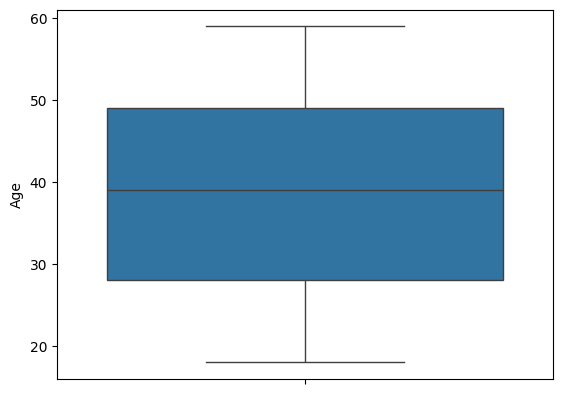

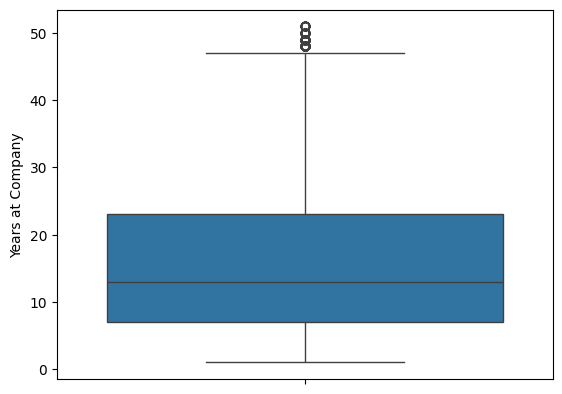

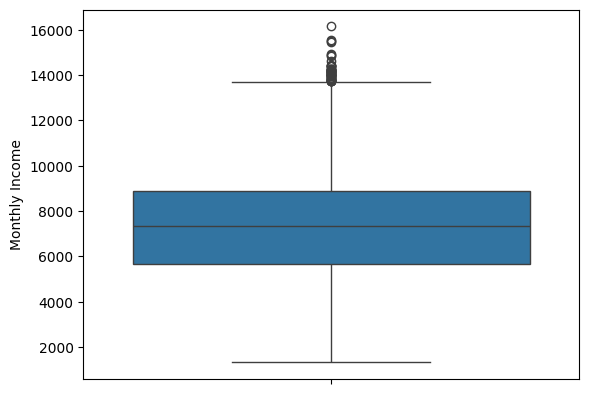

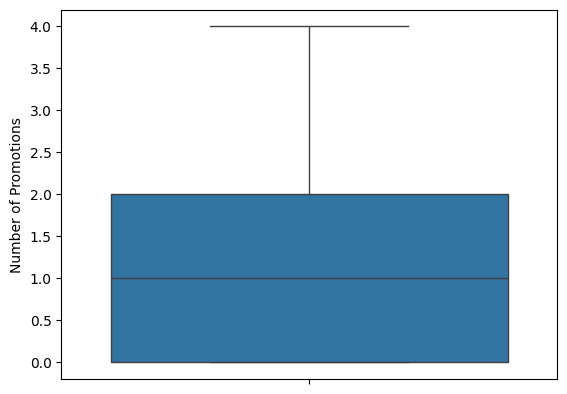

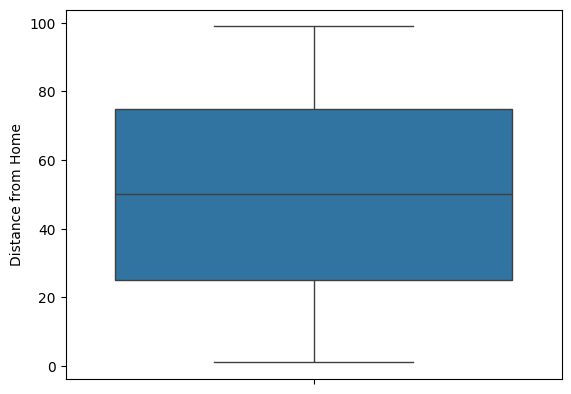

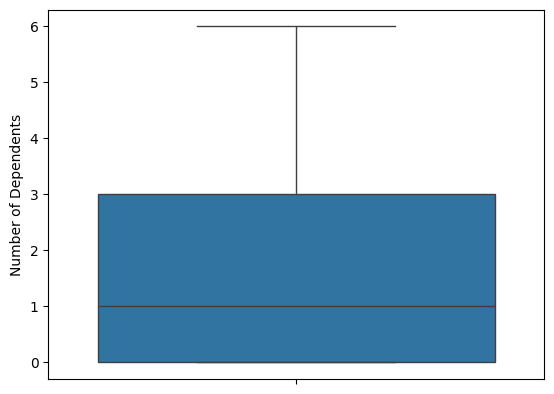

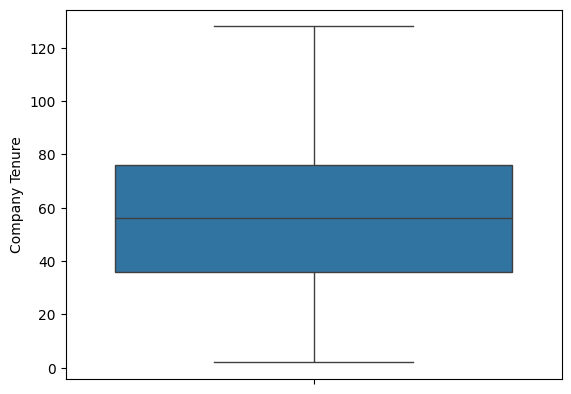

In [ ]:
#plotting individual box plot on categorical variables to initial checkinh of outliers
for i in quants:
  sns.boxplot(train[i])
  plt.show()
#no much outlier in the dataset

In [ ]:
#Create copy of df without the outcome variable
df_copy=train.copy()
df_copy=df_copy.drop(['Attrition'], axis=1)

In [ ]:
df_copy.shape

(59598, 22)

In [ ]:
!pip install gower

In [ ]:
import gower

# Calculate the Gower distance matrix
#gower_dist = gower.gower_matrix(df_copy)

#k= No.of dimensions * 2
#k = 44

In [ ]:
#gower_dist=np.load('gower_distance_matrix.npy')
#k=44

In [ ]:
#np.save('gower_distance_matrix.npy', gower_dist)

In [ ]:
#from sklearn.neighbors import NearestNeighbors
# Use NearestNeighbors with precomputed distance
#neighbors = NearestNeighbors(n_neighbors=k, metric='precomputed')
#neighbors_fit = neighbors.fit(gower_dist)
#distances, indices = neighbors_fit.kneighbors(gower_dist)

# Sort distances to the k-th nearest neighbor
#distances = np.sort(distances[:, k-1], axis=0)


In [ ]:
# Plot the k-distance graph
#plt.figure(figsize=(10, 6))
#plt.plot(distances)
#plt.title('k-Distance Plot')
#plt.xlabel('Points sorted by distance')
#plt.ylabel('Distance to {}-th nearest neighbor'.format(k))
#plt.axhline(y=0.27, color='r', linestyle='--')  # Add a horizontal line at the chosen epsilon
#plt.grid(True)
#plt.show()

In [ ]:
#from sklearn.cluster import DBSCAN

#dbscan = DBSCAN(eps=0.27, min_samples=44,metric='precomputed')
#dbscan.fit(gower_dist)

In [ ]:
#labels = dbscan.labels_
#num_outliers = np.sum(labels == -1)

#print("Number of outliers detected:", num_outliers)

In [ ]:
#print("Percentage of outliers:", np.sum(labels == -1) / len(labels) * 100)

In [ ]:
# Remove outliers from the dataframe
#train= train[labels != -1]

In [ ]:
#a=[] #no outliers

In [ ]:
#train = train.drop(a)

In [ ]:
#train.shape

## EDA

In [ ]:
import plotly.express as px

attrition_counts = train['Attrition'].value_counts()


values = attrition_counts.values

labels = ['No', 'Yes']
fig = px.pie(names=labels, values=values, title='Attrition Distribution', hole=0.4)

fig.show()

In [ ]:
quants = [col for col in train.columns if train[col].dtype in ['int64', 'float64']]
cats = [col for col in train.columns if train[col].dtype == 'object']
cats.pop(cats.index('Attrition'))

'Attrition'

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def numerical_plots(v):
  fig = make_subplots(rows=1, cols=2,
                    subplot_titles=(f"Histogram of {v}", f"Boxplot of {v} based on attrition"))

  #Histogram of the variable
  fig.add_trace(go.Histogram(x=train[v]), row=1, col=1)

  #Boxplot of the variable
  fig.add_trace(go.Box(y=train[v], x=train['Attrition']),  row=1, col=2)

  fig.update_layout(height=700, width=1400,
                  title_text=f"Histogram and Boxplot of {v}")

  #Show the plots
  fig.show()

Almost balanced dataset no need sampling

In [ ]:
for q in quants:
  numerical_plots(q)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=train['Number of Promotions'], x=train['Attrition']))
fig.update_layout(title="Boxplot of Number of Promotions based on Attrition",
                  width=700,
                  height=700)
fig.show()

In [ ]:
quants

['Age',
 'Years at Company',
 'Monthly Income',
 'Number of Promotions',
 'Distance from Home',
 'Number of Dependents',
 'Company Tenure']

In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=train['Distance from Home'], x=train['Attrition']))
fig.update_layout(title="Boxplot of Attrition based on distance from home",
                  width=700,
                  height=700)
fig.show()

In [ ]:
def categorical_plots(v):
  fig = make_subplots(rows=1, cols=2,
                    subplot_titles=(f"Percentage-wise chart of {v}", f"Percentage Bar plot of {v} based on Attrition"))

  #Pie chart or barplot of the variable
  fig.add_trace(go.Bar(x=train[v].value_counts().index, y=train[v].value_counts().values), row=1, col=1)

  #Percentage Barplot of the variable
  category_counts = train.groupby([v, 'Attrition']).size().reset_index(name='Count')

  pivot_data = category_counts.pivot(index=v, columns='Attrition', values='Count').fillna(0)

  pivot_data_percentage = pivot_data.div(pivot_data.sum(axis=1), axis=0) * 100

  fig_perc = go.Figure()

  for category in pivot_data_percentage.columns:
    fig.add_trace(go.Bar(
        x=pivot_data_percentage.index,  # Category_1
        y=pivot_data_percentage[category],  # Percentage
        name=category  # Category_2
        ), row=1, col=2)

  fig.update_layout(
      barmode='stack',
      height=700,
      width=1400,
      title_text="Pie Chart and Percentage Stacked Bar Chart",
      yaxis=dict(tickformat=".0%"),
      showlegend=True
      )

  #Show the plots
  fig.show()

categorical_plots('Job Role')

In [ ]:
for c in cats:
  categorical_plots(c)

In [ ]:
fig = px.bar(train, x='Marital Status', y='Attrition', color='Subcategory', title="Stacked Bar Chart Example")

# Show the plot
fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['Age', 'Gender', 'Years at Company', 'Job Role', 'Monthly Income', 'Work-Life Balance', 'Job Satisfaction', 'Performance Rating', 'Number of Promotions', 'Overtime', 'Distance from Home', 'Education Level', 'Marital Status', 'Number of Dependents', 'Job Level', 'Company Size', 'Company Tenure', 'Remote Work', 'Leadership Opportunities', 'Innovation Opportunities', 'Company Reputation', 'Employee Recognition', 'Attrition'] but received: Subcategory

### Numerical Summaries

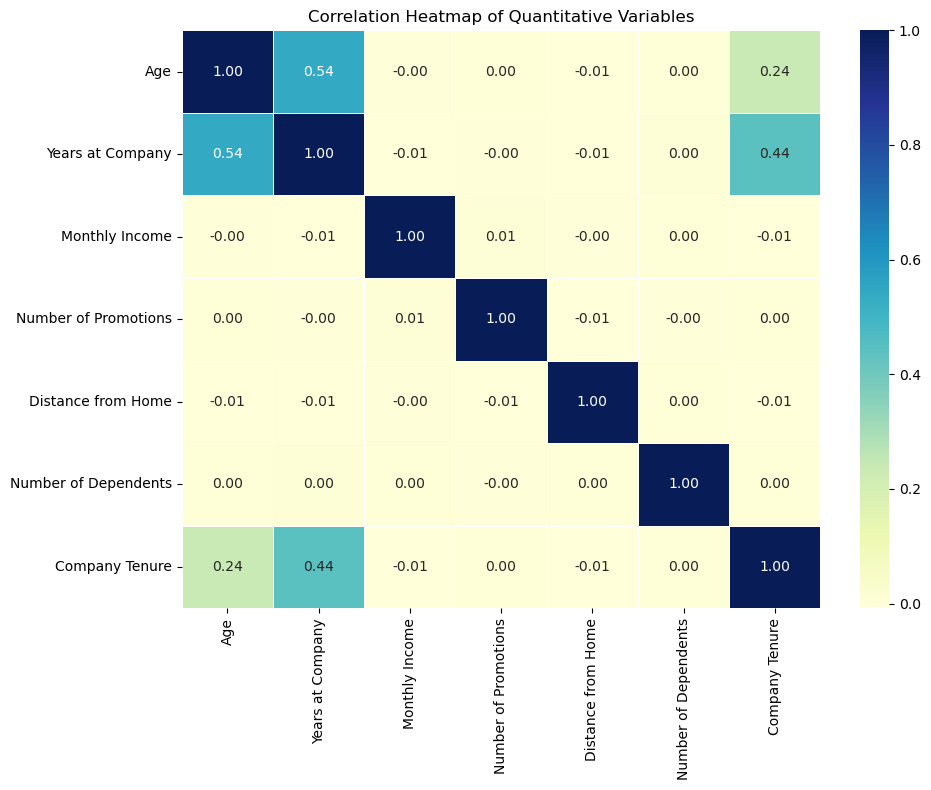

In [ ]:
quant_df = train[quants]

corr_matrix = quant_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)

plt.title('Correlation Heatmap of Quantitative Variables')
plt.tight_layout()
plt.show()

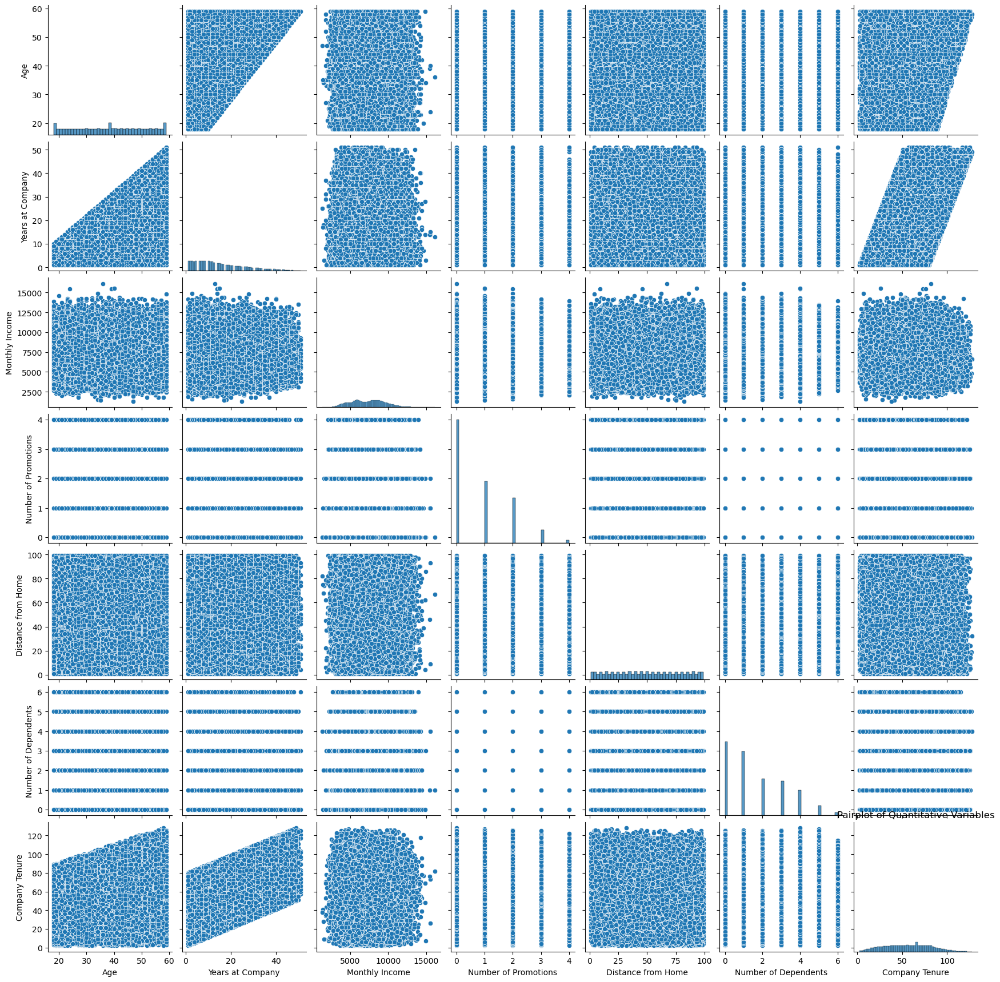

In [ ]:
sns.pairplot(quant_df)
plt.title("Pairplot of Quantitative Variables")
plt.show()

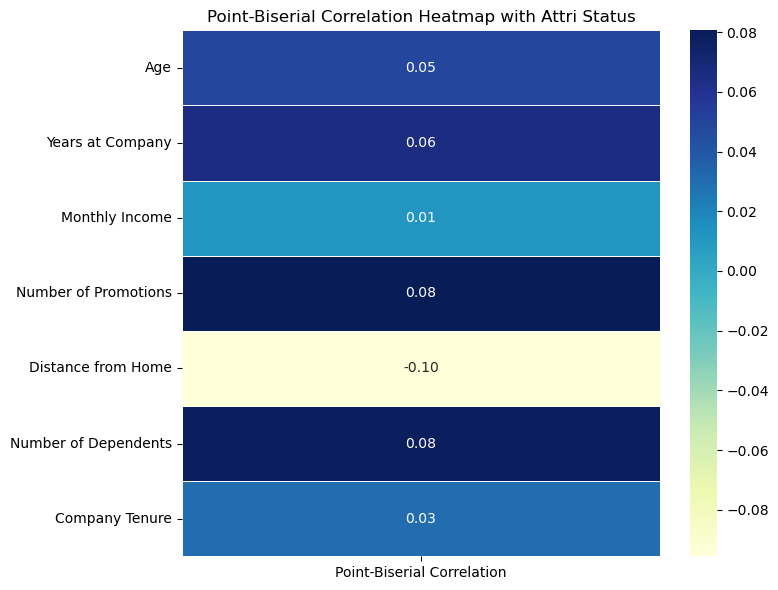

In [ ]:
import pandas as pd
from scipy.stats import pointbiserialr

train['Attrition1'] = train['Attrition'].apply(lambda x: 1 if x == 'Stayed' else 0)

correlations = {}
for predictor in quants:
    correlation, _ = pointbiserialr(train[predictor], train['Attrition1'])
    correlations[predictor] = correlation

corr_df = pd.DataFrame(correlations.values(), index=correlations.keys(), columns=['Point-Biserial Correlation'])

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)
plt.title('Point-Biserial Correlation Heatmap with Attri Status')
plt.tight_layout()
plt.show()

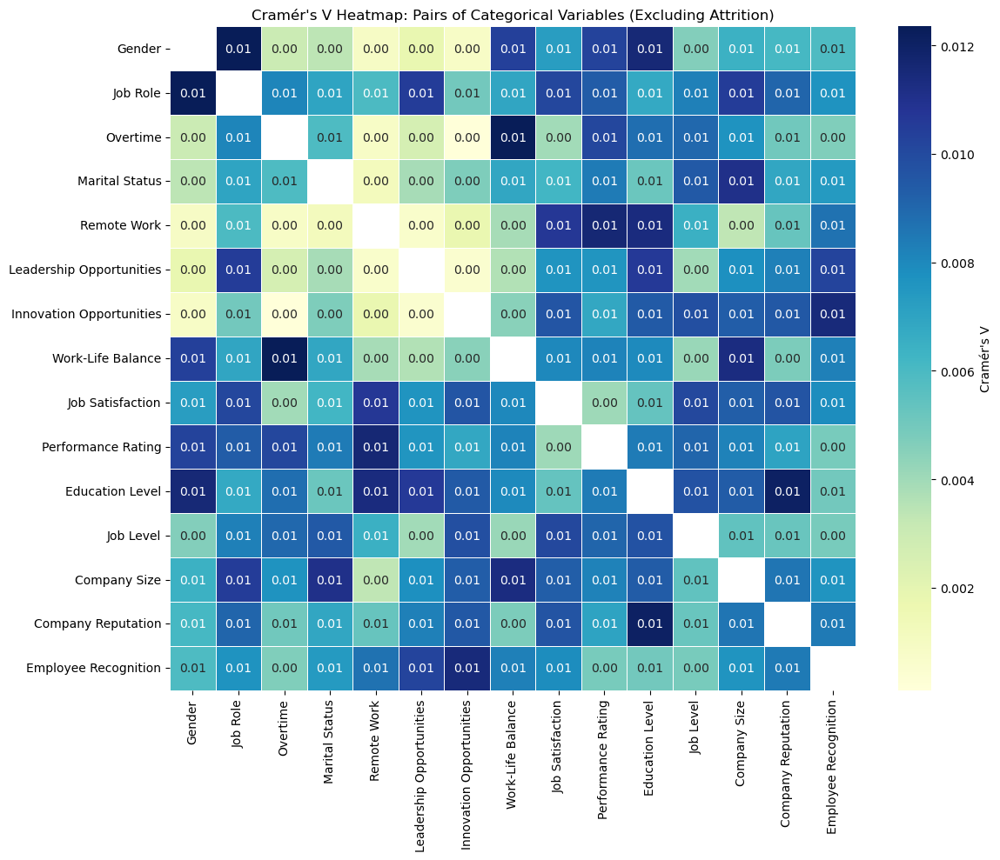

In [ ]:
from scipy.stats import chi2_contingency
variables = [var for var in norm + ord if var != 'Attrition']

def cramers_v(chi2, n, k):
    return np.sqrt(chi2 / (n * (k - 1)))

cramers_v_matrix = pd.DataFrame(index=variables, columns=variables)

for var1 in variables:
    for var2 in variables:
        if var1 != var2:
            contingency_table = pd.crosstab(train[var1], train[var2])
            chi2_stat, _, _, _ = chi2_contingency(contingency_table)
            n = contingency_table.sum().sum()
            k = min(contingency_table.shape)
            cramers_v_value = cramers_v(chi2_stat, n, k)
            cramers_v_matrix.loc[var1, var2] = cramers_v_value
        else:
            cramers_v_matrix.loc[var1, var2] = np.nan

# Convert the DataFrame to numeric, coercing errors
cramers_v_matrix = cramers_v_matrix.apply(pd.to_numeric, errors='coerce')

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cramers_v_matrix, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5, cbar_kws={'label': "Cramér's V"})
plt.title('Cramér\'s V Heatmap: Pairs of Categorical Variables (Excluding Attrition)')
plt.tight_layout()
plt.show()

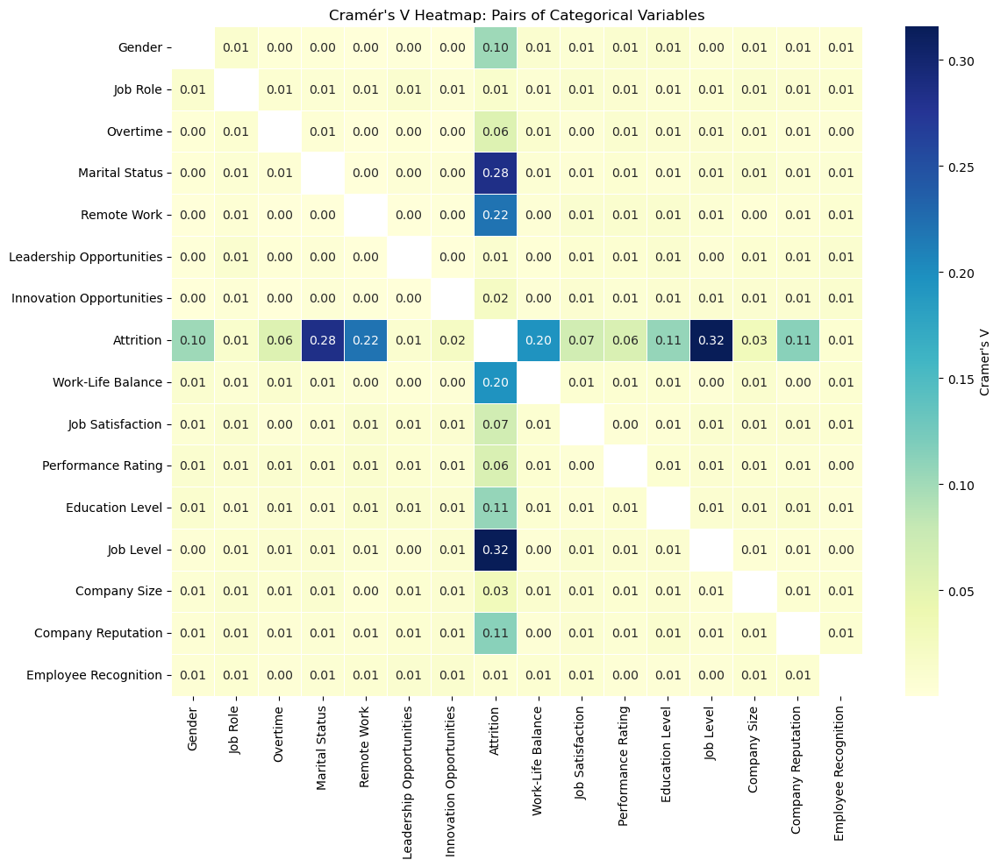

In [ ]:
def cramers_v(chi2, n, k):
    return np.sqrt(chi2 / (n * (k - 1)))

cramers_v_matrix = pd.DataFrame(index=norm, columns=norm+ord)

for var1 in norm+ord:
    for var2 in norm+ord:
        if var1 != var2:
            contingency_table = pd.crosstab(train[var1], train[var2])
            chi2_stat, _, _, _ = chi2_contingency(contingency_table)
            n = contingency_table.sum().sum()
            k = min(contingency_table.shape)
            cramers_v_value = cramers_v(chi2_stat, n, k)
            cramers_v_matrix.loc[var1, var2] = cramers_v_value
        else:
            cramers_v_matrix.loc[var1, var2] = np.nan

cramers_v_matrix = cramers_v_matrix.apply(pd.to_numeric, errors='coerce')

plt.figure(figsize=(12, 10))
sns.heatmap(cramers_v_matrix, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5, cbar_kws={'label': "Cramer's V"})
plt.title('Cramér\'s V Heatmap: Pairs of Categorical Variables')
plt.tight_layout()
plt.show()


## Clustering

#### DBSCAN

In [ ]:
# DB scan with gower distance
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 0


#### FAMD

In [ ]:
import prince
famd = prince.FAMD(
    n_components=20,
    n_iter=20,
    copy=True,
    check_input=True,
    random_state=123,
    engine="sklearn",
    handle_unknown="error"
)

In [ ]:
train = train.apply(lambda col: col.astype(float) if col.dtype == 'int64' else col)

In [ ]:
famd = famd.fit(train)

/Applications/anaconda3/lib/python3.12/site-packages/prince/pca.py:178: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-1.950355361580083, -2.0484418379724194, -0.8960165919659586, -1.2594553290063961, -1.9988922735234425, -1.2709666478737287, -1.2648261650093282, -1.9981870369442145, -1.5516002506109283, -1.4149489767238146, -1.546878138130901, -1.2557729372736641, -1.2702271302071027, -0.6439291783556713, -1.4115771624581284, -1.7858052260477273, -1.5558335841433601, -0.6306595495978075, -1.8987774710127703, -2.096340648743507, -2.587960622944692, -1.1412536151477117, -1.7898971112463273, -1.7856172999603004, -1.26800598943165, -1.2948228943485354, -1.0609152301391123, -1.3532192687594735, -1.1336418291381558, -1.4427565146677133, -1.9993287238852333, -0.889249566075121, -1.2750263280889709, -2.7583163349510587, -0.6258522160559624, -1.0902433173177775, -2.003654502020888, -1.6723451036120967, -2.321459483462974, -1.615805021232395, -2.1924581441499535, 

In [ ]:
famd.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,12.538,4.37%,4.37%
1,8.751,3.05%,7.42%
2,8.364,2.91%,10.33%
3,8.297,2.89%,13.22%
4,8.275,2.88%,16.11%
5,8.241,2.87%,18.98%
6,8.227,2.87%,21.84%
7,8.201,2.86%,24.70%
8,8.182,2.85%,27.55%


In [ ]:
famd.column_contributions_.style.format('{:.0%}')

component,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
variable,,,,,,,,,,,,,,,,,,,,
Age,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Years at Company,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Monthly Income,0%,8%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Number of Promotions,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Distance from Home,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Number of Dependents,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Company Tenure,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Attrition,6%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
Company Reputation,0%,0%,1%,0%,4%,0%,2%,1%,1%,2%,0%,2%,0%,1%,1%,2%,1%,2%,1%,2%


In [ ]:
transformed_df = famd.transform(train)

/Applications/anaconda3/lib/python3.12/site-packages/prince/pca.py:178: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-1.950355361580083, -2.0484418379724194, -0.8960165919659586, -1.2594553290063961, -1.9988922735234425, -1.2709666478737287, -1.2648261650093282, -1.9981870369442145, -1.5516002506109283, -1.4149489767238146, -1.546878138130901, -1.2557729372736641, -1.2702271302071027, -0.6439291783556713, -1.4115771624581284, -1.7858052260477273, -1.5558335841433601, -0.6306595495978075, -1.8987774710127703, -2.096340648743507, -2.587960622944692, -1.1412536151477117, -1.7898971112463273, -1.7856172999603004, -1.26800598943165, -1.2948228943485354, -1.0609152301391123, -1.3532192687594735, -1.1336418291381558, -1.4427565146677133, -1.9993287238852333, -0.889249566075121, -1.2750263280889709, -2.7583163349510587, -0.6258522160559624, -1.0902433173177775, -2.003654502020888, -1.6723451036120967, -2.321459483462974, -1.615805021232395, -2.1924581441499535, 

In [ ]:
train['Attrition'] = train['Attrition'].map({'Stayed': 0, 'Left': 1})

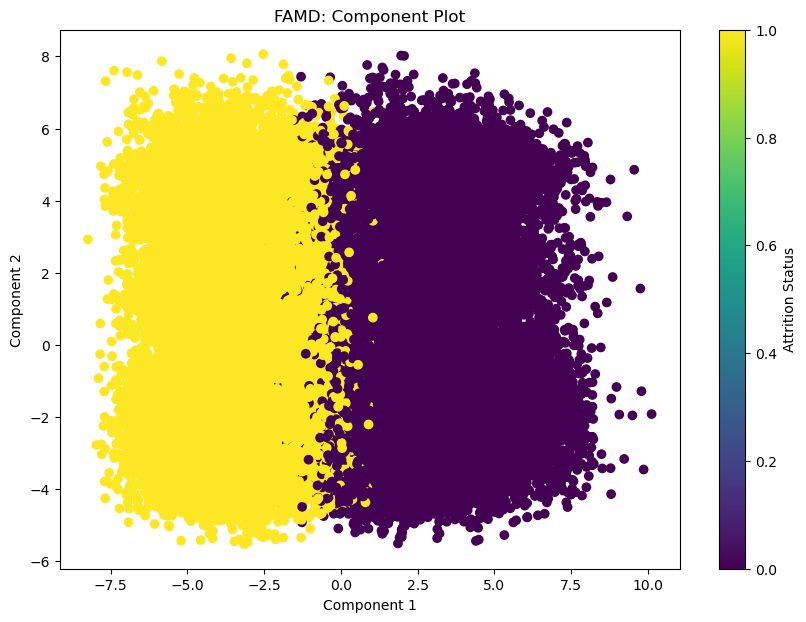

In [ ]:
from scipy import stats
plt.figure(figsize=(10, 7))
plt.scatter(transformed_df.iloc[:, 0], transformed_df.iloc[:, 1], c=train['Attrition'], cmap='viridis')
plt.colorbar(label='Attrition Status')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('FAMD: Component Plot')
plt.show()

In [ ]:
loadings=famd.column_coordinates_

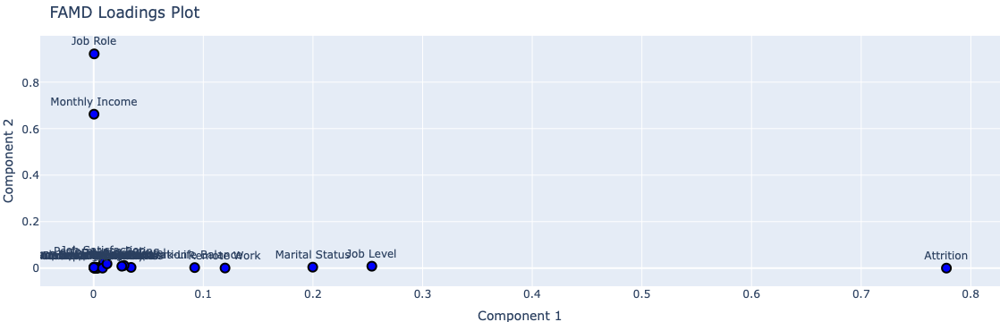

In [ ]:
# Create a Plotly figure
import plotly.graph_objects as go
# Create a Plotly figure
fig = go.Figure()

# Add scatter plot of the loadings
fig.add_trace(go.Scatter(
    x=loadings.iloc[:, 0],
    y=loadings.iloc[:, 1],
    mode='markers+text',
    text=loadings.index,
    textposition='top center',
    marker=dict(color='blue', size=10, line=dict(color='black', width=2)),
    name='Variables'
))

# Update layout
fig.update_layout(
    title='FAMD Loadings Plot',
    xaxis_title='Component 1',
    yaxis_title='Component 2',
    showlegend=False,
    xaxis=dict(showgrid=True, zeroline=True),
    yaxis=dict(showgrid=True, zeroline=True),
    margin=dict(l=0, r=0, t=40, b=0)  # Adjust margins to fit text better
)

# Show the figure
fig.show()

In [ ]:
famd.cumulative_percentage_of_variance_


array([ 4.36877648,  7.41775828, 10.33197726, 13.22287017, 16.1060488 ,
       18.97731921, 21.84387412, 24.70124131, 27.55219721, 30.39909776,
       33.23101327, 36.05533796, 38.87535273, 41.68532176, 44.49197343,
       47.28645918, 50.07576483, 52.86050633, 55.64066338, 58.40495933])

## Advanced Analysis

In [ ]:
train['Attrition'] = train['Attrition'].map({'Stayed': 0, 'Left': 1})
test['Attrition'] = test['Attrition'].map({'Stayed': 0, 'Left': 1})

In [ ]:
X_train=train.drop(columns=['Attrition'])
y_train=train['Attrition']
X_test=test.drop(columns=['Attrition'])
y_test=test['Attrition']

In [ ]:
quants=['Age','Years at Company','Monthly Income','Number of Promotions',
        'Distance from Home','Number of Dependents','Company Tenure']
norm=['Gender','Job Role' ,'Overtime','Marital Status','Remote Work','Leadership Opportunities','Innovation Opportunities']
ordinal=['Work-Life Balance','Job Satisfaction','Performance Rating' ,'Education Level' ,'Job Level','Company Size' ,'Company Reputation','Employee Recognition']

In [ ]:
Work_Life_Balance_level=['Poor','Fair' ,'Good' ,'Excellent' ]
Job_Satisfaction_level=['Low','Medium', 'High', 'Very High' ]
Performance_Rating_level=['Low','Below Average','Average' , 'High' ]
Education_Level_level=['High School','Associate Degree','Bachelor’s Degree', 'Master’s Degree','PhD']
Job_Level_level=['Entry','Mid' ,'Senior' ]
Company_Size_level=['Small' ,'Medium', 'Large']
Company_Reputation_level=[ 'Poor','Fair', 'Good','Excellent' ]
Employee_Recognition_level=[ 'Low','Medium' ,'High', 'Very High']
ord_level=[Work_Life_Balance_level,Job_Satisfaction_level,Performance_Rating_level,Education_Level_level,
          Job_Level_level,Company_Size_level,Company_Reputation_level,Employee_Recognition_level]

In [ ]:
#Preprocessing pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression

preprocessor = ColumnTransformer(
    transformers=[
        ('ordinal',OrdinalEncoder(categories=ord_level),ordinal),
        ('noms',OneHotEncoder(sparse_output=False,drop='first'),norm),
        ('quants',StandardScaler(),quants)
    ]
)

preprocessor_pipeline = Pipeline(
    [
        ('preprocessor',preprocessor),
    ]
)

### Base Model Logistic Regression

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_curve, f1_score, recall_score, precision_score, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score

In [ ]:
model_pipline_lr = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',LogisticRegression())
    ]
)

model_pipline_lr.fit(X_train,y_train)

y_preds = model_pipline_lr.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.75      0.76      0.76      7868
           1       0.73      0.72      0.73      7032

    accuracy                           0.74     14900
   macro avg       0.74      0.74      0.74     14900
weighted avg       0.74      0.74      0.74     14900

AUC-ROC Score: 0.7421


In [ ]:
#training accuracy
y_preds_train = model_pipline_lr.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.75      0.76      0.75     31260
           1       0.73      0.72      0.73     28338

    accuracy                           0.74     59598
   macro avg       0.74      0.74      0.74     59598
weighted avg       0.74      0.74      0.74     59598



Text(0.5, 0, 'Predicted Label')

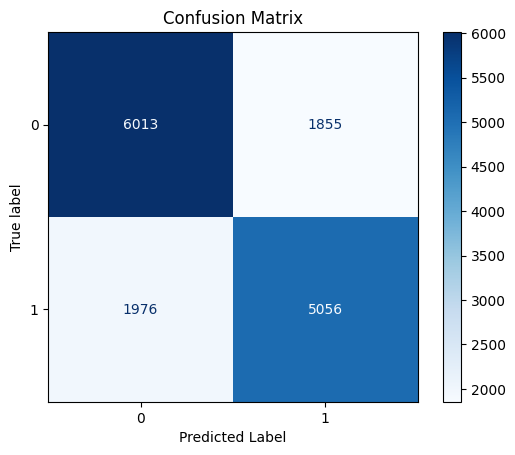

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Standard Bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
model_pipline_sb = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',BaggingClassifier(random_state=123))
    ]
)

model_pipline_sb.fit(X_train,y_train)

y_preds = model_pipline_sb.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.71      0.78      0.75      7868
           1       0.72      0.65      0.69      7032

    accuracy                           0.72     14900
   macro avg       0.72      0.72      0.72     14900
weighted avg       0.72      0.72      0.72     14900

AUC-ROC Score: 0.7198


In [ ]:
#training accuracy
y_preds_train = model_pipline_sb.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     31260
           1       0.99      0.98      0.98     28338

    accuracy                           0.98     59598
   macro avg       0.99      0.98      0.98     59598
weighted avg       0.98      0.98      0.98     59598



Text(0.5, 0, 'Predicted Label')

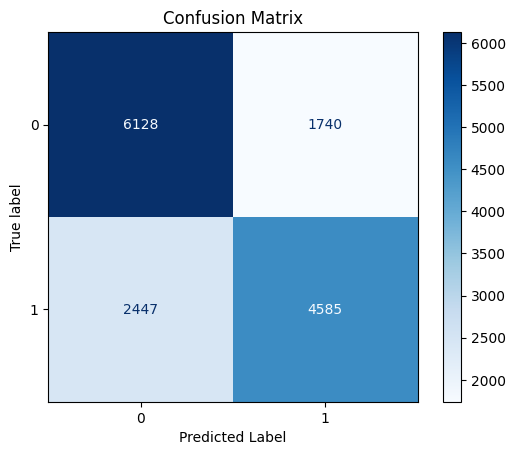

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_estimators': [50, 100, 200],
    'model__max_samples': [0.5, 0.7, 1.0],
    'model__max_features': [0.5, 0.7, 1.0],
}

grid_search_sb = GridSearchCV(model_pipline_sb,
                           param_grid=param_grid,n_jobs=-1,verbose=2)
sb_tuned=grid_search_sb.fit(X_train,y_train)
print(grid_search_sb.best_estimator_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  OrdinalEncoder(categories=[['Poor',
                                                                              'Fair',
                                                                              'Good',
                                                                              'Excellent'],
                                                                             ['Low',
                                                                              'Medium',
                                                                              'High',
                                                                              'Very '
                                                                              'High'],
                                                              

In [ ]:
y_preds_sb_tn = sb_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_sb_tn))
auc_score_sb_tn = roc_auc_score(y_preds_sb_tn,y_test)
print(f"AUC-ROC Score: {auc_score_sb_tn:.4f}")

              precision    recall  f1-score   support

           0       0.75      0.79      0.77      7868
           1       0.75      0.71      0.73      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC Score: 0.7518


In [ ]:
#training accuracy
y_preds_train_sb_tn = sb_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_sb_tn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31260
           1       1.00      1.00      1.00     28338

    accuracy                           1.00     59598
   macro avg       1.00      1.00      1.00     59598
weighted avg       1.00      1.00      1.00     59598



Text(0.5, 0, 'Predicted Label')

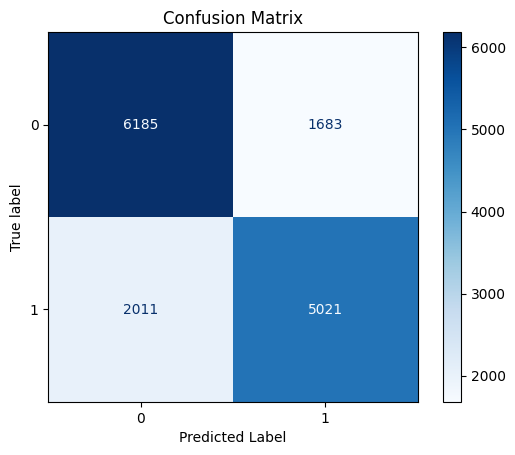

In [ ]:
cm_sb_tn = confusion_matrix(y_test, y_preds_sb_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_sb_tn)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_pipline_rf = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',RandomForestClassifier(random_state=123))
    ]
)

model_pipline_rf.fit(X_train,y_train)

y_preds = model_pipline_rf.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.76      0.78      0.77      7868
           1       0.74      0.72      0.73      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC Score: 0.7502


In [ ]:
#training accuracy
y_preds_train = model_pipline_rf.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31260
           1       1.00      1.00      1.00     28338

    accuracy                           1.00     59598
   macro avg       1.00      1.00      1.00     59598
weighted avg       1.00      1.00      1.00     59598



Text(0.5, 0, 'Predicted Label')

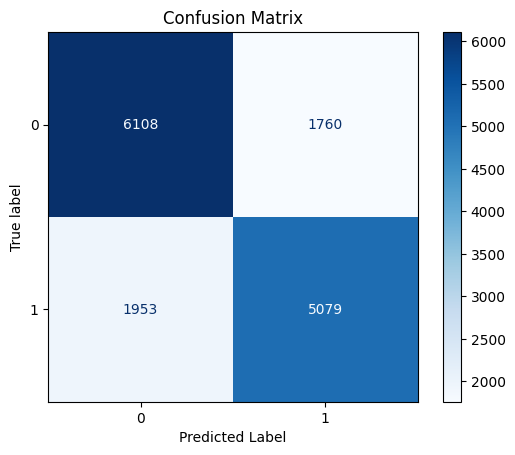

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter Tune

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_estimators': [50,100,200],
    'model__max_depth': [None,20, 30],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 3]
}

grid_search_rf = GridSearchCV(model_pipline_rf,
                           param_grid=param_grid,n_jobs=-1,verbose=2)
rf_tuned=grid_search_rf.fit(X_train,y_train)
print(grid_search_rf.best_estimator_)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  OrdinalEncoder(categories=[['Poor',
                                                                              'Fair',
                                                                              'Good',
                                                                              'Excellent'],
                                                                             ['Low',
                                                                              'Medium',
                                                                              'High',
                                                                              'Very '
                                                                              'High'],
                                                              

In [ ]:
y_preds_rf_tn = rf_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

              precision    recall  f1-score   support

           0       0.76      0.77      0.77      7868
           1       0.74      0.73      0.74      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC Score: 0.7541


In [ ]:
#training accuracy
y_preds_train_rf_tn = rf_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_rf_tn))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     31260
           1       0.94      0.93      0.94     28338

    accuracy                           0.94     59598
   macro avg       0.94      0.94      0.94     59598
weighted avg       0.94      0.94      0.94     59598



Text(0.5, 0, 'Predicted Label')

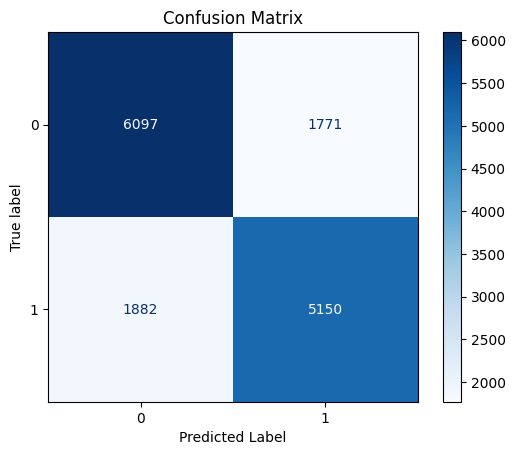

In [ ]:
cm_rf_tn = confusion_matrix(y_test, y_preds_rf_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf_tn)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Ada Boosting

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_pipline_ab = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',AdaBoostClassifier(random_state=123))
    ]
)

model_pipline_ab.fit(X_train,y_train)

y_preds = model_pipline_ab.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



              precision    recall  f1-score   support

           0       0.77      0.78      0.78      7868
           1       0.75      0.75      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7626


In [ ]:
#training accuracy
y_preds_train = model_pipline_ab.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.77      0.77      0.77     31260
           1       0.75      0.74      0.75     28338

    accuracy                           0.76     59598
   macro avg       0.76      0.76      0.76     59598
weighted avg       0.76      0.76      0.76     59598



Text(0.5, 0, 'Predicted Label')

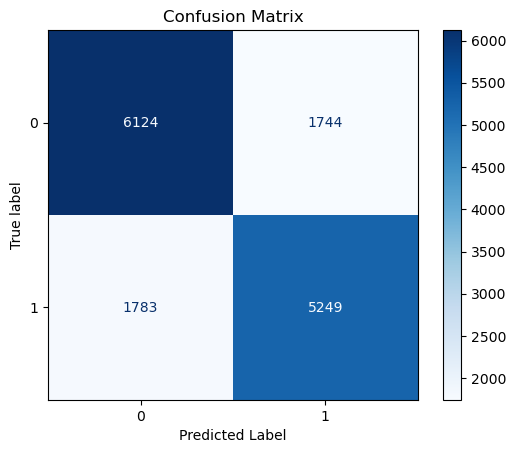

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter tune

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
param_grid_ada = {
    'model__n_estimators': [50, 100, 200],
    'model__learning_rate': [0.01, 0.1, 1, 2],
    'model__estimator': [
        DecisionTreeClassifier(max_depth=1),
        DecisionTreeClassifier(max_depth=2),
        DecisionTreeClassifier(max_depth=3)
    ],
    'model__algorithm': ['SAMME.R', 'SAMME']
}

grid_search_ab = GridSearchCV(model_pipline_ab,
                               param_grid=param_grid_ada,
                               n_jobs=-1, verbose=2)

ab_tuned = grid_search_ab .fit(X_train, y_train)

print("Best Estimator:", grid_search_ab.best_estimator_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


c:\Users\Admin\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



Best Estimator: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  OrdinalEncoder(categories=[['Poor',
                                                                              'Fair',
                                                                              'Good',
                                                                              'Excellent'],
                                                                             ['Low',
                                                                              'Medium',
                                                                              'High',
                                                                              'Very '
                                                                              'High'],
                                                                             ['Low',
                       

In [ ]:
y_preds_ab_tn = ab_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_ab_tn))
auc_score_ab_tn = roc_auc_score(y_preds_ab_tn,y_test)
print(f"AUC-ROC Score: {auc_score_ab_tn:.4f}")

              precision    recall  f1-score   support

           0       0.77      0.78      0.78      7868
           1       0.75      0.75      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7623


In [ ]:
#training accuracy
y_preds_train_ab_tn = ab_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_ab_tn))

              precision    recall  f1-score   support

           0       0.77      0.77      0.77     31260
           1       0.75      0.74      0.75     28338

    accuracy                           0.76     59598
   macro avg       0.76      0.76      0.76     59598
weighted avg       0.76      0.76      0.76     59598



Text(0.5, 0, 'Predicted Label')

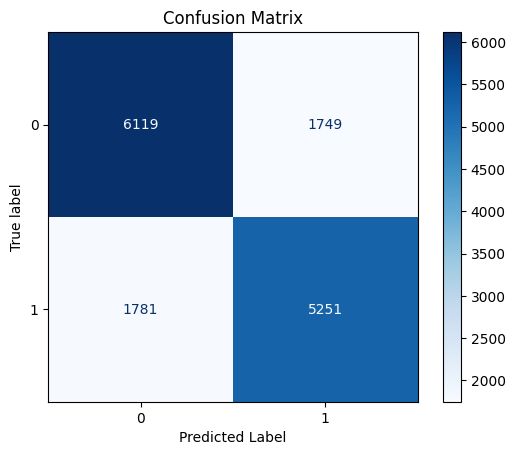

In [ ]:
cm_ab_tn = confusion_matrix(y_test, y_preds_ab_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ab_tn)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### XGB

In [ ]:
from xgboost import XGBClassifier
model_pipline_xgb = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',XGBClassifier(random_state=123))
    ]
)

model_pipline_xgb.fit(X_train,y_train)

y_preds = model_pipline_xgb.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")


              precision    recall  f1-score   support

           0       0.77      0.76      0.76      7868
           1       0.73      0.74      0.74      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC Score: 0.7506


In [ ]:
y_preds_train = model_pipline_xgb.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83     31260
           1       0.81      0.82      0.81     28338

    accuracy                           0.82     59598
   macro avg       0.82      0.82      0.82     59598
weighted avg       0.82      0.82      0.82     59598



Text(0.5, 0, 'Predicted Label')

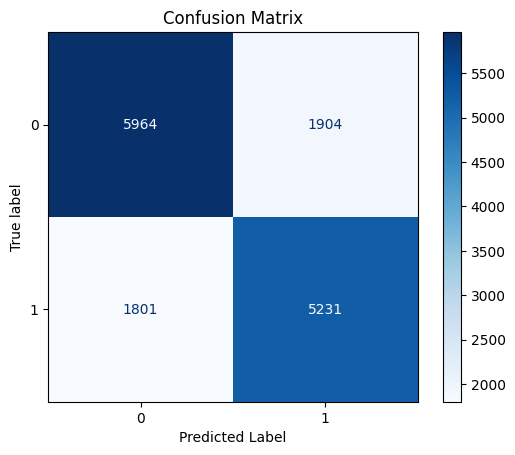

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter Tunning

In [ ]:
param_grid_xgb = {
    'model__n_estimators': [50, 100, 200],
    'model__max_depth': [3, 5, 7],
    'model__learning_rate': [0.01, 0.1, 0.2],
}

grid_search_xgb = GridSearchCV(model_pipline_xgb,
                               param_grid=param_grid_xgb,
                               n_jobs=-1, verbose=2)

xgb_tuned = grid_search_xgb.fit(X_train, y_train)

print("Best Estimator:", grid_search_xgb.best_estimator_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Estimator: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  OrdinalEncoder(categories=[['Poor',
                                                                              'Fair',
                                                                              'Good',
                                                                              'Excellent'],
                                                                             ['Low',
                                                                              'Medium',
                                                                              'High',
                                                                              'Very '
                                                                              'High'],
                                              

In [ ]:
y_preds_xgb_tn = xgb_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_xgb_tn))
auc_score_xgb_tn = roc_auc_score(y_preds_xgb_tn,y_test)
print(f"AUC-ROC Score: {auc_score_xgb_tn:.4f}")

              precision    recall  f1-score   support

           0       0.78      0.77      0.77      7868
           1       0.75      0.75      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7615


In [ ]:
#training accuracy
y_preds_train_xgb_tn = xgb_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_xgb_tn))

In [ ]:
cm_xgb_tn = confusion_matrix(y_test, y_preds_xgb_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_xgb_tn)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### SVM

In [ ]:
from sklearn.svm import SVC
model_pipline_svm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',SVC(random_state=123))
    ]
)

model_pipline_svm.fit(X_train,y_train)

y_preds = model_pipline_svm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.77      0.77      0.77      7868
           1       0.74      0.74      0.74      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC Score: 0.7520


In [ ]:
y_preds_train = model_pipline_svm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.78      0.78      0.78     31260
           1       0.76      0.75      0.76     28338

    accuracy                           0.77     59598
   macro avg       0.77      0.77      0.77     59598
weighted avg       0.77      0.77      0.77     59598



Text(0.5, 0, 'Predicted Label')

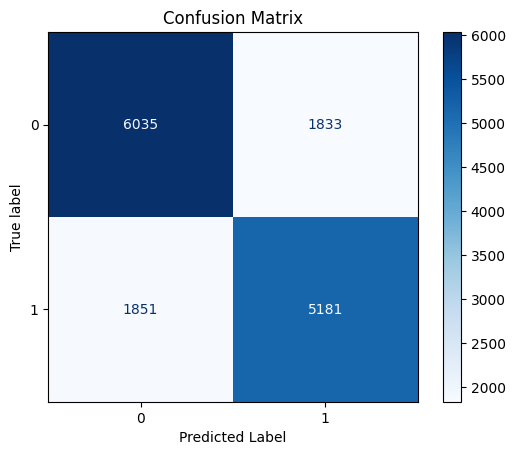

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
model_pipline_knn = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',KNeighborsClassifier(n_neighbors=20))
    ]
)

model_pipline_knn.fit(X_train,y_train)

y_preds = model_pipline_knn.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.71      0.76      0.74      7868
           1       0.71      0.66      0.68      7032

    accuracy                           0.71     14900
   macro avg       0.71      0.71      0.71     14900
weighted avg       0.71      0.71      0.71     14900

AUC-ROC Score: 0.7112


In [ ]:
y_preds_train = model_pipline_knn.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.75      0.80      0.77     31260
           1       0.76      0.70      0.73     28338

    accuracy                           0.75     59598
   macro avg       0.75      0.75      0.75     59598
weighted avg       0.75      0.75      0.75     59598



Text(0.5, 0, 'Predicted Label')

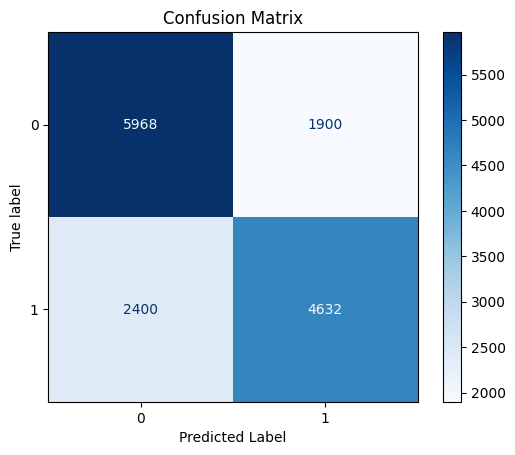

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter Tunning

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_neighbors': [2,3, 5,10,15,25],
    'model__weights': ['uniform', 'distance'],
    'model__metric': ['euclidean', 'manhattan']
}

grid_search_knn = GridSearchCV(model_pipline_knn,
                           param_grid=param_grid)
knn_tuned=grid_search_knn.fit(X_train,y_train)
print(grid_search_knn.best_estimator_)

[CV] END ..model__learning_rate=0.01, model__n_estimators=50; total time=   6.6s
[CV] END .model__learning_rate=0.01, model__n_estimators=100; total time=  12.2s
[CV] END ...model__learning_rate=0.1, model__n_estimators=50; total time=   5.5s
[CV] END ...model__learning_rate=0.1, model__n_estimators=50; total time=   6.4s
[CV] END ..model__learning_rate=0.1, model__n_estimators=200; total time=  25.0s
[CV] END ....model__learning_rate=1, model__n_estimators=100; total time=  13.6s
[CV] END ....model__learning_rate=1, model__n_estimators=200; total time=  25.4s
[CV] END ....model__learning_rate=2, model__n_estimators=200; total time=  15.7s
[CV] END ..model__learning_rate=0.01, model__n_estimators=50; total time=   7.6s
[CV] END .model__learning_rate=0.01, model__n_estimators=200; total time=  23.2s
[CV] END ..model__learning_rate=0.1, model__n_estimators=100; total time=  11.0s
[CV] END .....model__learning_rate=1, model__n_estimators=50; total time=   5.1s
[CV] END .....model__learnin

[CV] END .model__learning_rate=0.01, model__n_estimators=100; total time=  13.1s
[CV] END .model__learning_rate=0.01, model__n_estimators=200; total time=  22.4s
[CV] END ..model__learning_rate=0.1, model__n_estimators=200; total time=  25.2s
[CV] END ....model__learning_rate=1, model__n_estimators=100; total time=  13.4s
[CV] END .....model__learning_rate=2, model__n_estimators=50; total time=   6.7s
[CV] END ....model__learning_rate=2, model__n_estimators=100; total time=  12.8s
[CV] END ....model__learning_rate=2, model__n_estimators=200; total time=  16.7s
[CV] END ..model__learning_rate=0.01, model__n_estimators=50; total time=   7.6s
[CV] END .model__learning_rate=0.01, model__n_estimators=200; total time=  23.2s
[CV] END ..model__learning_rate=0.1, model__n_estimators=100; total time=  11.0s
[CV] END .....model__learning_rate=1, model__n_estimators=50; total time=   5.2s
[CV] END .....model__learning_rate=1, model__n_estimators=50; total time=   5.1s
[CV] END ....model__learning

[CV] END .model__learning_rate=0.01, model__n_estimators=100; total time=  13.3s
[CV] END ...model__learning_rate=0.1, model__n_estimators=50; total time=   5.6s
[CV] END ...model__learning_rate=0.1, model__n_estimators=50; total time=   5.5s
[CV] END ..model__learning_rate=0.1, model__n_estimators=100; total time=  12.4s
[CV] END ..model__learning_rate=0.1, model__n_estimators=200; total time=  25.7s
[CV] END ....model__learning_rate=1, model__n_estimators=200; total time=  25.3s
[CV] END ....model__learning_rate=2, model__n_estimators=200; total time=  19.5s
[CV] END .model__learning_rate=0.01, model__n_estimators=100; total time=  13.2s
[CV] END .model__learning_rate=0.01, model__n_estimators=200; total time=  22.4s
[CV] END ..model__learning_rate=0.1, model__n_estimators=200; total time=  19.9s
[CV] END ....model__learning_rate=1, model__n_estimators=100; total time=  11.1s
[CV] END .....model__learning_rate=2, model__n_estimators=50; total time=   5.9s
[CV] END ....model__learning

In [ ]:
y_preds_knn_tn = knn_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_knn_tn))
auc_score_knn_tn = roc_auc_score(y_preds_knn_tn,y_test)
print(f"AUC-ROC Score: {auc_score_knn_tn:.4f}")

              precision    recall  f1-score   support

           0       0.74      0.72      0.73      7868
           1       0.70      0.72      0.71      7032

    accuracy                           0.72     14900
   macro avg       0.72      0.72      0.72     14900
weighted avg       0.72      0.72      0.72     14900

AUC-ROC Score: 0.7198


In [ ]:
#training accuracy
y_preds_train_knn_tn = knn_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_knn_tn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31260
           1       1.00      1.00      1.00     28338

    accuracy                           1.00     59598
   macro avg       1.00      1.00      1.00     59598
weighted avg       1.00      1.00      1.00     59598



### Naive Bayes

In [ ]:
from sklearn.naive_bayes import BernoulliNB
model_pipline_nb = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',BernoulliNB())
    ]
)

model_pipline_nb.fit(X_train,y_train)

y_preds = model_pipline_nb.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.71      0.74      0.72      7868
           1       0.69      0.66      0.68      7032

    accuracy                           0.70     14900
   macro avg       0.70      0.70      0.70     14900
weighted avg       0.70      0.70      0.70     14900

AUC-ROC Score: 0.7011


In [ ]:
#training accuracy
y_preds_train = model_pipline_nb.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.70      0.74      0.72     31260
           1       0.70      0.65      0.67     28338

    accuracy                           0.70     59598
   macro avg       0.70      0.70      0.70     59598
weighted avg       0.70      0.70      0.70     59598



Text(0.5, 0, 'Predicted Label')

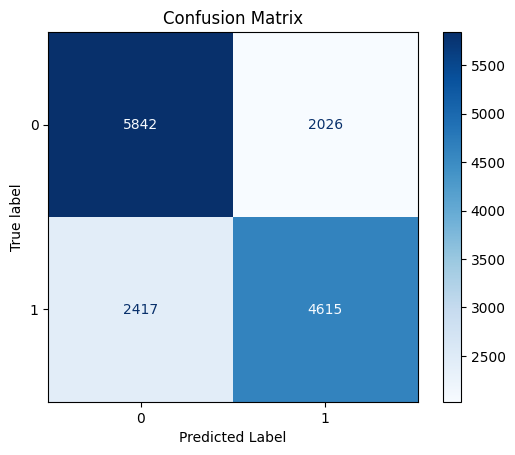

In [ ]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyperparameter Tunning

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__alpha': [0.1, 0.5, 1.0],
    'model__binarize': [0.0, 0.1, 0.5],
    'model__fit_prior': [True, False]
}

grid_search_nb = GridSearchCV(model_pipline_nb,
                           param_grid=param_grid,n_jobs=-1, verbose=2)
nb_tuned=grid_search_nb.fit(X_train,y_train)
print(grid_search_nb.best_estimator_)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  OrdinalEncoder(categories=[['Poor',
                                                                              'Fair',
                                                                              'Good',
                                                                              'Excellent'],
                                                                             ['Low',
                                                                              'Medium',
                                                                              'High',
                                                                              'Very '
                                                                              'High'],
                                                               

In [ ]:
y_preds_nb_tn = nb_tuned.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_nb_tn))
auc_score_nb_tn = roc_auc_score(y_preds_nb_tn,y_test)
print(f"AUC-ROC Score: {auc_score_nb_tn:.4f}")

              precision    recall  f1-score   support

           0       0.72      0.72      0.72      7868
           1       0.68      0.68      0.68      7032

    accuracy                           0.70     14900
   macro avg       0.70      0.70      0.70     14900
weighted avg       0.70      0.70      0.70     14900

AUC-ROC Score: 0.7005


In [ ]:
#training accuracy
y_preds_train = nb_tuned.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.71      0.72      0.72     31260
           1       0.69      0.68      0.68     28338

    accuracy                           0.70     59598
   macro avg       0.70      0.70      0.70     59598
weighted avg       0.70      0.70      0.70     59598



### Catboost

In [ ]:
#pip install catboost

  Using cached graphviz-0.20.3-py3-none-any.whl.metadata (12 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.1/27.1 MB 12.7 MB/s eta 0:00:0000:0100:01
Using cached graphviz-0.20.3-py3-none-any.whl (47 kB)

[notice] A new release of pip is available: 24.1.1 -> 24.2
[notice] To update, run: /opt/anaconda3/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from catboost import CatBoostClassifier

model = CatBoostClassifier(
    iterations=2000,          # Number of boosting iterations
    learning_rate=0.1,        # Learning rate
    depth=6,                  # Depth of the trees
    loss_function='Logloss',  # Loss function for binary classification
    eval_metric='AUC',        # Evaluation metric
    verbose=100,              # Print training progress every 100 iterations
    random_seed=123           # Ensures reproducibility
)

# Train the model
model.fit(X_train, y_train, eval_set=(X_test, y_test), cat_features=ordinal+norm)

# Make predictions on the test set
y_pred = model.predict(X_test)

0:	test: 0.8033384	best: 0.8033384 (0)	total: 104ms	remaining: 3m 27s
100:	test: 0.8542412	best: 0.8542412 (100)	total: 4.61s	remaining: 1m 26s
200:	test: 0.8540873	best: 0.8542412 (100)	total: 9.18s	remaining: 1m 22s
300:	test: 0.8532006	best: 0.8542412 (100)	total: 15.2s	remaining: 1m 25s
400:	test: 0.8527557	best: 0.8542412 (100)	total: 20s	remaining: 1m 19s
500:	test: 0.8520732	best: 0.8542412 (100)	total: 25.5s	remaining: 1m 16s
600:	test: 0.8517986	best: 0.8542412 (100)	total: 31.1s	remaining: 1m 12s
700:	test: 0.8510184	best: 0.8542412 (100)	total: 36.5s	remaining: 1m 7s
800:	test: 0.8504122	best: 0.8542412 (100)	total: 41.4s	remaining: 1m 2s
900:	test: 0.8500168	best: 0.8542412 (100)	total: 47s	remaining: 57.4s
1000:	test: 0.8494631	best: 0.8542412 (100)	total: 52.9s	remaining: 52.8s
1100:	test: 0.8490549	best: 0.8542412 (100)	total: 58.6s	remaining: 47.8s
1200:	test: 0.8484307	best: 0.8542412 (100)	total: 1m 4s	remaining: 42.8s
1300:	test: 0.8478770	best: 0.8542412 (100)	total

In [ ]:
print(classification_report(y_true=y_test,y_pred=y_pred))
auc_score = roc_auc_score(y_pred,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.78      0.77      0.77      7868
           1       0.75      0.75      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7619


In [ ]:
#training accuracy
y_preds_train_cat1 = model.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_cat1))

              precision    recall  f1-score   support

           0       0.78      0.77      0.77     31260
           1       0.75      0.75      0.75     28338

    accuracy                           0.76     59598
   macro avg       0.76      0.76      0.76     59598
weighted avg       0.76      0.76      0.76     59598



Text(0.5, 0, 'Predicted Label')

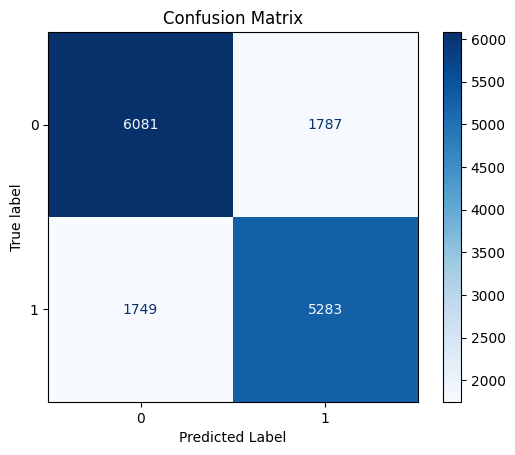

In [ ]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper Parameter tunning

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [6, 8, 10],
    'n_estimators': [100, 200, 300],
}

model111 = CatBoostClassifier(learning_rate=0.1, depth=6, n_estimators=100, l2_leaf_reg=1, subsample=0.8, cat_features=ordinal+norm)
grid_search111 = GridSearchCV(model111, param_grid, cv=3, scoring='accuracy')
nb_tuned1=grid_search111.fit(X_train,y_train)
print(grid_search111.best_estimator_)

0:	learn: 0.6908798	total: 31.1ms	remaining: 3.08s
1:	learn: 0.6885899	total: 48.3ms	remaining: 2.37s
2:	learn: 0.6862914	total: 66.2ms	remaining: 2.14s
3:	learn: 0.6840645	total: 81.7ms	remaining: 1.96s
4:	learn: 0.6818658	total: 101ms	remaining: 1.93s
5:	learn: 0.6797354	total: 117ms	remaining: 1.83s
6:	learn: 0.6776408	total: 134ms	remaining: 1.77s
7:	learn: 0.6756057	total: 149ms	remaining: 1.72s
8:	learn: 0.6736245	total: 164ms	remaining: 1.66s
9:	learn: 0.6716886	total: 180ms	remaining: 1.62s
10:	learn: 0.6698562	total: 196ms	remaining: 1.59s
11:	learn: 0.6679851	total: 212ms	remaining: 1.55s
12:	learn: 0.6662693	total: 227ms	remaining: 1.52s
13:	learn: 0.6644585	total: 247ms	remaining: 1.51s
14:	learn: 0.6617139	total: 269ms	remaining: 1.52s
15:	learn: 0.6589332	total: 289ms	remaining: 1.52s
16:	learn: 0.6563747	total: 307ms	remaining: 1.5s
17:	learn: 0.6536532	total: 325ms	remaining: 1.48s
18:	learn: 0.6510506	total: 350ms	remaining: 1.49s
19:	learn: 0.6484582	total: 371ms	rema

68:	learn: 0.5723444	total: 1.46s	remaining: 656ms
69:	learn: 0.5712412	total: 1.48s	remaining: 635ms
70:	learn: 0.5699940	total: 1.5s	remaining: 615ms
71:	learn: 0.5687760	total: 1.53s	remaining: 596ms
72:	learn: 0.5676921	total: 1.55s	remaining: 575ms
73:	learn: 0.5665519	total: 1.58s	remaining: 554ms
74:	learn: 0.5654052	total: 1.6s	remaining: 532ms
75:	learn: 0.5642840	total: 1.62s	remaining: 510ms
76:	learn: 0.5632315	total: 1.64s	remaining: 488ms
77:	learn: 0.5622580	total: 1.65s	remaining: 466ms
78:	learn: 0.5612067	total: 1.68s	remaining: 445ms
79:	learn: 0.5603146	total: 1.7s	remaining: 425ms
80:	learn: 0.5592550	total: 1.72s	remaining: 404ms
81:	learn: 0.5582475	total: 1.74s	remaining: 382ms
82:	learn: 0.5572893	total: 1.76s	remaining: 361ms
83:	learn: 0.5563356	total: 1.79s	remaining: 340ms
84:	learn: 0.5555110	total: 1.81s	remaining: 319ms
85:	learn: 0.5546483	total: 1.83s	remaining: 298ms
86:	learn: 0.5537380	total: 1.85s	remaining: 277ms
87:	learn: 0.5530377	total: 1.87s	

33:	learn: 0.6027463	total: 1.14s	remaining: 5.56s
34:	learn: 0.6007668	total: 1.17s	remaining: 5.51s
35:	learn: 0.5989018	total: 1.2s	remaining: 5.45s
36:	learn: 0.5970232	total: 1.22s	remaining: 5.38s
37:	learn: 0.5952225	total: 1.25s	remaining: 5.32s
38:	learn: 0.5934729	total: 1.27s	remaining: 5.26s
39:	learn: 0.5917540	total: 1.29s	remaining: 5.18s
40:	learn: 0.5900803	total: 1.32s	remaining: 5.14s
41:	learn: 0.5884328	total: 1.36s	remaining: 5.12s
42:	learn: 0.5868155	total: 1.4s	remaining: 5.11s
43:	learn: 0.5853765	total: 1.44s	remaining: 5.12s
44:	learn: 0.5838385	total: 1.47s	remaining: 5.08s
45:	learn: 0.5823369	total: 1.5s	remaining: 5.03s
46:	learn: 0.5808660	total: 1.53s	remaining: 4.97s
47:	learn: 0.5794530	total: 1.55s	remaining: 4.91s
48:	learn: 0.5780559	total: 1.58s	remaining: 4.86s
49:	learn: 0.5766955	total: 1.6s	remaining: 4.8s
50:	learn: 0.5753859	total: 1.63s	remaining: 4.76s
51:	learn: 0.5741218	total: 1.65s	remaining: 4.71s
52:	learn: 0.5728748	total: 1.68s	re

197:	learn: 0.5015749	total: 6.54s	remaining: 66.1ms
198:	learn: 0.5013507	total: 6.58s	remaining: 33.1ms
199:	learn: 0.5011387	total: 6.61s	remaining: 0us
0:	learn: 0.6894903	total: 30.1ms	remaining: 5.98s
1:	learn: 0.6859623	total: 59.1ms	remaining: 5.86s
2:	learn: 0.6825562	total: 80ms	remaining: 5.25s
3:	learn: 0.6791389	total: 106ms	remaining: 5.18s
4:	learn: 0.6758065	total: 126ms	remaining: 4.93s
5:	learn: 0.6726669	total: 147ms	remaining: 4.75s
6:	learn: 0.6695925	total: 167ms	remaining: 4.61s
7:	learn: 0.6664645	total: 187ms	remaining: 4.48s
8:	learn: 0.6634980	total: 204ms	remaining: 4.33s
9:	learn: 0.6605870	total: 222ms	remaining: 4.22s
10:	learn: 0.6577894	total: 242ms	remaining: 4.16s
11:	learn: 0.6549809	total: 260ms	remaining: 4.07s
12:	learn: 0.6522787	total: 278ms	remaining: 4s
13:	learn: 0.6498461	total: 296ms	remaining: 3.94s
14:	learn: 0.6472368	total: 315ms	remaining: 3.89s
15:	learn: 0.6449047	total: 335ms	remaining: 3.85s
16:	learn: 0.6424611	total: 357ms	remain

158:	learn: 0.5127635	total: 5.32s	remaining: 1.37s
159:	learn: 0.5124591	total: 5.36s	remaining: 1.34s
160:	learn: 0.5122067	total: 5.4s	remaining: 1.31s
161:	learn: 0.5119402	total: 5.43s	remaining: 1.27s
162:	learn: 0.5116179	total: 5.46s	remaining: 1.24s
163:	learn: 0.5113497	total: 5.5s	remaining: 1.21s
164:	learn: 0.5110231	total: 5.54s	remaining: 1.17s
165:	learn: 0.5107387	total: 5.57s	remaining: 1.14s
166:	learn: 0.5105150	total: 5.61s	remaining: 1.11s
167:	learn: 0.5102591	total: 5.64s	remaining: 1.07s
168:	learn: 0.5100257	total: 5.67s	remaining: 1.04s
169:	learn: 0.5097584	total: 5.71s	remaining: 1.01s
170:	learn: 0.5094483	total: 5.74s	remaining: 974ms
171:	learn: 0.5091433	total: 5.77s	remaining: 940ms
172:	learn: 0.5088787	total: 5.81s	remaining: 907ms
173:	learn: 0.5086459	total: 5.84s	remaining: 873ms
174:	learn: 0.5084215	total: 5.87s	remaining: 839ms
175:	learn: 0.5081720	total: 5.9s	remaining: 805ms
176:	learn: 0.5079257	total: 5.93s	remaining: 770ms
177:	learn: 0.5

119:	learn: 0.5237271	total: 4.09s	remaining: 2.73s
120:	learn: 0.5232637	total: 4.13s	remaining: 2.69s
121:	learn: 0.5228640	total: 4.17s	remaining: 2.67s
122:	learn: 0.5225183	total: 4.21s	remaining: 2.63s
123:	learn: 0.5221571	total: 4.26s	remaining: 2.61s
124:	learn: 0.5217779	total: 4.3s	remaining: 2.58s
125:	learn: 0.5214276	total: 4.34s	remaining: 2.55s
126:	learn: 0.5210738	total: 4.39s	remaining: 2.52s
127:	learn: 0.5206715	total: 4.42s	remaining: 2.48s
128:	learn: 0.5203231	total: 4.46s	remaining: 2.45s
129:	learn: 0.5198803	total: 4.49s	remaining: 2.42s
130:	learn: 0.5195359	total: 4.53s	remaining: 2.39s
131:	learn: 0.5191635	total: 4.57s	remaining: 2.36s
132:	learn: 0.5188253	total: 4.62s	remaining: 2.33s
133:	learn: 0.5185159	total: 4.66s	remaining: 2.29s
134:	learn: 0.5181614	total: 4.69s	remaining: 2.26s
135:	learn: 0.5178291	total: 4.72s	remaining: 2.22s
136:	learn: 0.5174806	total: 4.77s	remaining: 2.19s
137:	learn: 0.5170834	total: 4.8s	remaining: 2.16s
138:	learn: 0.

84:	learn: 0.5443104	total: 2.92s	remaining: 7.4s
85:	learn: 0.5436097	total: 2.96s	remaining: 7.36s
86:	learn: 0.5428820	total: 3s	remaining: 7.35s
87:	learn: 0.5422177	total: 3.04s	remaining: 7.33s
88:	learn: 0.5415560	total: 3.08s	remaining: 7.3s
89:	learn: 0.5408842	total: 3.1s	remaining: 7.25s
90:	learn: 0.5402877	total: 3.14s	remaining: 7.21s
91:	learn: 0.5396759	total: 3.17s	remaining: 7.17s
92:	learn: 0.5391024	total: 3.2s	remaining: 7.13s
93:	learn: 0.5384475	total: 3.24s	remaining: 7.1s
94:	learn: 0.5378066	total: 3.28s	remaining: 7.08s
95:	learn: 0.5371377	total: 3.32s	remaining: 7.05s
96:	learn: 0.5364947	total: 3.35s	remaining: 7s
97:	learn: 0.5358678	total: 3.38s	remaining: 6.96s
98:	learn: 0.5351806	total: 3.41s	remaining: 6.92s
99:	learn: 0.5345540	total: 3.44s	remaining: 6.88s
100:	learn: 0.5339663	total: 3.47s	remaining: 6.84s
101:	learn: 0.5334916	total: 3.5s	remaining: 6.8s
102:	learn: 0.5329011	total: 3.53s	remaining: 6.75s
103:	learn: 0.5323679	total: 3.56s	remain

247:	learn: 0.4926204	total: 8.8s	remaining: 1.84s
248:	learn: 0.4924024	total: 8.83s	remaining: 1.81s
249:	learn: 0.4922574	total: 8.86s	remaining: 1.77s
250:	learn: 0.4920736	total: 8.9s	remaining: 1.74s
251:	learn: 0.4919319	total: 8.93s	remaining: 1.7s
252:	learn: 0.4918079	total: 8.96s	remaining: 1.66s
253:	learn: 0.4916708	total: 8.98s	remaining: 1.63s
254:	learn: 0.4915228	total: 9.02s	remaining: 1.59s
255:	learn: 0.4913719	total: 9.05s	remaining: 1.56s
256:	learn: 0.4912222	total: 9.09s	remaining: 1.52s
257:	learn: 0.4910926	total: 9.12s	remaining: 1.48s
258:	learn: 0.4909375	total: 9.15s	remaining: 1.45s
259:	learn: 0.4908091	total: 9.19s	remaining: 1.41s
260:	learn: 0.4906487	total: 9.23s	remaining: 1.38s
261:	learn: 0.4905098	total: 9.26s	remaining: 1.34s
262:	learn: 0.4903713	total: 9.3s	remaining: 1.31s
263:	learn: 0.4902252	total: 9.35s	remaining: 1.27s
264:	learn: 0.4900933	total: 9.38s	remaining: 1.24s
265:	learn: 0.4899347	total: 9.43s	remaining: 1.21s
266:	learn: 0.48

108:	learn: 0.5309950	total: 3.29s	remaining: 5.77s
109:	learn: 0.5305119	total: 3.33s	remaining: 5.76s
110:	learn: 0.5300331	total: 3.36s	remaining: 5.72s
111:	learn: 0.5296354	total: 3.39s	remaining: 5.69s
112:	learn: 0.5291243	total: 3.42s	remaining: 5.66s
113:	learn: 0.5286233	total: 3.45s	remaining: 5.63s
114:	learn: 0.5281989	total: 3.48s	remaining: 5.6s
115:	learn: 0.5277016	total: 3.51s	remaining: 5.57s
116:	learn: 0.5273133	total: 3.54s	remaining: 5.54s
117:	learn: 0.5268427	total: 3.57s	remaining: 5.51s
118:	learn: 0.5264824	total: 3.6s	remaining: 5.48s
119:	learn: 0.5259850	total: 3.63s	remaining: 5.45s
120:	learn: 0.5256187	total: 3.66s	remaining: 5.42s
121:	learn: 0.5252826	total: 3.69s	remaining: 5.38s
122:	learn: 0.5248961	total: 3.72s	remaining: 5.35s
123:	learn: 0.5244762	total: 3.75s	remaining: 5.33s
124:	learn: 0.5241434	total: 3.78s	remaining: 5.3s
125:	learn: 0.5237694	total: 3.81s	remaining: 5.26s
126:	learn: 0.5233761	total: 3.84s	remaining: 5.23s
127:	learn: 0.5

268:	learn: 0.4909328	total: 8.4s	remaining: 968ms
269:	learn: 0.4907974	total: 8.45s	remaining: 939ms
270:	learn: 0.4906778	total: 8.49s	remaining: 908ms
271:	learn: 0.4905442	total: 8.53s	remaining: 878ms
272:	learn: 0.4904003	total: 8.57s	remaining: 848ms
273:	learn: 0.4902782	total: 8.63s	remaining: 819ms
274:	learn: 0.4901374	total: 8.72s	remaining: 792ms
275:	learn: 0.4900184	total: 8.75s	remaining: 761ms
276:	learn: 0.4898928	total: 8.79s	remaining: 730ms
277:	learn: 0.4897575	total: 8.83s	remaining: 699ms
278:	learn: 0.4896185	total: 8.87s	remaining: 668ms
279:	learn: 0.4895041	total: 8.92s	remaining: 637ms
280:	learn: 0.4893661	total: 8.96s	remaining: 606ms
281:	learn: 0.4892359	total: 9.01s	remaining: 575ms
282:	learn: 0.4891246	total: 9.05s	remaining: 543ms
283:	learn: 0.4889880	total: 9.09s	remaining: 512ms
284:	learn: 0.4888706	total: 9.12s	remaining: 480ms
285:	learn: 0.4887577	total: 9.16s	remaining: 448ms
286:	learn: 0.4886242	total: 9.2s	remaining: 417ms
287:	learn: 0.

135:	learn: 0.5178291	total: 4.18s	remaining: 5.04s
136:	learn: 0.5174806	total: 4.21s	remaining: 5.01s
137:	learn: 0.5170834	total: 4.25s	remaining: 4.99s
138:	learn: 0.5167486	total: 4.28s	remaining: 4.96s
139:	learn: 0.5164154	total: 4.31s	remaining: 4.92s
140:	learn: 0.5160601	total: 4.33s	remaining: 4.89s
141:	learn: 0.5157364	total: 4.38s	remaining: 4.87s
142:	learn: 0.5154376	total: 4.41s	remaining: 4.85s
143:	learn: 0.5151324	total: 4.45s	remaining: 4.82s
144:	learn: 0.5147993	total: 4.48s	remaining: 4.79s
145:	learn: 0.5144891	total: 4.51s	remaining: 4.75s
146:	learn: 0.5141472	total: 4.53s	remaining: 4.72s
147:	learn: 0.5137780	total: 4.56s	remaining: 4.68s
148:	learn: 0.5133750	total: 4.59s	remaining: 4.65s
149:	learn: 0.5130418	total: 4.62s	remaining: 4.62s
150:	learn: 0.5127067	total: 4.65s	remaining: 4.59s
151:	learn: 0.5124167	total: 4.69s	remaining: 4.57s
152:	learn: 0.5121388	total: 4.72s	remaining: 4.54s
153:	learn: 0.5118675	total: 4.76s	remaining: 4.51s
154:	learn: 

297:	learn: 0.4848075	total: 9.46s	remaining: 63.5ms
298:	learn: 0.4846973	total: 9.5s	remaining: 31.8ms
299:	learn: 0.4845971	total: 9.53s	remaining: 0us
0:	learn: 0.6718512	total: 20.5ms	remaining: 2.02s
1:	learn: 0.6540857	total: 38.7ms	remaining: 1.9s
2:	learn: 0.6288842	total: 55.5ms	remaining: 1.79s
3:	learn: 0.6096804	total: 74.5ms	remaining: 1.79s
4:	learn: 0.5957914	total: 91.7ms	remaining: 1.74s
5:	learn: 0.5847502	total: 107ms	remaining: 1.68s
6:	learn: 0.5747333	total: 125ms	remaining: 1.67s
7:	learn: 0.5632561	total: 141ms	remaining: 1.62s
8:	learn: 0.5528363	total: 157ms	remaining: 1.58s
9:	learn: 0.5443664	total: 172ms	remaining: 1.55s
10:	learn: 0.5376313	total: 189ms	remaining: 1.53s
11:	learn: 0.5323924	total: 208ms	remaining: 1.53s
12:	learn: 0.5278723	total: 228ms	remaining: 1.52s
13:	learn: 0.5235226	total: 247ms	remaining: 1.52s
14:	learn: 0.5190350	total: 270ms	remaining: 1.53s
15:	learn: 0.5155932	total: 292ms	remaining: 1.53s
16:	learn: 0.5130820	total: 314ms	r

60:	learn: 0.4687640	total: 1.28s	remaining: 818ms
61:	learn: 0.4684154	total: 1.3s	remaining: 797ms
62:	learn: 0.4681910	total: 1.32s	remaining: 776ms
63:	learn: 0.4677913	total: 1.34s	remaining: 755ms
64:	learn: 0.4675713	total: 1.36s	remaining: 733ms
65:	learn: 0.4672646	total: 1.38s	remaining: 711ms
66:	learn: 0.4670761	total: 1.4s	remaining: 689ms
67:	learn: 0.4667891	total: 1.43s	remaining: 672ms
68:	learn: 0.4665908	total: 1.45s	remaining: 651ms
69:	learn: 0.4663329	total: 1.47s	remaining: 630ms
70:	learn: 0.4662177	total: 1.49s	remaining: 609ms
71:	learn: 0.4661906	total: 1.5s	remaining: 586ms
72:	learn: 0.4660456	total: 1.53s	remaining: 565ms
73:	learn: 0.4657971	total: 1.54s	remaining: 543ms
74:	learn: 0.4655082	total: 1.56s	remaining: 522ms
75:	learn: 0.4653053	total: 1.58s	remaining: 500ms
76:	learn: 0.4652198	total: 1.6s	remaining: 478ms
77:	learn: 0.4649755	total: 1.62s	remaining: 457ms
78:	learn: 0.4647461	total: 1.64s	remaining: 436ms
79:	learn: 0.4645321	total: 1.66s	r

28:	learn: 0.4852196	total: 864ms	remaining: 5.09s
29:	learn: 0.4841272	total: 903ms	remaining: 5.12s
30:	learn: 0.4832003	total: 933ms	remaining: 5.08s
31:	learn: 0.4821138	total: 962ms	remaining: 5.05s
32:	learn: 0.4811380	total: 995ms	remaining: 5.03s
33:	learn: 0.4802939	total: 1.03s	remaining: 5.01s
34:	learn: 0.4792502	total: 1.06s	remaining: 5s
35:	learn: 0.4785765	total: 1.09s	remaining: 4.99s
36:	learn: 0.4778699	total: 1.13s	remaining: 5s
37:	learn: 0.4771671	total: 1.17s	remaining: 4.99s
38:	learn: 0.4766552	total: 1.21s	remaining: 4.99s
39:	learn: 0.4759444	total: 1.25s	remaining: 4.99s
40:	learn: 0.4753249	total: 1.28s	remaining: 4.96s
41:	learn: 0.4746162	total: 1.31s	remaining: 4.92s
42:	learn: 0.4742193	total: 1.34s	remaining: 4.89s
43:	learn: 0.4736698	total: 1.37s	remaining: 4.87s
44:	learn: 0.4732485	total: 1.4s	remaining: 4.84s
45:	learn: 0.4728594	total: 1.44s	remaining: 4.83s
46:	learn: 0.4723546	total: 1.48s	remaining: 4.81s
47:	learn: 0.4718549	total: 1.52s	rema

193:	learn: 0.4454650	total: 6.3s	remaining: 195ms
194:	learn: 0.4452562	total: 6.33s	remaining: 162ms
195:	learn: 0.4450479	total: 6.37s	remaining: 130ms
196:	learn: 0.4448859	total: 6.4s	remaining: 97.5ms
197:	learn: 0.4447685	total: 6.43s	remaining: 65ms
198:	learn: 0.4445052	total: 6.46s	remaining: 32.5ms
199:	learn: 0.4442567	total: 6.49s	remaining: 0us
0:	learn: 0.6591943	total: 22.7ms	remaining: 4.51s
1:	learn: 0.6332363	total: 45.1ms	remaining: 4.47s
2:	learn: 0.6091091	total: 65.1ms	remaining: 4.28s
3:	learn: 0.5895997	total: 87.3ms	remaining: 4.28s
4:	learn: 0.5743327	total: 105ms	remaining: 4.08s
5:	learn: 0.5629598	total: 125ms	remaining: 4.03s
6:	learn: 0.5535480	total: 145ms	remaining: 3.99s
7:	learn: 0.5462331	total: 165ms	remaining: 3.97s
8:	learn: 0.5399748	total: 188ms	remaining: 3.99s
9:	learn: 0.5346124	total: 211ms	remaining: 4s
10:	learn: 0.5288862	total: 235ms	remaining: 4.03s
11:	learn: 0.5246035	total: 258ms	remaining: 4.03s
12:	learn: 0.5202357	total: 280ms	re

159:	learn: 0.4512256	total: 4.79s	remaining: 1.2s
160:	learn: 0.4509877	total: 4.81s	remaining: 1.17s
161:	learn: 0.4508742	total: 4.85s	remaining: 1.14s
162:	learn: 0.4506891	total: 4.88s	remaining: 1.11s
163:	learn: 0.4504148	total: 4.91s	remaining: 1.08s
164:	learn: 0.4502518	total: 4.95s	remaining: 1.05s
165:	learn: 0.4500582	total: 4.98s	remaining: 1.02s
166:	learn: 0.4499450	total: 5s	remaining: 989ms
167:	learn: 0.4497508	total: 5.04s	remaining: 960ms
168:	learn: 0.4497081	total: 5.07s	remaining: 930ms
169:	learn: 0.4495896	total: 5.11s	remaining: 901ms
170:	learn: 0.4494617	total: 5.13s	remaining: 871ms
171:	learn: 0.4493404	total: 5.16s	remaining: 840ms
172:	learn: 0.4492425	total: 5.19s	remaining: 810ms
173:	learn: 0.4490234	total: 5.22s	remaining: 780ms
174:	learn: 0.4487841	total: 5.25s	remaining: 750ms
175:	learn: 0.4485765	total: 5.29s	remaining: 721ms
176:	learn: 0.4484393	total: 5.33s	remaining: 692ms
177:	learn: 0.4482273	total: 5.36s	remaining: 663ms
178:	learn: 0.44

122:	learn: 0.4556569	total: 3.54s	remaining: 2.21s
123:	learn: 0.4554772	total: 3.57s	remaining: 2.19s
124:	learn: 0.4553687	total: 3.6s	remaining: 2.16s
125:	learn: 0.4551768	total: 3.63s	remaining: 2.13s
126:	learn: 0.4549201	total: 3.67s	remaining: 2.11s
127:	learn: 0.4547200	total: 3.69s	remaining: 2.08s
128:	learn: 0.4544362	total: 3.73s	remaining: 2.05s
129:	learn: 0.4542699	total: 3.77s	remaining: 2.03s
130:	learn: 0.4541862	total: 3.82s	remaining: 2.01s
131:	learn: 0.4540669	total: 3.85s	remaining: 1.99s
132:	learn: 0.4538157	total: 3.9s	remaining: 1.96s
133:	learn: 0.4537416	total: 3.93s	remaining: 1.94s
134:	learn: 0.4535792	total: 3.97s	remaining: 1.91s
135:	learn: 0.4534014	total: 4.01s	remaining: 1.89s
136:	learn: 0.4532995	total: 4.05s	remaining: 1.86s
137:	learn: 0.4530974	total: 4.09s	remaining: 1.84s
138:	learn: 0.4529881	total: 4.13s	remaining: 1.81s
139:	learn: 0.4528027	total: 4.17s	remaining: 1.79s
140:	learn: 0.4525716	total: 4.21s	remaining: 1.76s
141:	learn: 0.

87:	learn: 0.4626809	total: 2.83s	remaining: 6.82s
88:	learn: 0.4624703	total: 2.86s	remaining: 6.79s
89:	learn: 0.4623075	total: 2.9s	remaining: 6.76s
90:	learn: 0.4621061	total: 2.93s	remaining: 6.72s
91:	learn: 0.4619564	total: 2.95s	remaining: 6.68s
92:	learn: 0.4617104	total: 2.98s	remaining: 6.64s
93:	learn: 0.4615190	total: 3.02s	remaining: 6.62s
94:	learn: 0.4613500	total: 3.05s	remaining: 6.59s
95:	learn: 0.4611371	total: 3.08s	remaining: 6.55s
96:	learn: 0.4609653	total: 3.12s	remaining: 6.53s
97:	learn: 0.4607459	total: 3.15s	remaining: 6.5s
98:	learn: 0.4605883	total: 3.18s	remaining: 6.46s
99:	learn: 0.4604509	total: 3.21s	remaining: 6.42s
100:	learn: 0.4602911	total: 3.24s	remaining: 6.39s
101:	learn: 0.4601190	total: 3.27s	remaining: 6.35s
102:	learn: 0.4600025	total: 3.3s	remaining: 6.31s
103:	learn: 0.4598490	total: 3.34s	remaining: 6.29s
104:	learn: 0.4597520	total: 3.37s	remaining: 6.25s
105:	learn: 0.4596587	total: 3.4s	remaining: 6.21s
106:	learn: 0.4594656	total: 

249:	learn: 0.4375511	total: 8.24s	remaining: 1.65s
250:	learn: 0.4373698	total: 8.27s	remaining: 1.61s
251:	learn: 0.4371986	total: 8.3s	remaining: 1.58s
252:	learn: 0.4370202	total: 8.33s	remaining: 1.55s
253:	learn: 0.4369540	total: 8.37s	remaining: 1.51s
254:	learn: 0.4367834	total: 8.4s	remaining: 1.48s
255:	learn: 0.4366777	total: 8.44s	remaining: 1.45s
256:	learn: 0.4365721	total: 8.47s	remaining: 1.42s
257:	learn: 0.4364145	total: 8.51s	remaining: 1.39s
258:	learn: 0.4363694	total: 8.54s	remaining: 1.35s
259:	learn: 0.4362256	total: 8.58s	remaining: 1.32s
260:	learn: 0.4361094	total: 8.61s	remaining: 1.29s
261:	learn: 0.4359599	total: 8.64s	remaining: 1.25s
262:	learn: 0.4357568	total: 8.68s	remaining: 1.22s
263:	learn: 0.4357057	total: 8.71s	remaining: 1.19s
264:	learn: 0.4356262	total: 8.73s	remaining: 1.15s
265:	learn: 0.4354553	total: 8.77s	remaining: 1.12s
266:	learn: 0.4352969	total: 8.8s	remaining: 1.09s
267:	learn: 0.4351434	total: 8.83s	remaining: 1.05s
268:	learn: 0.4

113:	learn: 0.4589979	total: 3.73s	remaining: 6.08s
114:	learn: 0.4589096	total: 3.77s	remaining: 6.06s
115:	learn: 0.4586672	total: 3.81s	remaining: 6.04s
116:	learn: 0.4585140	total: 3.85s	remaining: 6.02s
117:	learn: 0.4583538	total: 3.89s	remaining: 6.01s
118:	learn: 0.4581921	total: 3.93s	remaining: 5.97s
119:	learn: 0.4580923	total: 3.97s	remaining: 5.95s
120:	learn: 0.4579216	total: 4.01s	remaining: 5.94s
121:	learn: 0.4576726	total: 4.05s	remaining: 5.91s
122:	learn: 0.4575074	total: 4.1s	remaining: 5.9s
123:	learn: 0.4573356	total: 4.15s	remaining: 5.89s
124:	learn: 0.4571681	total: 4.19s	remaining: 5.86s
125:	learn: 0.4570236	total: 4.22s	remaining: 5.83s
126:	learn: 0.4567826	total: 4.26s	remaining: 5.8s
127:	learn: 0.4566192	total: 4.3s	remaining: 5.77s
128:	learn: 0.4564302	total: 4.33s	remaining: 5.74s
129:	learn: 0.4562208	total: 4.37s	remaining: 5.72s
130:	learn: 0.4560799	total: 4.41s	remaining: 5.69s
131:	learn: 0.4558489	total: 4.45s	remaining: 5.66s
132:	learn: 0.45

274:	learn: 0.4353258	total: 9.2s	remaining: 837ms
275:	learn: 0.4352099	total: 9.23s	remaining: 803ms
276:	learn: 0.4349765	total: 9.27s	remaining: 769ms
277:	learn: 0.4349262	total: 9.3s	remaining: 736ms
278:	learn: 0.4347498	total: 9.34s	remaining: 703ms
279:	learn: 0.4346139	total: 9.38s	remaining: 670ms
280:	learn: 0.4345165	total: 9.43s	remaining: 637ms
281:	learn: 0.4343828	total: 9.47s	remaining: 604ms
282:	learn: 0.4342319	total: 9.5s	remaining: 571ms
283:	learn: 0.4341869	total: 9.54s	remaining: 537ms
284:	learn: 0.4340304	total: 9.57s	remaining: 504ms
285:	learn: 0.4339741	total: 9.6s	remaining: 470ms
286:	learn: 0.4338856	total: 9.63s	remaining: 436ms
287:	learn: 0.4337152	total: 9.66s	remaining: 403ms
288:	learn: 0.4335349	total: 9.7s	remaining: 369ms
289:	learn: 0.4334385	total: 9.74s	remaining: 336ms
290:	learn: 0.4333192	total: 9.77s	remaining: 302ms
291:	learn: 0.4331671	total: 9.81s	remaining: 269ms
292:	learn: 0.4330399	total: 9.85s	remaining: 235ms
293:	learn: 0.433

137:	learn: 0.4530974	total: 4.37s	remaining: 5.12s
138:	learn: 0.4529881	total: 4.4s	remaining: 5.09s
139:	learn: 0.4528027	total: 4.43s	remaining: 5.07s
140:	learn: 0.4525716	total: 4.47s	remaining: 5.04s
141:	learn: 0.4524777	total: 4.5s	remaining: 5.01s
142:	learn: 0.4523322	total: 4.54s	remaining: 4.99s
143:	learn: 0.4522034	total: 4.58s	remaining: 4.96s
144:	learn: 0.4519430	total: 4.61s	remaining: 4.93s
145:	learn: 0.4518791	total: 4.64s	remaining: 4.9s
146:	learn: 0.4517575	total: 4.68s	remaining: 4.87s
147:	learn: 0.4516661	total: 4.71s	remaining: 4.84s
148:	learn: 0.4514734	total: 4.75s	remaining: 4.81s
149:	learn: 0.4513540	total: 4.78s	remaining: 4.78s
150:	learn: 0.4511447	total: 4.81s	remaining: 4.75s
151:	learn: 0.4509080	total: 4.85s	remaining: 4.72s
152:	learn: 0.4507075	total: 4.88s	remaining: 4.69s
153:	learn: 0.4505246	total: 4.92s	remaining: 4.67s
154:	learn: 0.4503779	total: 4.96s	remaining: 4.64s
155:	learn: 0.4501421	total: 5s	remaining: 4.62s
156:	learn: 0.4499

299:	learn: 0.4301916	total: 10.2s	remaining: 0us
0:	learn: 0.6535669	total: 17.2ms	remaining: 1.7s
1:	learn: 0.6081834	total: 33.6ms	remaining: 1.65s
2:	learn: 0.5802848	total: 50.2ms	remaining: 1.62s
3:	learn: 0.5544865	total: 65.9ms	remaining: 1.58s
4:	learn: 0.5390039	total: 79.7ms	remaining: 1.51s
5:	learn: 0.5276348	total: 94.7ms	remaining: 1.48s
6:	learn: 0.5198738	total: 109ms	remaining: 1.45s
7:	learn: 0.5137993	total: 123ms	remaining: 1.41s
8:	learn: 0.5067136	total: 139ms	remaining: 1.4s
9:	learn: 0.5000328	total: 154ms	remaining: 1.38s
10:	learn: 0.4959993	total: 168ms	remaining: 1.36s
11:	learn: 0.4924958	total: 184ms	remaining: 1.35s
12:	learn: 0.4894555	total: 199ms	remaining: 1.33s
13:	learn: 0.4871207	total: 214ms	remaining: 1.31s
14:	learn: 0.4844028	total: 230ms	remaining: 1.3s
15:	learn: 0.4819966	total: 246ms	remaining: 1.29s
16:	learn: 0.4804411	total: 262ms	remaining: 1.28s
17:	learn: 0.4790563	total: 282ms	remaining: 1.28s
18:	learn: 0.4781033	total: 299ms	remai

61:	learn: 0.4577294	total: 1.3s	remaining: 800ms
62:	learn: 0.4574722	total: 1.33s	remaining: 779ms
63:	learn: 0.4570412	total: 1.35s	remaining: 761ms
64:	learn: 0.4568135	total: 1.38s	remaining: 742ms
65:	learn: 0.4566764	total: 1.4s	remaining: 721ms
66:	learn: 0.4561953	total: 1.42s	remaining: 701ms
67:	learn: 0.4558505	total: 1.45s	remaining: 681ms
68:	learn: 0.4555777	total: 1.47s	remaining: 659ms
69:	learn: 0.4552435	total: 1.49s	remaining: 639ms
70:	learn: 0.4549133	total: 1.51s	remaining: 618ms
71:	learn: 0.4545217	total: 1.53s	remaining: 597ms
72:	learn: 0.4542473	total: 1.56s	remaining: 577ms
73:	learn: 0.4539080	total: 1.58s	remaining: 557ms
74:	learn: 0.4534019	total: 1.61s	remaining: 537ms
75:	learn: 0.4531109	total: 1.64s	remaining: 517ms
76:	learn: 0.4528076	total: 1.66s	remaining: 496ms
77:	learn: 0.4524772	total: 1.68s	remaining: 475ms
78:	learn: 0.4519646	total: 1.7s	remaining: 453ms
79:	learn: 0.4517385	total: 1.73s	remaining: 432ms
80:	learn: 0.4513427	total: 1.75s	

27:	learn: 0.4686655	total: 910ms	remaining: 5.59s
28:	learn: 0.4681967	total: 944ms	remaining: 5.57s
29:	learn: 0.4675855	total: 980ms	remaining: 5.55s
30:	learn: 0.4671351	total: 1.02s	remaining: 5.54s
31:	learn: 0.4666254	total: 1.05s	remaining: 5.5s
32:	learn: 0.4661694	total: 1.08s	remaining: 5.49s
33:	learn: 0.4658534	total: 1.11s	remaining: 5.44s
34:	learn: 0.4654525	total: 1.15s	remaining: 5.43s
35:	learn: 0.4650417	total: 1.19s	remaining: 5.4s
36:	learn: 0.4645727	total: 1.21s	remaining: 5.34s
37:	learn: 0.4642980	total: 1.25s	remaining: 5.33s
38:	learn: 0.4638960	total: 1.28s	remaining: 5.3s
39:	learn: 0.4634042	total: 1.31s	remaining: 5.25s
40:	learn: 0.4630379	total: 1.34s	remaining: 5.22s
41:	learn: 0.4626793	total: 1.38s	remaining: 5.19s
42:	learn: 0.4622288	total: 1.42s	remaining: 5.18s
43:	learn: 0.4618980	total: 1.45s	remaining: 5.13s
44:	learn: 0.4616461	total: 1.48s	remaining: 5.09s
45:	learn: 0.4612707	total: 1.51s	remaining: 5.06s
46:	learn: 0.4609997	total: 1.54s	

192:	learn: 0.4227437	total: 6.55s	remaining: 238ms
193:	learn: 0.4226382	total: 6.58s	remaining: 204ms
194:	learn: 0.4224210	total: 6.62s	remaining: 170ms
195:	learn: 0.4220808	total: 6.66s	remaining: 136ms
196:	learn: 0.4217666	total: 6.7s	remaining: 102ms
197:	learn: 0.4215052	total: 6.73s	remaining: 68ms
198:	learn: 0.4212061	total: 6.77s	remaining: 34ms
199:	learn: 0.4210534	total: 6.81s	remaining: 0us
0:	learn: 0.6308797	total: 26.2ms	remaining: 5.21s
1:	learn: 0.5949322	total: 52.2ms	remaining: 5.17s
2:	learn: 0.5644239	total: 72.7ms	remaining: 4.78s
3:	learn: 0.5468386	total: 91.8ms	remaining: 4.5s
4:	learn: 0.5333078	total: 114ms	remaining: 4.45s
5:	learn: 0.5235264	total: 133ms	remaining: 4.31s
6:	learn: 0.5165003	total: 161ms	remaining: 4.45s
7:	learn: 0.5110068	total: 190ms	remaining: 4.55s
8:	learn: 0.5059721	total: 214ms	remaining: 4.54s
9:	learn: 0.5017661	total: 249ms	remaining: 4.73s
10:	learn: 0.4972309	total: 287ms	remaining: 4.93s
11:	learn: 0.4948555	total: 324ms	r

156:	learn: 0.4329486	total: 5.42s	remaining: 1.49s
157:	learn: 0.4325970	total: 5.46s	remaining: 1.45s
158:	learn: 0.4325266	total: 5.5s	remaining: 1.42s
159:	learn: 0.4322018	total: 5.54s	remaining: 1.39s
160:	learn: 0.4317517	total: 5.58s	remaining: 1.35s
161:	learn: 0.4314374	total: 5.62s	remaining: 1.32s
162:	learn: 0.4311759	total: 5.67s	remaining: 1.29s
163:	learn: 0.4310943	total: 5.7s	remaining: 1.25s
164:	learn: 0.4307342	total: 5.74s	remaining: 1.22s
165:	learn: 0.4304572	total: 5.77s	remaining: 1.18s
166:	learn: 0.4301528	total: 5.8s	remaining: 1.15s
167:	learn: 0.4298502	total: 5.84s	remaining: 1.11s
168:	learn: 0.4294828	total: 5.88s	remaining: 1.08s
169:	learn: 0.4292321	total: 5.92s	remaining: 1.04s
170:	learn: 0.4289689	total: 5.95s	remaining: 1.01s
171:	learn: 0.4286211	total: 6s	remaining: 977ms
172:	learn: 0.4282069	total: 6.04s	remaining: 942ms
173:	learn: 0.4281471	total: 6.07s	remaining: 907ms
174:	learn: 0.4280281	total: 6.11s	remaining: 872ms
175:	learn: 0.4276

118:	learn: 0.4385491	total: 3.94s	remaining: 2.68s
119:	learn: 0.4383129	total: 3.98s	remaining: 2.65s
120:	learn: 0.4380689	total: 4.01s	remaining: 2.62s
121:	learn: 0.4378448	total: 4.07s	remaining: 2.6s
122:	learn: 0.4378007	total: 4.11s	remaining: 2.57s
123:	learn: 0.4375475	total: 4.15s	remaining: 2.54s
124:	learn: 0.4373198	total: 4.19s	remaining: 2.51s
125:	learn: 0.4371160	total: 4.23s	remaining: 2.48s
126:	learn: 0.4367643	total: 4.26s	remaining: 2.45s
127:	learn: 0.4366320	total: 4.29s	remaining: 2.41s
128:	learn: 0.4364141	total: 4.32s	remaining: 2.38s
129:	learn: 0.4361886	total: 4.36s	remaining: 2.35s
130:	learn: 0.4359727	total: 4.39s	remaining: 2.31s
131:	learn: 0.4356357	total: 4.42s	remaining: 2.27s
132:	learn: 0.4355504	total: 4.45s	remaining: 2.24s
133:	learn: 0.4350531	total: 4.49s	remaining: 2.21s
134:	learn: 0.4348048	total: 4.52s	remaining: 2.18s
135:	learn: 0.4345197	total: 4.56s	remaining: 2.15s
136:	learn: 0.4343465	total: 4.6s	remaining: 2.11s
137:	learn: 0.

81:	learn: 0.4502831	total: 3.22s	remaining: 8.55s
82:	learn: 0.4498583	total: 3.26s	remaining: 8.53s
83:	learn: 0.4495801	total: 3.3s	remaining: 8.49s
84:	learn: 0.4492388	total: 3.33s	remaining: 8.43s
85:	learn: 0.4489624	total: 3.37s	remaining: 8.38s
86:	learn: 0.4486101	total: 3.4s	remaining: 8.31s
87:	learn: 0.4481680	total: 3.43s	remaining: 8.27s
88:	learn: 0.4478805	total: 3.47s	remaining: 8.22s
89:	learn: 0.4475203	total: 3.5s	remaining: 8.17s
90:	learn: 0.4471767	total: 3.53s	remaining: 8.11s
91:	learn: 0.4466549	total: 3.56s	remaining: 8.04s
92:	learn: 0.4462773	total: 3.59s	remaining: 7.99s
93:	learn: 0.4459916	total: 3.62s	remaining: 7.93s
94:	learn: 0.4457859	total: 3.65s	remaining: 7.88s
95:	learn: 0.4455797	total: 3.69s	remaining: 7.83s
96:	learn: 0.4453876	total: 3.72s	remaining: 7.78s
97:	learn: 0.4449950	total: 3.75s	remaining: 7.73s
98:	learn: 0.4448144	total: 3.78s	remaining: 7.67s
99:	learn: 0.4445412	total: 3.81s	remaining: 7.62s
100:	learn: 0.4442391	total: 3.83s

240:	learn: 0.4122789	total: 8.93s	remaining: 2.19s
241:	learn: 0.4122054	total: 8.96s	remaining: 2.15s
242:	learn: 0.4120722	total: 9.01s	remaining: 2.11s
243:	learn: 0.4118737	total: 9.05s	remaining: 2.08s
244:	learn: 0.4116574	total: 9.09s	remaining: 2.04s
245:	learn: 0.4113163	total: 9.13s	remaining: 2s
246:	learn: 0.4110660	total: 9.16s	remaining: 1.97s
247:	learn: 0.4106852	total: 9.2s	remaining: 1.93s
248:	learn: 0.4106176	total: 9.23s	remaining: 1.89s
249:	learn: 0.4104797	total: 9.27s	remaining: 1.85s
250:	learn: 0.4103985	total: 9.31s	remaining: 1.82s
251:	learn: 0.4102505	total: 9.35s	remaining: 1.78s
252:	learn: 0.4100723	total: 9.38s	remaining: 1.74s
253:	learn: 0.4100003	total: 9.42s	remaining: 1.71s
254:	learn: 0.4097502	total: 9.46s	remaining: 1.67s
255:	learn: 0.4094526	total: 9.49s	remaining: 1.63s
256:	learn: 0.4091713	total: 9.52s	remaining: 1.59s
257:	learn: 0.4090466	total: 9.56s	remaining: 1.55s
258:	learn: 0.4087256	total: 9.59s	remaining: 1.52s
259:	learn: 0.40

104:	learn: 0.4453785	total: 3.76s	remaining: 6.98s
105:	learn: 0.4451303	total: 3.83s	remaining: 7.01s
106:	learn: 0.4449288	total: 3.88s	remaining: 7s
107:	learn: 0.4448413	total: 3.92s	remaining: 6.97s
108:	learn: 0.4446254	total: 3.96s	remaining: 6.94s
109:	learn: 0.4442946	total: 3.99s	remaining: 6.9s
110:	learn: 0.4440665	total: 4.03s	remaining: 6.86s
111:	learn: 0.4437690	total: 4.06s	remaining: 6.82s
112:	learn: 0.4435842	total: 4.1s	remaining: 6.78s
113:	learn: 0.4432999	total: 4.13s	remaining: 6.74s
114:	learn: 0.4429464	total: 4.17s	remaining: 6.7s
115:	learn: 0.4425563	total: 4.2s	remaining: 6.67s
116:	learn: 0.4424119	total: 4.24s	remaining: 6.63s
117:	learn: 0.4423041	total: 4.28s	remaining: 6.6s
118:	learn: 0.4422188	total: 4.32s	remaining: 6.57s
119:	learn: 0.4418984	total: 4.36s	remaining: 6.54s
120:	learn: 0.4416739	total: 4.4s	remaining: 6.5s
121:	learn: 0.4415413	total: 4.44s	remaining: 6.48s
122:	learn: 0.4414140	total: 4.48s	remaining: 6.45s
123:	learn: 0.4410073	

267:	learn: 0.4068094	total: 10.4s	remaining: 1.24s
268:	learn: 0.4065518	total: 10.4s	remaining: 1.2s
269:	learn: 0.4063245	total: 10.4s	remaining: 1.16s
270:	learn: 0.4062162	total: 10.5s	remaining: 1.12s
271:	learn: 0.4061286	total: 10.5s	remaining: 1.08s
272:	learn: 0.4057871	total: 10.5s	remaining: 1.04s
273:	learn: 0.4056498	total: 10.6s	remaining: 1s
274:	learn: 0.4055556	total: 10.6s	remaining: 964ms
275:	learn: 0.4052041	total: 10.6s	remaining: 926ms
276:	learn: 0.4052004	total: 10.7s	remaining: 887ms
277:	learn: 0.4049376	total: 10.7s	remaining: 848ms
278:	learn: 0.4047669	total: 10.8s	remaining: 810ms
279:	learn: 0.4046805	total: 10.8s	remaining: 771ms
280:	learn: 0.4044732	total: 10.8s	remaining: 732ms
281:	learn: 0.4042200	total: 10.9s	remaining: 693ms
282:	learn: 0.4040582	total: 10.9s	remaining: 655ms
283:	learn: 0.4037316	total: 10.9s	remaining: 616ms
284:	learn: 0.4035631	total: 11s	remaining: 577ms
285:	learn: 0.4033568	total: 11s	remaining: 539ms
286:	learn: 0.403227

130:	learn: 0.4359727	total: 3.98s	remaining: 5.14s
131:	learn: 0.4356357	total: 4.01s	remaining: 5.1s
132:	learn: 0.4355504	total: 4.04s	remaining: 5.08s
133:	learn: 0.4350531	total: 4.07s	remaining: 5.04s
134:	learn: 0.4348048	total: 4.11s	remaining: 5.02s
135:	learn: 0.4345197	total: 4.14s	remaining: 4.99s
136:	learn: 0.4343465	total: 4.17s	remaining: 4.96s
137:	learn: 0.4341321	total: 4.2s	remaining: 4.94s
138:	learn: 0.4340056	total: 4.24s	remaining: 4.91s
139:	learn: 0.4337339	total: 4.27s	remaining: 4.88s
140:	learn: 0.4334831	total: 4.31s	remaining: 4.86s
141:	learn: 0.4331059	total: 4.34s	remaining: 4.83s
142:	learn: 0.4327703	total: 4.37s	remaining: 4.79s
143:	learn: 0.4325867	total: 4.4s	remaining: 4.76s
144:	learn: 0.4323311	total: 4.43s	remaining: 4.73s
145:	learn: 0.4321190	total: 4.46s	remaining: 4.7s
146:	learn: 0.4318808	total: 4.49s	remaining: 4.67s
147:	learn: 0.4316090	total: 4.52s	remaining: 4.64s
148:	learn: 0.4311845	total: 4.56s	remaining: 4.62s
149:	learn: 0.43

294:	learn: 0.4020822	total: 9.28s	remaining: 157ms
295:	learn: 0.4017605	total: 9.32s	remaining: 126ms
296:	learn: 0.4014415	total: 9.36s	remaining: 94.5ms
297:	learn: 0.4013342	total: 9.39s	remaining: 63ms
298:	learn: 0.4010836	total: 9.45s	remaining: 31.6ms
299:	learn: 0.4009122	total: 9.49s	remaining: 0us
0:	learn: 0.6906160	total: 20.8ms	remaining: 2.06s
1:	learn: 0.6879820	total: 39.4ms	remaining: 1.93s
2:	learn: 0.6855934	total: 57.2ms	remaining: 1.85s
3:	learn: 0.6831622	total: 76.2ms	remaining: 1.83s
4:	learn: 0.6809014	total: 96.8ms	remaining: 1.84s
5:	learn: 0.6785363	total: 118ms	remaining: 1.85s
6:	learn: 0.6762915	total: 138ms	remaining: 1.84s
7:	learn: 0.6740197	total: 157ms	remaining: 1.81s
8:	learn: 0.6718551	total: 177ms	remaining: 1.79s
9:	learn: 0.6697115	total: 196ms	remaining: 1.77s
10:	learn: 0.6676693	total: 215ms	remaining: 1.74s
11:	learn: 0.6656349	total: 234ms	remaining: 1.72s
12:	learn: 0.6636462	total: 253ms	remaining: 1.69s
13:	learn: 0.6605090	total: 273

61:	learn: 0.5703680	total: 1.53s	remaining: 936ms
62:	learn: 0.5687365	total: 1.56s	remaining: 914ms
63:	learn: 0.5672320	total: 1.58s	remaining: 892ms
64:	learn: 0.5656903	total: 1.61s	remaining: 867ms
65:	learn: 0.5641576	total: 1.64s	remaining: 842ms
66:	learn: 0.5626552	total: 1.66s	remaining: 818ms
67:	learn: 0.5612844	total: 1.68s	remaining: 793ms
68:	learn: 0.5598718	total: 1.71s	remaining: 768ms
69:	learn: 0.5585710	total: 1.73s	remaining: 743ms
70:	learn: 0.5573249	total: 1.76s	remaining: 720ms
71:	learn: 0.5560300	total: 1.79s	remaining: 695ms
72:	learn: 0.5547803	total: 1.81s	remaining: 670ms
73:	learn: 0.5535132	total: 1.83s	remaining: 645ms
74:	learn: 0.5524261	total: 1.86s	remaining: 620ms
75:	learn: 0.5513789	total: 1.88s	remaining: 594ms
76:	learn: 0.5503804	total: 1.91s	remaining: 569ms
77:	learn: 0.5492556	total: 1.93s	remaining: 545ms
78:	learn: 0.5481190	total: 1.96s	remaining: 520ms
79:	learn: 0.5472185	total: 1.98s	remaining: 494ms
80:	learn: 0.5462109	total: 2s	

24:	learn: 0.6045220	total: 3.55s	remaining: 24.9s
25:	learn: 0.6020420	total: 3.63s	remaining: 24.3s
26:	learn: 0.5996132	total: 3.82s	remaining: 24.5s
27:	learn: 0.5972930	total: 3.96s	remaining: 24.3s
28:	learn: 0.5950078	total: 4.1s	remaining: 24.2s
29:	learn: 0.5927206	total: 4.43s	remaining: 25.1s
30:	learn: 0.5906623	total: 4.66s	remaining: 25.4s
31:	learn: 0.5885980	total: 4.76s	remaining: 25s
32:	learn: 0.5870813	total: 4.81s	remaining: 24.4s
33:	learn: 0.5855972	total: 4.87s	remaining: 23.8s
34:	learn: 0.5836960	total: 4.95s	remaining: 23.3s
35:	learn: 0.5817077	total: 5.05s	remaining: 23s
36:	learn: 0.5800063	total: 5.13s	remaining: 22.6s
37:	learn: 0.5780823	total: 5.22s	remaining: 22.3s
38:	learn: 0.5762106	total: 5.31s	remaining: 21.9s
39:	learn: 0.5744665	total: 5.46s	remaining: 21.8s
40:	learn: 0.5728178	total: 5.56s	remaining: 21.6s
41:	learn: 0.5712302	total: 5.63s	remaining: 21.2s
42:	learn: 0.5694797	total: 5.72s	remaining: 20.9s
43:	learn: 0.5678616	total: 5.78s	re

186:	learn: 0.4844713	total: 13.1s	remaining: 908ms
187:	learn: 0.4842685	total: 13.1s	remaining: 837ms
188:	learn: 0.4840521	total: 13.2s	remaining: 766ms
189:	learn: 0.4838018	total: 13.2s	remaining: 695ms
190:	learn: 0.4835604	total: 13.3s	remaining: 625ms
191:	learn: 0.4833476	total: 13.3s	remaining: 554ms
192:	learn: 0.4831561	total: 13.3s	remaining: 484ms
193:	learn: 0.4829270	total: 13.4s	remaining: 414ms
194:	learn: 0.4827079	total: 13.4s	remaining: 345ms
195:	learn: 0.4825194	total: 13.5s	remaining: 275ms
196:	learn: 0.4822796	total: 13.5s	remaining: 206ms
197:	learn: 0.4821184	total: 13.6s	remaining: 137ms
198:	learn: 0.4819179	total: 13.6s	remaining: 68.3ms
199:	learn: 0.4816938	total: 13.6s	remaining: 0us
0:	learn: 0.6883137	total: 33.9ms	remaining: 6.74s
1:	learn: 0.6835862	total: 66ms	remaining: 6.53s
2:	learn: 0.6790521	total: 93.2ms	remaining: 6.12s
3:	learn: 0.6745729	total: 125ms	remaining: 6.15s
4:	learn: 0.6702436	total: 155ms	remaining: 6.03s
5:	learn: 0.6662663	to

147:	learn: 0.4964562	total: 7.26s	remaining: 2.55s
148:	learn: 0.4961187	total: 7.36s	remaining: 2.52s
149:	learn: 0.4957864	total: 7.41s	remaining: 2.47s
150:	learn: 0.4954429	total: 7.47s	remaining: 2.42s
151:	learn: 0.4951946	total: 7.52s	remaining: 2.38s
152:	learn: 0.4949059	total: 7.57s	remaining: 2.33s
153:	learn: 0.4946192	total: 7.62s	remaining: 2.27s
154:	learn: 0.4943066	total: 7.66s	remaining: 2.22s
155:	learn: 0.4940174	total: 7.7s	remaining: 2.17s
156:	learn: 0.4937674	total: 7.74s	remaining: 2.12s
157:	learn: 0.4934435	total: 7.78s	remaining: 2.07s
158:	learn: 0.4931654	total: 7.82s	remaining: 2.02s
159:	learn: 0.4929273	total: 7.87s	remaining: 1.97s
160:	learn: 0.4926810	total: 7.91s	remaining: 1.92s
161:	learn: 0.4924684	total: 7.95s	remaining: 1.86s
162:	learn: 0.4921571	total: 8.01s	remaining: 1.82s
163:	learn: 0.4918975	total: 8.06s	remaining: 1.77s
164:	learn: 0.4916345	total: 8.12s	remaining: 1.72s
165:	learn: 0.4913438	total: 8.17s	remaining: 1.67s
166:	learn: 0

109:	learn: 0.5069960	total: 4.69s	remaining: 3.84s
110:	learn: 0.5065083	total: 4.73s	remaining: 3.79s
111:	learn: 0.5060466	total: 4.77s	remaining: 3.75s
112:	learn: 0.5056164	total: 4.81s	remaining: 3.71s
113:	learn: 0.5051958	total: 4.85s	remaining: 3.66s
114:	learn: 0.5047720	total: 4.89s	remaining: 3.61s
115:	learn: 0.5043846	total: 4.93s	remaining: 3.57s
116:	learn: 0.5040061	total: 4.97s	remaining: 3.52s
117:	learn: 0.5036121	total: 5.01s	remaining: 3.48s
118:	learn: 0.5032121	total: 5.06s	remaining: 3.44s
119:	learn: 0.5027582	total: 5.1s	remaining: 3.4s
120:	learn: 0.5023742	total: 5.14s	remaining: 3.36s
121:	learn: 0.5020120	total: 5.18s	remaining: 3.31s
122:	learn: 0.5016346	total: 5.22s	remaining: 3.27s
123:	learn: 0.5012224	total: 5.26s	remaining: 3.23s
124:	learn: 0.5008092	total: 5.31s	remaining: 3.18s
125:	learn: 0.5004466	total: 5.35s	remaining: 3.14s
126:	learn: 0.5000341	total: 5.39s	remaining: 3.1s
127:	learn: 0.4996706	total: 5.43s	remaining: 3.05s
128:	learn: 0.4

70:	learn: 0.5349705	total: 2.7s	remaining: 8.71s
71:	learn: 0.5339777	total: 2.74s	remaining: 8.69s
72:	learn: 0.5330170	total: 2.78s	remaining: 8.66s
73:	learn: 0.5320314	total: 2.82s	remaining: 8.62s
74:	learn: 0.5312036	total: 2.86s	remaining: 8.58s
75:	learn: 0.5303051	total: 2.9s	remaining: 8.56s
76:	learn: 0.5294440	total: 2.95s	remaining: 8.54s
77:	learn: 0.5285865	total: 2.99s	remaining: 8.52s
78:	learn: 0.5279364	total: 3.04s	remaining: 8.5s
79:	learn: 0.5271666	total: 3.08s	remaining: 8.46s
80:	learn: 0.5263409	total: 3.12s	remaining: 8.43s
81:	learn: 0.5255483	total: 3.16s	remaining: 8.41s
82:	learn: 0.5247763	total: 3.21s	remaining: 8.38s
83:	learn: 0.5240630	total: 3.25s	remaining: 8.36s
84:	learn: 0.5232987	total: 3.29s	remaining: 8.33s
85:	learn: 0.5225191	total: 3.33s	remaining: 8.29s
86:	learn: 0.5217542	total: 3.37s	remaining: 8.24s
87:	learn: 0.5210158	total: 3.41s	remaining: 8.22s
88:	learn: 0.5203444	total: 3.46s	remaining: 8.2s
89:	learn: 0.5196947	total: 3.5s	re

233:	learn: 0.4756566	total: 10.2s	remaining: 2.87s
234:	learn: 0.4755192	total: 10.2s	remaining: 2.83s
235:	learn: 0.4753402	total: 10.3s	remaining: 2.79s
236:	learn: 0.4751502	total: 10.3s	remaining: 2.74s
237:	learn: 0.4750136	total: 10.4s	remaining: 2.7s
238:	learn: 0.4748616	total: 10.4s	remaining: 2.65s
239:	learn: 0.4747193	total: 10.4s	remaining: 2.61s
240:	learn: 0.4745629	total: 10.5s	remaining: 2.57s
241:	learn: 0.4744196	total: 10.5s	remaining: 2.52s
242:	learn: 0.4742640	total: 10.6s	remaining: 2.48s
243:	learn: 0.4741128	total: 10.6s	remaining: 2.43s
244:	learn: 0.4739964	total: 10.6s	remaining: 2.39s
245:	learn: 0.4738526	total: 10.7s	remaining: 2.35s
246:	learn: 0.4737059	total: 10.7s	remaining: 2.3s
247:	learn: 0.4735549	total: 10.8s	remaining: 2.26s
248:	learn: 0.4734009	total: 10.8s	remaining: 2.21s
249:	learn: 0.4732904	total: 10.8s	remaining: 2.17s
250:	learn: 0.4731056	total: 10.9s	remaining: 2.13s
251:	learn: 0.4729495	total: 10.9s	remaining: 2.08s
252:	learn: 0.

97:	learn: 0.5168684	total: 3.99s	remaining: 8.23s
98:	learn: 0.5163179	total: 4.04s	remaining: 8.19s
99:	learn: 0.5157587	total: 4.08s	remaining: 8.16s
100:	learn: 0.5152444	total: 4.12s	remaining: 8.12s
101:	learn: 0.5147339	total: 4.17s	remaining: 8.09s
102:	learn: 0.5142854	total: 4.2s	remaining: 8.04s
103:	learn: 0.5138035	total: 4.24s	remaining: 8s
104:	learn: 0.5133079	total: 4.29s	remaining: 7.97s
105:	learn: 0.5127511	total: 4.33s	remaining: 7.93s
106:	learn: 0.5122694	total: 4.38s	remaining: 7.89s
107:	learn: 0.5118066	total: 4.42s	remaining: 7.86s
108:	learn: 0.5113182	total: 4.46s	remaining: 7.81s
109:	learn: 0.5107750	total: 4.5s	remaining: 7.78s
110:	learn: 0.5103507	total: 4.54s	remaining: 7.73s
111:	learn: 0.5099080	total: 4.58s	remaining: 7.69s
112:	learn: 0.5094698	total: 4.63s	remaining: 7.66s
113:	learn: 0.5089797	total: 4.69s	remaining: 7.65s
114:	learn: 0.5084749	total: 4.74s	remaining: 7.63s
115:	learn: 0.5080458	total: 4.79s	remaining: 7.6s
116:	learn: 0.5076112

234:	learn: 0.4775442	total: 10.4s	remaining: 2.88s
235:	learn: 0.4774238	total: 10.5s	remaining: 2.84s
236:	learn: 0.4772607	total: 10.6s	remaining: 2.81s
[CV] END model__alpha=0.1, model__binarize=0.0, model__fit_prior=False; total time=   0.6s
[CV] END model__alpha=0.1, model__binarize=0.1, model__fit_prior=True; total time=   0.6s
[CV] END model__alpha=0.1, model__binarize=0.5, model__fit_prior=True; total time=   0.5s
[CV] END model__alpha=0.5, model__binarize=0.0, model__fit_prior=True; total time=   0.6s
[CV] END model__alpha=0.5, model__binarize=0.0, model__fit_prior=False; total time=   0.5s
[CV] END model__alpha=0.5, model__binarize=0.1, model__fit_prior=False; total time=   0.5s
[CV] END model__alpha=0.5, model__binarize=0.5, model__fit_prior=True; total time=   0.7s
[CV] END model__alpha=1.0, model__binarize=0.0, model__fit_prior=False; total time=   0.5s
[CV] END model__alpha=1.0, model__binarize=0.1, model__fit_prior=False; total time=   0.4s
[CV] END model__alpha=1.0, mo

275:	learn: 0.4720895	total: 12.8s	remaining: 1.11s
276:	learn: 0.4720064	total: 12.8s	remaining: 1.06s
277:	learn: 0.4718605	total: 12.8s	remaining: 1.02s
278:	learn: 0.4717321	total: 12.9s	remaining: 970ms
279:	learn: 0.4715869	total: 12.9s	remaining: 924ms
280:	learn: 0.4714498	total: 13s	remaining: 877ms
281:	learn: 0.4713115	total: 13s	remaining: 831ms
282:	learn: 0.4711827	total: 13.1s	remaining: 784ms
283:	learn: 0.4710855	total: 13.1s	remaining: 738ms
284:	learn: 0.4709636	total: 13.2s	remaining: 692ms
285:	learn: 0.4708891	total: 13.2s	remaining: 646ms
286:	learn: 0.4707447	total: 13.2s	remaining: 600ms
287:	learn: 0.4706421	total: 13.3s	remaining: 553ms
288:	learn: 0.4705399	total: 13.3s	remaining: 507ms
289:	learn: 0.4704116	total: 13.4s	remaining: 461ms
290:	learn: 0.4702754	total: 13.4s	remaining: 415ms
291:	learn: 0.4701543	total: 13.5s	remaining: 369ms
292:	learn: 0.4700512	total: 13.5s	remaining: 322ms
293:	learn: 0.4699475	total: 13.5s	remaining: 276ms
294:	learn: 0.46

138:	learn: 0.4956557	total: 6.93s	remaining: 8.03s
139:	learn: 0.4953027	total: 7s	remaining: 8s
140:	learn: 0.4949925	total: 7.07s	remaining: 7.97s
141:	learn: 0.4946957	total: 7.12s	remaining: 7.92s
142:	learn: 0.4943341	total: 7.19s	remaining: 7.89s
143:	learn: 0.4939933	total: 7.25s	remaining: 7.85s
144:	learn: 0.4936676	total: 7.31s	remaining: 7.81s
145:	learn: 0.4933888	total: 7.37s	remaining: 7.77s
146:	learn: 0.4930668	total: 7.43s	remaining: 7.74s
147:	learn: 0.4927873	total: 7.5s	remaining: 7.7s
148:	learn: 0.4924746	total: 7.55s	remaining: 7.66s
149:	learn: 0.4922411	total: 7.62s	remaining: 7.62s
150:	learn: 0.4919662	total: 7.67s	remaining: 7.57s
151:	learn: 0.4916939	total: 7.73s	remaining: 7.53s
152:	learn: 0.4914109	total: 7.79s	remaining: 7.48s
153:	learn: 0.4910904	total: 7.84s	remaining: 7.43s
154:	learn: 0.4908372	total: 7.89s	remaining: 7.38s
155:	learn: 0.4905766	total: 7.94s	remaining: 7.33s
156:	learn: 0.4903092	total: 8s	remaining: 7.29s
157:	learn: 0.4900233	t

0:	learn: 0.6694399	total: 21.3ms	remaining: 2.11s
1:	learn: 0.6494053	total: 40.9ms	remaining: 2s
2:	learn: 0.6225398	total: 61.2ms	remaining: 1.98s
3:	learn: 0.6016313	total: 82.8ms	remaining: 1.99s
4:	learn: 0.5857704	total: 101ms	remaining: 1.92s
5:	learn: 0.5730642	total: 121ms	remaining: 1.9s
6:	learn: 0.5631404	total: 141ms	remaining: 1.87s
7:	learn: 0.5501727	total: 160ms	remaining: 1.84s
8:	learn: 0.5400103	total: 182ms	remaining: 1.84s
9:	learn: 0.5310262	total: 202ms	remaining: 1.82s
10:	learn: 0.5246552	total: 222ms	remaining: 1.79s
11:	learn: 0.5204906	total: 241ms	remaining: 1.77s
12:	learn: 0.5165314	total: 261ms	remaining: 1.74s
13:	learn: 0.5120077	total: 283ms	remaining: 1.74s
14:	learn: 0.5072365	total: 305ms	remaining: 1.73s
15:	learn: 0.5046526	total: 326ms	remaining: 1.71s
16:	learn: 0.5012300	total: 352ms	remaining: 1.72s
17:	learn: 0.4970498	total: 382ms	remaining: 1.74s
18:	learn: 0.4928383	total: 417ms	remaining: 1.78s
19:	learn: 0.4897776	total: 453ms	remaini

66:	learn: 0.4504440	total: 1.71s	remaining: 843ms
67:	learn: 0.4502184	total: 1.74s	remaining: 817ms
68:	learn: 0.4500447	total: 1.76s	remaining: 791ms
69:	learn: 0.4492517	total: 1.79s	remaining: 766ms
70:	learn: 0.4485765	total: 1.81s	remaining: 741ms
71:	learn: 0.4481865	total: 1.84s	remaining: 715ms
72:	learn: 0.4480511	total: 1.85s	remaining: 686ms
73:	learn: 0.4476254	total: 1.88s	remaining: 661ms
74:	learn: 0.4469789	total: 1.91s	remaining: 636ms
75:	learn: 0.4464526	total: 1.93s	remaining: 611ms
76:	learn: 0.4464431	total: 1.95s	remaining: 581ms
77:	learn: 0.4460121	total: 1.97s	remaining: 556ms
78:	learn: 0.4457805	total: 1.99s	remaining: 530ms
79:	learn: 0.4455011	total: 2.02s	remaining: 505ms
80:	learn: 0.4452780	total: 2.04s	remaining: 479ms
81:	learn: 0.4448638	total: 2.07s	remaining: 454ms
82:	learn: 0.4448223	total: 2.08s	remaining: 426ms
83:	learn: 0.4443975	total: 2.1s	remaining: 401ms
84:	learn: 0.4442702	total: 2.13s	remaining: 376ms
85:	learn: 0.4440373	total: 2.16

28:	learn: 0.4686362	total: 1.39s	remaining: 8.21s
29:	learn: 0.4672737	total: 1.44s	remaining: 8.14s
30:	learn: 0.4661866	total: 1.48s	remaining: 8.07s
31:	learn: 0.4650075	total: 1.52s	remaining: 7.99s
32:	learn: 0.4642952	total: 1.56s	remaining: 7.92s
33:	learn: 0.4636143	total: 1.61s	remaining: 7.86s
34:	learn: 0.4629090	total: 1.66s	remaining: 7.8s
35:	learn: 0.4621706	total: 1.7s	remaining: 7.76s
36:	learn: 0.4612025	total: 1.75s	remaining: 7.74s
37:	learn: 0.4607137	total: 1.8s	remaining: 7.69s
38:	learn: 0.4598432	total: 1.86s	remaining: 7.67s
39:	learn: 0.4593835	total: 1.91s	remaining: 7.62s
40:	learn: 0.4585566	total: 1.96s	remaining: 7.59s
41:	learn: 0.4580393	total: 2s	remaining: 7.53s
42:	learn: 0.4579178	total: 2.02s	remaining: 7.39s
43:	learn: 0.4573854	total: 2.07s	remaining: 7.35s
44:	learn: 0.4565665	total: 2.12s	remaining: 7.3s
45:	learn: 0.4560733	total: 2.16s	remaining: 7.23s
46:	learn: 0.4555229	total: 2.2s	remaining: 7.16s
47:	learn: 0.4547748	total: 2.24s	remai

192:	learn: 0.4018032	total: 9.47s	remaining: 344ms
193:	learn: 0.4014379	total: 9.52s	remaining: 294ms
194:	learn: 0.4009067	total: 9.57s	remaining: 245ms
195:	learn: 0.4007439	total: 9.62s	remaining: 196ms
196:	learn: 0.4005244	total: 9.67s	remaining: 147ms
197:	learn: 0.4000983	total: 9.72s	remaining: 98.2ms
198:	learn: 0.3997787	total: 9.76s	remaining: 49.1ms
199:	learn: 0.3994262	total: 9.81s	remaining: 0us
0:	learn: 0.6486543	total: 33.9ms	remaining: 6.75s
1:	learn: 0.6154051	total: 71ms	remaining: 7.02s
2:	learn: 0.5922845	total: 99.6ms	remaining: 6.54s
3:	learn: 0.5728664	total: 135ms	remaining: 6.59s
4:	learn: 0.5598575	total: 166ms	remaining: 6.49s
5:	learn: 0.5489566	total: 195ms	remaining: 6.29s
6:	learn: 0.5383923	total: 230ms	remaining: 6.35s
7:	learn: 0.5288774	total: 269ms	remaining: 6.45s
8:	learn: 0.5225572	total: 328ms	remaining: 6.97s
9:	learn: 0.5175386	total: 413ms	remaining: 7.84s
10:	learn: 0.5118491	total: 490ms	remaining: 8.42s
11:	learn: 0.5075513	total: 551m

155:	learn: 0.4156369	total: 7.45s	remaining: 2.1s
156:	learn: 0.4154236	total: 7.5s	remaining: 2.05s
157:	learn: 0.4149435	total: 7.55s	remaining: 2.01s
158:	learn: 0.4147739	total: 7.6s	remaining: 1.96s
159:	learn: 0.4142745	total: 7.65s	remaining: 1.91s
160:	learn: 0.4137601	total: 7.69s	remaining: 1.86s
161:	learn: 0.4133357	total: 7.74s	remaining: 1.81s
162:	learn: 0.4130054	total: 7.79s	remaining: 1.77s
163:	learn: 0.4126960	total: 7.83s	remaining: 1.72s
164:	learn: 0.4122560	total: 7.88s	remaining: 1.67s
165:	learn: 0.4119266	total: 7.92s	remaining: 1.62s
166:	learn: 0.4114914	total: 7.98s	remaining: 1.58s
167:	learn: 0.4113466	total: 8.04s	remaining: 1.53s
168:	learn: 0.4111095	total: 8.09s	remaining: 1.48s
169:	learn: 0.4108728	total: 8.14s	remaining: 1.44s
170:	learn: 0.4104152	total: 8.21s	remaining: 1.39s
171:	learn: 0.4100557	total: 8.25s	remaining: 1.34s
172:	learn: 0.4095983	total: 8.31s	remaining: 1.3s
173:	learn: 0.4091730	total: 8.36s	remaining: 1.25s
174:	learn: 0.40

119:	learn: 0.4268246	total: 6.51s	remaining: 4.34s
120:	learn: 0.4266408	total: 6.57s	remaining: 4.29s
121:	learn: 0.4260534	total: 6.62s	remaining: 4.23s
122:	learn: 0.4253660	total: 6.68s	remaining: 4.18s
123:	learn: 0.4250202	total: 6.75s	remaining: 4.13s
124:	learn: 0.4244638	total: 6.81s	remaining: 4.09s
125:	learn: 0.4240323	total: 6.86s	remaining: 4.03s
126:	learn: 0.4237099	total: 6.91s	remaining: 3.97s
127:	learn: 0.4231597	total: 6.96s	remaining: 3.91s
128:	learn: 0.4227417	total: 7s	remaining: 3.85s
129:	learn: 0.4223158	total: 7.05s	remaining: 3.79s
130:	learn: 0.4218240	total: 7.09s	remaining: 3.73s
131:	learn: 0.4212369	total: 7.16s	remaining: 3.69s
132:	learn: 0.4209985	total: 7.21s	remaining: 3.63s
133:	learn: 0.4208647	total: 7.25s	remaining: 3.57s
134:	learn: 0.4203363	total: 7.29s	remaining: 3.51s
135:	learn: 0.4202270	total: 7.34s	remaining: 3.45s
136:	learn: 0.4198891	total: 7.39s	remaining: 3.4s
137:	learn: 0.4195633	total: 7.43s	remaining: 3.34s
138:	learn: 0.41

79:	learn: 0.4437092	total: 4.19s	remaining: 11.5s
80:	learn: 0.4432803	total: 4.24s	remaining: 11.5s
81:	learn: 0.4431083	total: 4.29s	remaining: 11.4s
82:	learn: 0.4427350	total: 4.34s	remaining: 11.4s
83:	learn: 0.4425831	total: 4.39s	remaining: 11.3s
84:	learn: 0.4423049	total: 4.45s	remaining: 11.3s
85:	learn: 0.4417312	total: 4.49s	remaining: 11.2s
86:	learn: 0.4416417	total: 4.53s	remaining: 11.1s
87:	learn: 0.4411974	total: 4.59s	remaining: 11.1s
88:	learn: 0.4410329	total: 4.63s	remaining: 11s
89:	learn: 0.4404642	total: 4.68s	remaining: 10.9s
90:	learn: 0.4400081	total: 4.72s	remaining: 10.8s
91:	learn: 0.4395669	total: 4.77s	remaining: 10.8s
92:	learn: 0.4395373	total: 4.79s	remaining: 10.7s
93:	learn: 0.4394597	total: 4.83s	remaining: 10.6s
94:	learn: 0.4390560	total: 4.87s	remaining: 10.5s
95:	learn: 0.4387889	total: 4.92s	remaining: 10.5s
96:	learn: 0.4382866	total: 4.97s	remaining: 10.4s
97:	learn: 0.4380907	total: 5.01s	remaining: 10.3s
98:	learn: 0.4374736	total: 5.07s

239:	learn: 0.3852109	total: 12.4s	remaining: 3.09s
240:	learn: 0.3848363	total: 12.4s	remaining: 3.04s
241:	learn: 0.3843525	total: 12.5s	remaining: 3s
242:	learn: 0.3840136	total: 12.5s	remaining: 2.94s
243:	learn: 0.3837642	total: 12.6s	remaining: 2.89s
244:	learn: 0.3834329	total: 12.7s	remaining: 2.84s
245:	learn: 0.3831532	total: 12.7s	remaining: 2.79s
246:	learn: 0.3829929	total: 12.8s	remaining: 2.74s
247:	learn: 0.3826535	total: 12.8s	remaining: 2.69s
248:	learn: 0.3823995	total: 12.9s	remaining: 2.64s
249:	learn: 0.3821243	total: 12.9s	remaining: 2.59s
250:	learn: 0.3817223	total: 13s	remaining: 2.54s
251:	learn: 0.3812529	total: 13s	remaining: 2.48s
252:	learn: 0.3807776	total: 13.1s	remaining: 2.43s
253:	learn: 0.3803056	total: 13.1s	remaining: 2.38s
254:	learn: 0.3799509	total: 13.2s	remaining: 2.33s
255:	learn: 0.3796540	total: 13.2s	remaining: 2.27s
256:	learn: 0.3791673	total: 13.3s	remaining: 2.22s
257:	learn: 0.3786476	total: 13.3s	remaining: 2.17s
258:	learn: 0.37832

104:	learn: 0.4361640	total: 4.38s	remaining: 8.14s
105:	learn: 0.4358931	total: 4.43s	remaining: 8.11s
106:	learn: 0.4355130	total: 4.47s	remaining: 8.07s
107:	learn: 0.4350782	total: 4.52s	remaining: 8.03s
108:	learn: 0.4345979	total: 4.56s	remaining: 7.99s
109:	learn: 0.4344734	total: 4.6s	remaining: 7.95s
110:	learn: 0.4340796	total: 4.64s	remaining: 7.91s
111:	learn: 0.4333421	total: 4.69s	remaining: 7.87s
112:	learn: 0.4331462	total: 4.73s	remaining: 7.82s
113:	learn: 0.4325140	total: 4.77s	remaining: 7.79s
114:	learn: 0.4319799	total: 4.82s	remaining: 7.75s
115:	learn: 0.4317186	total: 4.86s	remaining: 7.7s
116:	learn: 0.4309824	total: 4.89s	remaining: 7.66s
117:	learn: 0.4305608	total: 4.94s	remaining: 7.61s
118:	learn: 0.4302455	total: 4.98s	remaining: 7.57s
119:	learn: 0.4294884	total: 5.02s	remaining: 7.53s
120:	learn: 0.4291893	total: 5.07s	remaining: 7.49s
121:	learn: 0.4286804	total: 5.12s	remaining: 7.47s
122:	learn: 0.4285163	total: 5.16s	remaining: 7.43s
123:	learn: 0.

264:	learn: 0.3774584	total: 11.8s	remaining: 1.55s
265:	learn: 0.3771292	total: 11.8s	remaining: 1.51s
266:	learn: 0.3768051	total: 11.9s	remaining: 1.47s
267:	learn: 0.3764701	total: 11.9s	remaining: 1.42s
268:	learn: 0.3759650	total: 12s	remaining: 1.38s
269:	learn: 0.3755419	total: 12s	remaining: 1.33s
270:	learn: 0.3751657	total: 12s	remaining: 1.29s
271:	learn: 0.3747050	total: 12.1s	remaining: 1.24s
272:	learn: 0.3744042	total: 12.1s	remaining: 1.2s
273:	learn: 0.3740600	total: 12.2s	remaining: 1.16s
274:	learn: 0.3735906	total: 12.2s	remaining: 1.11s
275:	learn: 0.3731573	total: 12.3s	remaining: 1.07s
276:	learn: 0.3727786	total: 12.3s	remaining: 1.02s
277:	learn: 0.3726176	total: 12.4s	remaining: 979ms
278:	learn: 0.3722705	total: 12.4s	remaining: 935ms
279:	learn: 0.3720840	total: 12.5s	remaining: 891ms
280:	learn: 0.3717137	total: 12.5s	remaining: 846ms
281:	learn: 0.3712360	total: 12.6s	remaining: 802ms
282:	learn: 0.3709854	total: 12.6s	remaining: 758ms
283:	learn: 0.37056

129:	learn: 0.4223158	total: 5.6s	remaining: 7.32s
130:	learn: 0.4218240	total: 5.65s	remaining: 7.29s
131:	learn: 0.4212369	total: 5.69s	remaining: 7.25s
132:	learn: 0.4209985	total: 5.74s	remaining: 7.21s
133:	learn: 0.4208647	total: 5.79s	remaining: 7.18s
134:	learn: 0.4203363	total: 5.84s	remaining: 7.14s
135:	learn: 0.4202270	total: 5.88s	remaining: 7.1s
136:	learn: 0.4198891	total: 5.93s	remaining: 7.05s
137:	learn: 0.4195633	total: 5.97s	remaining: 7.01s
138:	learn: 0.4189409	total: 6.01s	remaining: 6.96s
139:	learn: 0.4186438	total: 6.06s	remaining: 6.93s
140:	learn: 0.4183834	total: 6.11s	remaining: 6.89s
141:	learn: 0.4180650	total: 6.16s	remaining: 6.85s
142:	learn: 0.4175160	total: 6.2s	remaining: 6.81s
143:	learn: 0.4169647	total: 6.25s	remaining: 6.76s
144:	learn: 0.4165356	total: 6.3s	remaining: 6.73s
145:	learn: 0.4160994	total: 6.35s	remaining: 6.7s
146:	learn: 0.4156598	total: 6.39s	remaining: 6.66s
147:	learn: 0.4152870	total: 6.44s	remaining: 6.62s
148:	learn: 0.414

291:	learn: 0.3665396	total: 13.5s	remaining: 369ms
292:	learn: 0.3663490	total: 13.5s	remaining: 323ms
293:	learn: 0.3660562	total: 13.6s	remaining: 277ms
294:	learn: 0.3655784	total: 13.6s	remaining: 231ms
295:	learn: 0.3654200	total: 13.7s	remaining: 185ms
296:	learn: 0.3651518	total: 13.7s	remaining: 139ms
297:	learn: 0.3648586	total: 13.8s	remaining: 92.6ms
298:	learn: 0.3645022	total: 13.8s	remaining: 46.3ms
299:	learn: 0.3642838	total: 13.9s	remaining: 0us
0:	learn: 0.6492235	total: 21.3ms	remaining: 2.11s
1:	learn: 0.5993991	total: 41.4ms	remaining: 2.03s
2:	learn: 0.5732490	total: 60.2ms	remaining: 1.95s
3:	learn: 0.5447559	total: 79.8ms	remaining: 1.91s
4:	learn: 0.5281831	total: 101ms	remaining: 1.92s
5:	learn: 0.5163819	total: 122ms	remaining: 1.92s
6:	learn: 0.5056077	total: 145ms	remaining: 1.92s
7:	learn: 0.4989466	total: 168ms	remaining: 1.93s
8:	learn: 0.4913556	total: 187ms	remaining: 1.89s
9:	learn: 0.4873845	total: 207ms	remaining: 1.86s
10:	learn: 0.4833522	total: 

56:	learn: 0.4350736	total: 1.77s	remaining: 1.34s
57:	learn: 0.4343901	total: 1.8s	remaining: 1.31s
58:	learn: 0.4336931	total: 1.84s	remaining: 1.28s
59:	learn: 0.4325577	total: 1.88s	remaining: 1.25s
60:	learn: 0.4319611	total: 1.92s	remaining: 1.23s
61:	learn: 0.4311335	total: 1.95s	remaining: 1.2s
62:	learn: 0.4302629	total: 1.99s	remaining: 1.17s
63:	learn: 0.4293056	total: 2.02s	remaining: 1.14s
64:	learn: 0.4283106	total: 2.05s	remaining: 1.1s
65:	learn: 0.4271800	total: 2.08s	remaining: 1.07s
66:	learn: 0.4268216	total: 2.11s	remaining: 1.04s
67:	learn: 0.4261978	total: 2.15s	remaining: 1.01s
68:	learn: 0.4251481	total: 2.18s	remaining: 981ms
69:	learn: 0.4241859	total: 2.21s	remaining: 949ms
70:	learn: 0.4236088	total: 2.24s	remaining: 916ms
71:	learn: 0.4225898	total: 2.28s	remaining: 886ms
72:	learn: 0.4215505	total: 2.32s	remaining: 857ms
73:	learn: 0.4203325	total: 2.35s	remaining: 825ms
74:	learn: 0.4193220	total: 2.38s	remaining: 793ms
75:	learn: 0.4183584	total: 2.41s	

19:	learn: 0.4581197	total: 1.2s	remaining: 10.8s
20:	learn: 0.4576005	total: 1.25s	remaining: 10.6s
21:	learn: 0.4573948	total: 1.27s	remaining: 10.3s
22:	learn: 0.4564230	total: 1.32s	remaining: 10.2s
23:	learn: 0.4553536	total: 1.37s	remaining: 10.1s
24:	learn: 0.4545264	total: 1.43s	remaining: 9.98s
25:	learn: 0.4537217	total: 1.47s	remaining: 9.86s
26:	learn: 0.4526367	total: 1.53s	remaining: 9.78s
27:	learn: 0.4513164	total: 1.58s	remaining: 9.74s
28:	learn: 0.4510158	total: 1.64s	remaining: 9.66s
29:	learn: 0.4509667	total: 1.66s	remaining: 9.38s
30:	learn: 0.4502308	total: 1.7s	remaining: 9.27s
31:	learn: 0.4495559	total: 1.76s	remaining: 9.23s
32:	learn: 0.4481565	total: 1.81s	remaining: 9.18s
33:	learn: 0.4473779	total: 1.89s	remaining: 9.22s
34:	learn: 0.4470746	total: 1.94s	remaining: 9.13s
35:	learn: 0.4461733	total: 2s	remaining: 9.09s
36:	learn: 0.4455641	total: 2.05s	remaining: 9.02s
37:	learn: 0.4441705	total: 2.1s	remaining: 8.96s
38:	learn: 0.4436713	total: 2.13s	rem

180:	learn: 0.3483307	total: 8.79s	remaining: 923ms
181:	learn: 0.3479752	total: 8.84s	remaining: 874ms
182:	learn: 0.3477914	total: 8.88s	remaining: 825ms
183:	learn: 0.3472794	total: 8.93s	remaining: 777ms
184:	learn: 0.3467307	total: 8.97s	remaining: 728ms
185:	learn: 0.3462302	total: 9.02s	remaining: 679ms
186:	learn: 0.3455471	total: 9.07s	remaining: 630ms
187:	learn: 0.3447935	total: 9.11s	remaining: 582ms
188:	learn: 0.3441985	total: 9.16s	remaining: 533ms
189:	learn: 0.3435638	total: 9.2s	remaining: 484ms
190:	learn: 0.3426686	total: 9.25s	remaining: 436ms
191:	learn: 0.3418661	total: 9.29s	remaining: 387ms
192:	learn: 0.3410757	total: 9.33s	remaining: 339ms
193:	learn: 0.3405152	total: 9.38s	remaining: 290ms
194:	learn: 0.3401652	total: 9.42s	remaining: 242ms
195:	learn: 0.3398339	total: 9.47s	remaining: 193ms
196:	learn: 0.3392598	total: 9.52s	remaining: 145ms
197:	learn: 0.3387962	total: 9.57s	remaining: 96.6ms
198:	learn: 0.3382178	total: 9.62s	remaining: 48.3ms
199:	learn:

142:	learn: 0.3768267	total: 6.55s	remaining: 2.61s
143:	learn: 0.3760076	total: 6.59s	remaining: 2.56s
144:	learn: 0.3751130	total: 6.64s	remaining: 2.52s
145:	learn: 0.3744921	total: 6.68s	remaining: 2.47s
146:	learn: 0.3739908	total: 6.72s	remaining: 2.42s
147:	learn: 0.3735580	total: 6.77s	remaining: 2.38s
148:	learn: 0.3731680	total: 6.81s	remaining: 2.33s
149:	learn: 0.3722650	total: 6.86s	remaining: 2.29s
150:	learn: 0.3720139	total: 6.91s	remaining: 2.24s
151:	learn: 0.3714881	total: 6.95s	remaining: 2.19s
152:	learn: 0.3709790	total: 7s	remaining: 2.15s
153:	learn: 0.3701077	total: 7.04s	remaining: 2.1s
154:	learn: 0.3692154	total: 7.08s	remaining: 2.06s
155:	learn: 0.3685272	total: 7.13s	remaining: 2.01s
156:	learn: 0.3678364	total: 7.17s	remaining: 1.96s
157:	learn: 0.3674299	total: 7.22s	remaining: 1.92s
158:	learn: 0.3670895	total: 7.27s	remaining: 1.87s
159:	learn: 0.3668967	total: 7.32s	remaining: 1.83s
160:	learn: 0.3662480	total: 7.36s	remaining: 1.78s
161:	learn: 0.36

106:	learn: 0.3935819	total: 4.87s	remaining: 4.24s
107:	learn: 0.3928952	total: 4.92s	remaining: 4.19s
108:	learn: 0.3923852	total: 4.97s	remaining: 4.15s
109:	learn: 0.3917858	total: 5.01s	remaining: 4.1s
110:	learn: 0.3913527	total: 5.06s	remaining: 4.06s
111:	learn: 0.3907729	total: 5.12s	remaining: 4.02s
112:	learn: 0.3904786	total: 5.17s	remaining: 3.98s
113:	learn: 0.3900898	total: 5.21s	remaining: 3.93s
114:	learn: 0.3891862	total: 5.26s	remaining: 3.89s
115:	learn: 0.3884796	total: 5.33s	remaining: 3.86s
116:	learn: 0.3874949	total: 5.38s	remaining: 3.82s
117:	learn: 0.3868179	total: 5.45s	remaining: 3.79s
118:	learn: 0.3864240	total: 5.5s	remaining: 3.74s
119:	learn: 0.3859177	total: 5.55s	remaining: 3.7s
120:	learn: 0.3851144	total: 5.61s	remaining: 3.67s
121:	learn: 0.3843400	total: 5.67s	remaining: 3.63s
122:	learn: 0.3831625	total: 5.72s	remaining: 3.58s
123:	learn: 0.3825558	total: 5.77s	remaining: 3.54s
124:	learn: 0.3820784	total: 5.83s	remaining: 3.5s
125:	learn: 0.38

68:	learn: 0.4227266	total: 3.72s	remaining: 12.4s
69:	learn: 0.4218034	total: 3.77s	remaining: 12.4s
70:	learn: 0.4203412	total: 3.83s	remaining: 12.3s
71:	learn: 0.4197355	total: 3.88s	remaining: 12.3s
72:	learn: 0.4187035	total: 3.94s	remaining: 12.2s
73:	learn: 0.4182601	total: 3.99s	remaining: 12.2s
74:	learn: 0.4180317	total: 4.04s	remaining: 12.1s
75:	learn: 0.4174345	total: 4.09s	remaining: 12.1s
76:	learn: 0.4165320	total: 4.13s	remaining: 12s
77:	learn: 0.4157147	total: 4.18s	remaining: 11.9s
78:	learn: 0.4148102	total: 4.23s	remaining: 11.8s
79:	learn: 0.4141667	total: 4.28s	remaining: 11.8s
80:	learn: 0.4140324	total: 4.33s	remaining: 11.7s
81:	learn: 0.4134044	total: 4.38s	remaining: 11.6s
82:	learn: 0.4129466	total: 4.43s	remaining: 11.6s
83:	learn: 0.4123769	total: 4.48s	remaining: 11.5s
84:	learn: 0.4118045	total: 4.53s	remaining: 11.5s
85:	learn: 0.4110122	total: 4.58s	remaining: 11.4s
86:	learn: 0.4098813	total: 4.63s	remaining: 11.3s
87:	learn: 0.4090302	total: 4.68s

227:	learn: 0.3256696	total: 11.9s	remaining: 3.74s
228:	learn: 0.3253959	total: 11.9s	remaining: 3.69s
229:	learn: 0.3248840	total: 12s	remaining: 3.64s
230:	learn: 0.3244030	total: 12s	remaining: 3.6s
231:	learn: 0.3239086	total: 12.1s	remaining: 3.55s
232:	learn: 0.3232953	total: 12.2s	remaining: 3.5s
233:	learn: 0.3227882	total: 12.2s	remaining: 3.45s
234:	learn: 0.3224870	total: 12.3s	remaining: 3.4s
235:	learn: 0.3217805	total: 12.4s	remaining: 3.35s
236:	learn: 0.3210842	total: 12.4s	remaining: 3.3s
237:	learn: 0.3207198	total: 12.5s	remaining: 3.25s
238:	learn: 0.3202744	total: 12.5s	remaining: 3.19s
239:	learn: 0.3198803	total: 12.6s	remaining: 3.14s
240:	learn: 0.3191752	total: 12.6s	remaining: 3.09s
241:	learn: 0.3183519	total: 12.7s	remaining: 3.04s
242:	learn: 0.3178714	total: 12.7s	remaining: 2.98s
243:	learn: 0.3174559	total: 12.8s	remaining: 2.93s
244:	learn: 0.3167311	total: 12.8s	remaining: 2.88s
245:	learn: 0.3161433	total: 12.9s	remaining: 2.83s
246:	learn: 0.315622

90:	learn: 0.4115250	total: 4.4s	remaining: 10.1s
91:	learn: 0.4104746	total: 4.45s	remaining: 10.1s
92:	learn: 0.4102333	total: 4.51s	remaining: 10s
93:	learn: 0.4094191	total: 4.56s	remaining: 10s
94:	learn: 0.4086366	total: 4.61s	remaining: 9.96s
95:	learn: 0.4078462	total: 4.66s	remaining: 9.91s
96:	learn: 0.4069729	total: 4.71s	remaining: 9.86s
97:	learn: 0.4061891	total: 4.77s	remaining: 9.83s
98:	learn: 0.4055385	total: 4.82s	remaining: 9.79s
99:	learn: 0.4049896	total: 4.88s	remaining: 9.77s
100:	learn: 0.4041894	total: 4.93s	remaining: 9.72s
101:	learn: 0.4038060	total: 4.97s	remaining: 9.66s
102:	learn: 0.4031947	total: 5.02s	remaining: 9.6s
103:	learn: 0.4027305	total: 5.07s	remaining: 9.56s
104:	learn: 0.4017363	total: 5.13s	remaining: 9.53s
105:	learn: 0.4007784	total: 5.2s	remaining: 9.51s
106:	learn: 0.4001496	total: 5.25s	remaining: 9.48s
107:	learn: 0.3999640	total: 5.33s	remaining: 9.47s
108:	learn: 0.3992522	total: 5.38s	remaining: 9.43s
109:	learn: 0.3989729	total: 

249:	learn: 0.3230785	total: 12.3s	remaining: 2.46s
250:	learn: 0.3222107	total: 12.3s	remaining: 2.41s
251:	learn: 0.3216876	total: 12.4s	remaining: 2.36s
252:	learn: 0.3215169	total: 12.4s	remaining: 2.31s
253:	learn: 0.3208064	total: 12.5s	remaining: 2.26s
254:	learn: 0.3203475	total: 12.5s	remaining: 2.21s
255:	learn: 0.3195791	total: 12.6s	remaining: 2.16s
256:	learn: 0.3191471	total: 12.6s	remaining: 2.11s
257:	learn: 0.3184177	total: 12.7s	remaining: 2.06s
258:	learn: 0.3182342	total: 12.7s	remaining: 2.01s
259:	learn: 0.3178167	total: 12.7s	remaining: 1.96s
260:	learn: 0.3175628	total: 12.8s	remaining: 1.91s
261:	learn: 0.3169937	total: 12.8s	remaining: 1.86s
262:	learn: 0.3166545	total: 12.9s	remaining: 1.81s
263:	learn: 0.3162180	total: 12.9s	remaining: 1.76s
264:	learn: 0.3158197	total: 13s	remaining: 1.71s
265:	learn: 0.3153366	total: 13s	remaining: 1.67s
266:	learn: 0.3148943	total: 13.1s	remaining: 1.62s
267:	learn: 0.3143484	total: 13.1s	remaining: 1.57s
268:	learn: 0.31

112:	learn: 0.3904786	total: 5.29s	remaining: 8.76s
113:	learn: 0.3900898	total: 5.34s	remaining: 8.71s
114:	learn: 0.3891862	total: 5.39s	remaining: 8.66s
115:	learn: 0.3884796	total: 5.43s	remaining: 8.62s
116:	learn: 0.3874949	total: 5.48s	remaining: 8.57s
117:	learn: 0.3868179	total: 5.53s	remaining: 8.52s
118:	learn: 0.3864240	total: 5.58s	remaining: 8.48s
119:	learn: 0.3859177	total: 5.63s	remaining: 8.44s
120:	learn: 0.3851144	total: 5.68s	remaining: 8.4s
121:	learn: 0.3843400	total: 5.72s	remaining: 8.34s
122:	learn: 0.3831625	total: 5.77s	remaining: 8.3s
123:	learn: 0.3825558	total: 5.81s	remaining: 8.25s
124:	learn: 0.3820784	total: 5.86s	remaining: 8.2s
125:	learn: 0.3813409	total: 5.9s	remaining: 8.15s
126:	learn: 0.3807369	total: 5.95s	remaining: 8.1s
127:	learn: 0.3802272	total: 5.99s	remaining: 8.05s
128:	learn: 0.3796231	total: 6.04s	remaining: 8.01s
129:	learn: 0.3788282	total: 6.09s	remaining: 7.97s
130:	learn: 0.3785232	total: 6.15s	remaining: 7.93s
131:	learn: 0.377

271:	learn: 0.3040520	total: 12.7s	remaining: 1.3s
272:	learn: 0.3036342	total: 12.7s	remaining: 1.26s
273:	learn: 0.3032816	total: 12.8s	remaining: 1.21s
274:	learn: 0.3030196	total: 12.8s	remaining: 1.17s
275:	learn: 0.3023749	total: 12.9s	remaining: 1.12s
276:	learn: 0.3019515	total: 12.9s	remaining: 1.07s
277:	learn: 0.3015486	total: 13s	remaining: 1.02s
278:	learn: 0.3012156	total: 13s	remaining: 978ms
279:	learn: 0.3006017	total: 13s	remaining: 932ms
280:	learn: 0.3002814	total: 13.1s	remaining: 885ms
281:	learn: 0.2997242	total: 13.1s	remaining: 839ms
282:	learn: 0.2991265	total: 13.2s	remaining: 792ms
283:	learn: 0.2985766	total: 13.2s	remaining: 745ms
284:	learn: 0.2983112	total: 13.3s	remaining: 699ms
285:	learn: 0.2978512	total: 13.3s	remaining: 652ms
286:	learn: 0.2975266	total: 13.4s	remaining: 605ms
287:	learn: 0.2969775	total: 13.4s	remaining: 559ms
288:	learn: 0.2964968	total: 13.5s	remaining: 512ms
289:	learn: 0.2957721	total: 13.5s	remaining: 466ms
290:	learn: 0.29539

36:	learn: 0.5971019	total: 1.56s	remaining: 2.66s
37:	learn: 0.5951824	total: 1.61s	remaining: 2.64s
38:	learn: 0.5933429	total: 1.66s	remaining: 2.59s
39:	learn: 0.5915868	total: 1.7s	remaining: 2.55s
40:	learn: 0.5897117	total: 1.74s	remaining: 2.51s
41:	learn: 0.5880964	total: 1.78s	remaining: 2.46s
42:	learn: 0.5864533	total: 1.83s	remaining: 2.42s
43:	learn: 0.5848395	total: 1.87s	remaining: 2.38s
44:	learn: 0.5832221	total: 1.91s	remaining: 2.34s
45:	learn: 0.5817267	total: 1.96s	remaining: 2.3s
46:	learn: 0.5803836	total: 2s	remaining: 2.26s
47:	learn: 0.5788939	total: 2.05s	remaining: 2.22s
48:	learn: 0.5775763	total: 2.09s	remaining: 2.17s
49:	learn: 0.5763486	total: 2.13s	remaining: 2.13s
50:	learn: 0.5750928	total: 2.17s	remaining: 2.08s
51:	learn: 0.5737434	total: 2.21s	remaining: 2.04s
52:	learn: 0.5724525	total: 2.25s	remaining: 2s
53:	learn: 0.5712144	total: 2.3s	remaining: 1.96s
54:	learn: 0.5701302	total: 2.32s	remaining: 1.9s
55:	learn: 0.5688269	total: 2.37s	remaini

98:	learn: 0.5178011	total: 4.05s	remaining: 40.9ms
99:	learn: 0.5169586	total: 4.1s	remaining: 0us
0:	learn: 0.6874083	total: 58.5ms	remaining: 11.7s
1:	learn: 0.6824407	total: 113ms	remaining: 11.2s
2:	learn: 0.6774170	total: 166ms	remaining: 10.9s
3:	learn: 0.6723419	total: 227ms	remaining: 11.1s
4:	learn: 0.6672264	total: 287ms	remaining: 11.2s
5:	learn: 0.6627356	total: 369ms	remaining: 11.9s
6:	learn: 0.6581658	total: 471ms	remaining: 13s
7:	learn: 0.6540146	total: 583ms	remaining: 14s
8:	learn: 0.6494030	total: 668ms	remaining: 14.2s
9:	learn: 0.6450876	total: 742ms	remaining: 14.1s
10:	learn: 0.6411353	total: 810ms	remaining: 13.9s
11:	learn: 0.6370240	total: 883ms	remaining: 13.8s
12:	learn: 0.6329422	total: 954ms	remaining: 13.7s
13:	learn: 0.6294499	total: 1.03s	remaining: 13.7s
14:	learn: 0.6255597	total: 1.11s	remaining: 13.7s
15:	learn: 0.6217957	total: 1.19s	remaining: 13.7s
16:	learn: 0.6180852	total: 1.27s	remaining: 13.7s
17:	learn: 0.6148466	total: 1.34s	remaining: 1

160:	learn: 0.4668784	total: 13.2s	remaining: 3.19s
161:	learn: 0.4665714	total: 13.2s	remaining: 3.1s
162:	learn: 0.4662588	total: 13.3s	remaining: 3.02s
163:	learn: 0.4659838	total: 13.4s	remaining: 2.94s
164:	learn: 0.4656810	total: 13.5s	remaining: 2.86s
165:	learn: 0.4654398	total: 13.5s	remaining: 2.77s
166:	learn: 0.4652178	total: 13.6s	remaining: 2.69s
167:	learn: 0.4648604	total: 13.7s	remaining: 2.61s
168:	learn: 0.4645042	total: 13.8s	remaining: 2.53s
169:	learn: 0.4641137	total: 13.9s	remaining: 2.45s
170:	learn: 0.4638425	total: 14s	remaining: 2.37s
171:	learn: 0.4635783	total: 14s	remaining: 2.29s
172:	learn: 0.4632575	total: 14.1s	remaining: 2.2s
173:	learn: 0.4629119	total: 14.2s	remaining: 2.12s
174:	learn: 0.4625804	total: 14.3s	remaining: 2.04s
175:	learn: 0.4622086	total: 14.4s	remaining: 1.96s
176:	learn: 0.4620189	total: 14.4s	remaining: 1.88s
177:	learn: 0.4617371	total: 14.5s	remaining: 1.79s
178:	learn: 0.4614651	total: 14.6s	remaining: 1.71s
179:	learn: 0.4611

122:	learn: 0.4833303	total: 9.88s	remaining: 6.18s
123:	learn: 0.4829237	total: 9.96s	remaining: 6.11s
124:	learn: 0.4825057	total: 10s	remaining: 6.03s
125:	learn: 0.4820501	total: 10.1s	remaining: 5.95s
126:	learn: 0.4816628	total: 10.2s	remaining: 5.86s
127:	learn: 0.4811986	total: 10.3s	remaining: 5.78s
128:	learn: 0.4807761	total: 10.4s	remaining: 5.7s
129:	learn: 0.4803428	total: 10.4s	remaining: 5.63s
130:	learn: 0.4799029	total: 10.5s	remaining: 5.55s
131:	learn: 0.4794642	total: 10.6s	remaining: 5.47s
132:	learn: 0.4790391	total: 10.7s	remaining: 5.38s
133:	learn: 0.4786456	total: 10.8s	remaining: 5.3s
134:	learn: 0.4782669	total: 10.8s	remaining: 5.22s
135:	learn: 0.4778535	total: 10.9s	remaining: 5.14s
136:	learn: 0.4774485	total: 11s	remaining: 5.06s
137:	learn: 0.4770789	total: 11.1s	remaining: 4.99s
138:	learn: 0.4766272	total: 11.2s	remaining: 4.91s
139:	learn: 0.4762692	total: 11.3s	remaining: 4.83s
140:	learn: 0.4758480	total: 11.3s	remaining: 4.75s
141:	learn: 0.4754

85:	learn: 0.5004872	total: 6.99s	remaining: 9.27s
86:	learn: 0.4995773	total: 7.08s	remaining: 9.2s
87:	learn: 0.4988644	total: 7.16s	remaining: 9.11s
88:	learn: 0.4981245	total: 7.24s	remaining: 9.03s
89:	learn: 0.4973785	total: 7.32s	remaining: 8.95s
90:	learn: 0.4968243	total: 7.4s	remaining: 8.87s
91:	learn: 0.4960750	total: 7.49s	remaining: 8.79s
92:	learn: 0.4952954	total: 7.58s	remaining: 8.72s
93:	learn: 0.4946654	total: 7.66s	remaining: 8.64s
94:	learn: 0.4938782	total: 7.75s	remaining: 8.56s
95:	learn: 0.4932045	total: 7.83s	remaining: 8.48s
96:	learn: 0.4924444	total: 7.92s	remaining: 8.4s
97:	learn: 0.4918054	total: 8s	remaining: 8.33s
98:	learn: 0.4911679	total: 8.08s	remaining: 8.25s
99:	learn: 0.4905351	total: 8.17s	remaining: 8.17s
100:	learn: 0.4899470	total: 8.27s	remaining: 8.11s
101:	learn: 0.4893157	total: 8.36s	remaining: 8.03s
102:	learn: 0.4887813	total: 8.43s	remaining: 7.94s
103:	learn: 0.4880762	total: 8.52s	remaining: 7.86s
104:	learn: 0.4875073	total: 8.6s

45:	learn: 0.5465510	total: 3.72s	remaining: 20.5s
46:	learn: 0.5450107	total: 3.81s	remaining: 20.5s
47:	learn: 0.5434472	total: 3.89s	remaining: 20.4s
48:	learn: 0.5418188	total: 3.97s	remaining: 20.4s
49:	learn: 0.5402833	total: 4.07s	remaining: 20.3s
50:	learn: 0.5387311	total: 4.16s	remaining: 20.3s
51:	learn: 0.5372593	total: 4.25s	remaining: 20.3s
52:	learn: 0.5362701	total: 4.29s	remaining: 20s
53:	learn: 0.5349133	total: 4.38s	remaining: 20s
54:	learn: 0.5335308	total: 4.48s	remaining: 20s
55:	learn: 0.5321114	total: 4.57s	remaining: 19.9s
56:	learn: 0.5308291	total: 4.66s	remaining: 19.9s
57:	learn: 0.5295051	total: 4.74s	remaining: 19.8s
58:	learn: 0.5284057	total: 4.82s	remaining: 19.7s
59:	learn: 0.5271452	total: 4.89s	remaining: 19.6s
60:	learn: 0.5258082	total: 4.97s	remaining: 19.5s
61:	learn: 0.5247158	total: 5.04s	remaining: 19.3s
62:	learn: 0.5236259	total: 5.12s	remaining: 19.3s
63:	learn: 0.5225354	total: 5.2s	remaining: 19.2s
64:	learn: 0.5214872	total: 5.27s	rema

206:	learn: 0.4542173	total: 17.1s	remaining: 7.67s
207:	learn: 0.4539027	total: 17.2s	remaining: 7.59s
208:	learn: 0.4536329	total: 17.2s	remaining: 7.5s
209:	learn: 0.4532958	total: 17.3s	remaining: 7.42s
210:	learn: 0.4531653	total: 17.4s	remaining: 7.34s
211:	learn: 0.4529600	total: 17.5s	remaining: 7.26s
212:	learn: 0.4527387	total: 17.6s	remaining: 7.18s
213:	learn: 0.4525813	total: 17.6s	remaining: 7.09s
214:	learn: 0.4524774	total: 17.7s	remaining: 7s
215:	learn: 0.4521994	total: 17.8s	remaining: 6.92s
216:	learn: 0.4519492	total: 17.9s	remaining: 6.84s
217:	learn: 0.4517178	total: 18s	remaining: 6.76s
218:	learn: 0.4514120	total: 18s	remaining: 6.67s
219:	learn: 0.4512499	total: 18.1s	remaining: 6.59s
220:	learn: 0.4510000	total: 18.2s	remaining: 6.5s
221:	learn: 0.4507368	total: 18.3s	remaining: 6.42s
222:	learn: 0.4504769	total: 18.4s	remaining: 6.34s
223:	learn: 0.4502879	total: 18.5s	remaining: 6.26s
224:	learn: 0.4500610	total: 18.5s	remaining: 6.18s
225:	learn: 0.4498747

67:	learn: 0.5192552	total: 5.3s	remaining: 18.1s
68:	learn: 0.5182132	total: 5.38s	remaining: 18s
69:	learn: 0.5171632	total: 5.47s	remaining: 18s
70:	learn: 0.5161503	total: 5.54s	remaining: 17.9s
71:	learn: 0.5151699	total: 5.62s	remaining: 17.8s
72:	learn: 0.5141751	total: 5.7s	remaining: 17.7s
73:	learn: 0.5132852	total: 5.78s	remaining: 17.7s
74:	learn: 0.5123694	total: 5.86s	remaining: 17.6s
75:	learn: 0.5115325	total: 5.94s	remaining: 17.5s
76:	learn: 0.5106311	total: 6.02s	remaining: 17.4s
77:	learn: 0.5098328	total: 6.1s	remaining: 17.4s
78:	learn: 0.5090235	total: 6.18s	remaining: 17.3s
79:	learn: 0.5082201	total: 6.27s	remaining: 17.2s
80:	learn: 0.5074502	total: 6.36s	remaining: 17.2s
81:	learn: 0.5067326	total: 6.46s	remaining: 17.2s
82:	learn: 0.5060124	total: 6.56s	remaining: 17.2s
83:	learn: 0.5052280	total: 6.66s	remaining: 17.1s
84:	learn: 0.5045672	total: 6.75s	remaining: 17.1s
85:	learn: 0.5039095	total: 6.83s	remaining: 17s
86:	learn: 0.5032253	total: 6.92s	remain

227:	learn: 0.4519489	total: 18.7s	remaining: 5.89s
228:	learn: 0.4517834	total: 18.7s	remaining: 5.81s
229:	learn: 0.4515544	total: 18.8s	remaining: 5.73s
230:	learn: 0.4513709	total: 18.9s	remaining: 5.65s
231:	learn: 0.4511565	total: 19s	remaining: 5.57s
232:	learn: 0.4511014	total: 19s	remaining: 5.47s
233:	learn: 0.4509345	total: 19.1s	remaining: 5.38s
234:	learn: 0.4507501	total: 19.2s	remaining: 5.3s
235:	learn: 0.4504731	total: 19.2s	remaining: 5.22s
236:	learn: 0.4503335	total: 19.3s	remaining: 5.14s
237:	learn: 0.4501028	total: 19.4s	remaining: 5.05s
238:	learn: 0.4498641	total: 19.5s	remaining: 4.97s
239:	learn: 0.4496082	total: 19.6s	remaining: 4.89s
240:	learn: 0.4493726	total: 19.7s	remaining: 4.81s
241:	learn: 0.4492560	total: 19.8s	remaining: 4.74s
242:	learn: 0.4490274	total: 19.8s	remaining: 4.66s
243:	learn: 0.4488534	total: 19.9s	remaining: 4.57s
244:	learn: 0.4486742	total: 20s	remaining: 4.49s
245:	learn: 0.4484383	total: 20.1s	remaining: 4.41s
246:	learn: 0.44818

90:	learn: 0.4968243	total: 7.31s	remaining: 16.8s
91:	learn: 0.4960750	total: 7.4s	remaining: 16.7s
92:	learn: 0.4952954	total: 7.49s	remaining: 16.7s
93:	learn: 0.4946654	total: 7.57s	remaining: 16.6s
94:	learn: 0.4938782	total: 7.66s	remaining: 16.5s
95:	learn: 0.4932045	total: 7.74s	remaining: 16.5s
96:	learn: 0.4924444	total: 7.83s	remaining: 16.4s
97:	learn: 0.4918054	total: 7.91s	remaining: 16.3s
98:	learn: 0.4911679	total: 8s	remaining: 16.2s
99:	learn: 0.4905351	total: 8.09s	remaining: 16.2s
100:	learn: 0.4899470	total: 8.17s	remaining: 16.1s
101:	learn: 0.4893157	total: 8.25s	remaining: 16s
102:	learn: 0.4887813	total: 8.32s	remaining: 15.9s
103:	learn: 0.4880762	total: 8.41s	remaining: 15.8s
104:	learn: 0.4875073	total: 8.49s	remaining: 15.8s
105:	learn: 0.4869017	total: 8.57s	remaining: 15.7s
106:	learn: 0.4863815	total: 8.65s	remaining: 15.6s
107:	learn: 0.4858215	total: 8.74s	remaining: 15.5s
108:	learn: 0.4853093	total: 8.82s	remaining: 15.5s
109:	learn: 0.4847423	total:

251:	learn: 0.4436695	total: 20.6s	remaining: 3.93s
252:	learn: 0.4435119	total: 20.7s	remaining: 3.85s
253:	learn: 0.4433691	total: 20.8s	remaining: 3.77s
254:	learn: 0.4431623	total: 20.9s	remaining: 3.68s
255:	learn: 0.4430159	total: 20.9s	remaining: 3.6s
256:	learn: 0.4429037	total: 21s	remaining: 3.52s
257:	learn: 0.4427883	total: 21.1s	remaining: 3.44s
258:	learn: 0.4426178	total: 21.2s	remaining: 3.35s
259:	learn: 0.4424733	total: 21.3s	remaining: 3.27s
260:	learn: 0.4423169	total: 21.3s	remaining: 3.19s
261:	learn: 0.4420124	total: 21.4s	remaining: 3.11s
262:	learn: 0.4417923	total: 21.5s	remaining: 3.03s
263:	learn: 0.4415969	total: 21.6s	remaining: 2.94s
264:	learn: 0.4413814	total: 21.7s	remaining: 2.86s
265:	learn: 0.4412329	total: 21.8s	remaining: 2.78s
266:	learn: 0.4409812	total: 21.8s	remaining: 2.7s
267:	learn: 0.4408250	total: 21.9s	remaining: 2.62s
268:	learn: 0.4406221	total: 22s	remaining: 2.53s
269:	learn: 0.4404887	total: 22.1s	remaining: 2.45s
270:	learn: 0.4403

14:	learn: 0.4974541	total: 498ms	remaining: 2.82s
15:	learn: 0.4926951	total: 564ms	remaining: 2.96s
16:	learn: 0.4910343	total: 583ms	remaining: 2.85s
17:	learn: 0.4854384	total: 654ms	remaining: 2.98s
18:	learn: 0.4818197	total: 710ms	remaining: 3.02s
19:	learn: 0.4778871	total: 765ms	remaining: 3.06s
20:	learn: 0.4751241	total: 817ms	remaining: 3.07s
21:	learn: 0.4740007	total: 834ms	remaining: 2.96s
22:	learn: 0.4724197	total: 848ms	remaining: 2.84s
23:	learn: 0.4690227	total: 888ms	remaining: 2.81s
24:	learn: 0.4667008	total: 927ms	remaining: 2.78s
25:	learn: 0.4634368	total: 974ms	remaining: 2.77s
26:	learn: 0.4614616	total: 1.02s	remaining: 2.75s
27:	learn: 0.4592861	total: 1.06s	remaining: 2.71s
28:	learn: 0.4579048	total: 1.09s	remaining: 2.68s
29:	learn: 0.4556136	total: 1.14s	remaining: 2.65s
30:	learn: 0.4534013	total: 1.18s	remaining: 2.63s
31:	learn: 0.4518276	total: 1.22s	remaining: 2.6s
32:	learn: 0.4498612	total: 1.27s	remaining: 2.57s
33:	learn: 0.4496381	total: 1.28

76:	learn: 0.4021554	total: 3.2s	remaining: 956ms
77:	learn: 0.4020987	total: 3.22s	remaining: 908ms
78:	learn: 0.4016661	total: 3.26s	remaining: 867ms
79:	learn: 0.4010595	total: 3.3s	remaining: 826ms
80:	learn: 0.4001330	total: 3.35s	remaining: 785ms
81:	learn: 0.4000545	total: 3.36s	remaining: 738ms
82:	learn: 0.3991038	total: 3.41s	remaining: 698ms
83:	learn: 0.3984174	total: 3.45s	remaining: 658ms
84:	learn: 0.3965283	total: 3.5s	remaining: 618ms
85:	learn: 0.3959054	total: 3.54s	remaining: 576ms
86:	learn: 0.3950818	total: 3.58s	remaining: 535ms
87:	learn: 0.3944227	total: 3.62s	remaining: 494ms
88:	learn: 0.3929761	total: 3.67s	remaining: 453ms
89:	learn: 0.3918869	total: 3.71s	remaining: 412ms
90:	learn: 0.3912199	total: 3.75s	remaining: 371ms
91:	learn: 0.3909766	total: 3.79s	remaining: 329ms
92:	learn: 0.3890767	total: 3.83s	remaining: 289ms
93:	learn: 0.3876368	total: 3.88s	remaining: 248ms
94:	learn: 0.3871052	total: 3.92s	remaining: 207ms
95:	learn: 0.3866048	total: 3.96s	

138:	learn: 0.3446266	total: 10.7s	remaining: 4.69s
139:	learn: 0.3435301	total: 10.8s	remaining: 4.61s
140:	learn: 0.3426124	total: 10.8s	remaining: 4.53s
141:	learn: 0.3415465	total: 10.9s	remaining: 4.46s
142:	learn: 0.3405991	total: 11s	remaining: 4.38s
143:	learn: 0.3388888	total: 11.1s	remaining: 4.3s
144:	learn: 0.3379135	total: 11.1s	remaining: 4.22s
145:	learn: 0.3369903	total: 11.2s	remaining: 4.15s
146:	learn: 0.3361607	total: 11.3s	remaining: 4.07s
147:	learn: 0.3355640	total: 11.4s	remaining: 3.99s
148:	learn: 0.3345028	total: 11.4s	remaining: 3.92s
149:	learn: 0.3334684	total: 11.5s	remaining: 3.84s
150:	learn: 0.3324207	total: 11.6s	remaining: 3.77s
151:	learn: 0.3319035	total: 11.7s	remaining: 3.69s
152:	learn: 0.3313764	total: 11.8s	remaining: 3.62s
153:	learn: 0.3305062	total: 11.8s	remaining: 3.54s
154:	learn: 0.3297562	total: 11.9s	remaining: 3.46s
155:	learn: 0.3291375	total: 12s	remaining: 3.38s
156:	learn: 0.3281624	total: 12.1s	remaining: 3.31s
157:	learn: 0.327

100:	learn: 0.3786125	total: 9.51s	remaining: 9.32s
101:	learn: 0.3778203	total: 9.64s	remaining: 9.26s
102:	learn: 0.3769034	total: 9.74s	remaining: 9.17s
103:	learn: 0.3762417	total: 9.83s	remaining: 9.07s
104:	learn: 0.3753845	total: 9.92s	remaining: 8.97s
105:	learn: 0.3745791	total: 10s	remaining: 8.88s
106:	learn: 0.3740218	total: 10.1s	remaining: 8.79s
107:	learn: 0.3736532	total: 10.2s	remaining: 8.69s
108:	learn: 0.3729494	total: 10.3s	remaining: 8.6s
109:	learn: 0.3722710	total: 10.4s	remaining: 8.53s
110:	learn: 0.3720714	total: 10.6s	remaining: 8.49s
111:	learn: 0.3708386	total: 10.7s	remaining: 8.4s
112:	learn: 0.3701841	total: 10.8s	remaining: 8.31s
113:	learn: 0.3692438	total: 10.9s	remaining: 8.22s
114:	learn: 0.3685772	total: 11s	remaining: 8.12s
115:	learn: 0.3671560	total: 11.1s	remaining: 8.02s
116:	learn: 0.3662027	total: 11.2s	remaining: 7.91s
117:	learn: 0.3646130	total: 11.2s	remaining: 7.81s
118:	learn: 0.3639063	total: 11.3s	remaining: 7.71s
119:	learn: 0.3624

61:	learn: 0.4082348	total: 4.54s	remaining: 10.1s
62:	learn: 0.4077867	total: 4.62s	remaining: 10s
63:	learn: 0.4062880	total: 4.71s	remaining: 10s
64:	learn: 0.4062650	total: 4.73s	remaining: 9.83s
65:	learn: 0.4048894	total: 4.81s	remaining: 9.76s
66:	learn: 0.4045447	total: 4.87s	remaining: 9.67s
67:	learn: 0.4043915	total: 4.95s	remaining: 9.6s
68:	learn: 0.4040591	total: 5.02s	remaining: 9.53s
69:	learn: 0.4027421	total: 5.1s	remaining: 9.47s
70:	learn: 0.4015855	total: 5.17s	remaining: 9.39s
71:	learn: 0.4012226	total: 5.24s	remaining: 9.31s
72:	learn: 0.3994686	total: 5.32s	remaining: 9.26s
73:	learn: 0.3990868	total: 5.39s	remaining: 9.19s
74:	learn: 0.3983955	total: 5.47s	remaining: 9.11s
75:	learn: 0.3979464	total: 5.54s	remaining: 9.04s
76:	learn: 0.3969251	total: 5.61s	remaining: 8.97s
77:	learn: 0.3957135	total: 5.69s	remaining: 8.9s
78:	learn: 0.3946231	total: 5.78s	remaining: 8.85s
79:	learn: 0.3926548	total: 5.86s	remaining: 8.79s
80:	learn: 0.3917399	total: 5.94s	rema

22:	learn: 0.4480953	total: 1.82s	remaining: 22s
23:	learn: 0.4460278	total: 1.91s	remaining: 21.9s
24:	learn: 0.4436151	total: 1.99s	remaining: 21.9s
25:	learn: 0.4417014	total: 2.07s	remaining: 21.8s
26:	learn: 0.4397862	total: 2.15s	remaining: 21.7s
27:	learn: 0.4378018	total: 2.23s	remaining: 21.6s
28:	learn: 0.4364415	total: 2.29s	remaining: 21.5s
29:	learn: 0.4348009	total: 2.37s	remaining: 21.3s
30:	learn: 0.4335446	total: 2.44s	remaining: 21.2s
31:	learn: 0.4327966	total: 2.51s	remaining: 21s
32:	learn: 0.4315859	total: 2.59s	remaining: 20.9s
33:	learn: 0.4308289	total: 2.66s	remaining: 20.8s
34:	learn: 0.4294708	total: 2.73s	remaining: 20.7s
35:	learn: 0.4282015	total: 2.82s	remaining: 20.7s
36:	learn: 0.4271935	total: 2.89s	remaining: 20.5s
37:	learn: 0.4265775	total: 2.96s	remaining: 20.4s
38:	learn: 0.4258858	total: 3.05s	remaining: 20.4s
39:	learn: 0.4247217	total: 3.13s	remaining: 20.3s
40:	learn: 0.4246223	total: 3.15s	remaining: 19.9s
41:	learn: 0.4240781	total: 3.24s	r

182:	learn: 0.3078315	total: 14.1s	remaining: 9.04s
183:	learn: 0.3068822	total: 14.2s	remaining: 8.97s
184:	learn: 0.3060985	total: 14.3s	remaining: 8.89s
185:	learn: 0.3052930	total: 14.4s	remaining: 8.81s
186:	learn: 0.3048328	total: 14.5s	remaining: 8.74s
187:	learn: 0.3040927	total: 14.6s	remaining: 8.67s
188:	learn: 0.3026198	total: 14.6s	remaining: 8.6s
189:	learn: 0.3014350	total: 14.7s	remaining: 8.53s
190:	learn: 0.3007835	total: 14.8s	remaining: 8.46s
191:	learn: 0.3000958	total: 14.9s	remaining: 8.38s
192:	learn: 0.2989442	total: 15s	remaining: 8.3s
193:	learn: 0.2987644	total: 15.1s	remaining: 8.23s
194:	learn: 0.2975198	total: 15.1s	remaining: 8.16s
195:	learn: 0.2968095	total: 15.2s	remaining: 8.08s
196:	learn: 0.2961017	total: 15.3s	remaining: 8.01s
197:	learn: 0.2951236	total: 15.4s	remaining: 7.94s
198:	learn: 0.2942802	total: 15.5s	remaining: 7.86s
199:	learn: 0.2937745	total: 15.6s	remaining: 7.79s
200:	learn: 0.2929572	total: 15.7s	remaining: 7.72s
201:	learn: 0.29

43:	learn: 0.4217243	total: 3.83s	remaining: 22.3s
44:	learn: 0.4203732	total: 3.91s	remaining: 22.2s
45:	learn: 0.4199591	total: 4s	remaining: 22.1s
46:	learn: 0.4179577	total: 4.09s	remaining: 22s
47:	learn: 0.4167437	total: 4.17s	remaining: 21.9s
48:	learn: 0.4158578	total: 4.25s	remaining: 21.8s
49:	learn: 0.4158450	total: 4.27s	remaining: 21.3s
50:	learn: 0.4151977	total: 4.36s	remaining: 21.3s
51:	learn: 0.4141591	total: 4.45s	remaining: 21.2s
52:	learn: 0.4122817	total: 4.54s	remaining: 21.2s
53:	learn: 0.4116054	total: 4.64s	remaining: 21.1s
54:	learn: 0.4113156	total: 4.71s	remaining: 21s
55:	learn: 0.4100967	total: 4.8s	remaining: 20.9s
56:	learn: 0.4093690	total: 4.88s	remaining: 20.8s
57:	learn: 0.4093242	total: 4.91s	remaining: 20.5s
58:	learn: 0.4089924	total: 4.98s	remaining: 20.4s
59:	learn: 0.4079392	total: 5.06s	remaining: 20.2s
60:	learn: 0.4064551	total: 5.15s	remaining: 20.2s
61:	learn: 0.4056784	total: 5.22s	remaining: 20.1s
62:	learn: 0.4042700	total: 5.3s	remain

205:	learn: 0.2899361	total: 16.3s	remaining: 7.45s
206:	learn: 0.2889549	total: 16.4s	remaining: 7.37s
207:	learn: 0.2884473	total: 16.5s	remaining: 7.29s
208:	learn: 0.2877208	total: 16.6s	remaining: 7.21s
209:	learn: 0.2873808	total: 16.6s	remaining: 7.13s
210:	learn: 0.2870336	total: 16.7s	remaining: 7.04s
211:	learn: 0.2864644	total: 16.8s	remaining: 6.96s
212:	learn: 0.2856758	total: 16.9s	remaining: 6.89s
213:	learn: 0.2850814	total: 17s	remaining: 6.82s
214:	learn: 0.2847098	total: 17.1s	remaining: 6.75s
215:	learn: 0.2838991	total: 17.2s	remaining: 6.68s
216:	learn: 0.2833855	total: 17.3s	remaining: 6.6s
217:	learn: 0.2825211	total: 17.4s	remaining: 6.53s
218:	learn: 0.2813662	total: 17.5s	remaining: 6.46s
219:	learn: 0.2804817	total: 17.6s	remaining: 6.39s
220:	learn: 0.2798753	total: 17.7s	remaining: 6.32s
221:	learn: 0.2791109	total: 17.8s	remaining: 6.24s
222:	learn: 0.2784920	total: 17.9s	remaining: 6.17s
223:	learn: 0.2774711	total: 18s	remaining: 6.09s
224:	learn: 0.276

67:	learn: 0.4043915	total: 4.97s	remaining: 17s
68:	learn: 0.4040591	total: 5.05s	remaining: 16.9s
69:	learn: 0.4027421	total: 5.12s	remaining: 16.8s
70:	learn: 0.4015855	total: 5.2s	remaining: 16.8s
71:	learn: 0.4012226	total: 5.27s	remaining: 16.7s
72:	learn: 0.3994686	total: 5.35s	remaining: 16.6s
73:	learn: 0.3990868	total: 5.43s	remaining: 16.6s
74:	learn: 0.3983955	total: 5.5s	remaining: 16.5s
75:	learn: 0.3979464	total: 5.58s	remaining: 16.4s
76:	learn: 0.3969251	total: 5.65s	remaining: 16.4s
77:	learn: 0.3957135	total: 5.73s	remaining: 16.3s
78:	learn: 0.3946231	total: 5.81s	remaining: 16.3s
79:	learn: 0.3926548	total: 5.89s	remaining: 16.2s
80:	learn: 0.3917399	total: 5.98s	remaining: 16.2s
81:	learn: 0.3914700	total: 6.05s	remaining: 16.1s
82:	learn: 0.3901871	total: 6.13s	remaining: 16s
83:	learn: 0.3892467	total: 6.21s	remaining: 16s
84:	learn: 0.3884978	total: 6.29s	remaining: 15.9s
85:	learn: 0.3878351	total: 6.36s	remaining: 15.8s
86:	learn: 0.3866740	total: 6.45s	remai

227:	learn: 0.2693823	total: 18.4s	remaining: 5.8s
228:	learn: 0.2689164	total: 18.4s	remaining: 5.72s
229:	learn: 0.2681343	total: 18.5s	remaining: 5.64s
230:	learn: 0.2674306	total: 18.6s	remaining: 5.56s
231:	learn: 0.2664233	total: 18.7s	remaining: 5.48s
232:	learn: 0.2657729	total: 18.8s	remaining: 5.4s
233:	learn: 0.2649350	total: 18.9s	remaining: 5.32s
234:	learn: 0.2642121	total: 18.9s	remaining: 5.24s
235:	learn: 0.2636681	total: 19s	remaining: 5.16s
236:	learn: 0.2627676	total: 19.1s	remaining: 5.08s
237:	learn: 0.2620331	total: 19.2s	remaining: 5s
238:	learn: 0.2614457	total: 19.3s	remaining: 4.92s
239:	learn: 0.2610666	total: 19.3s	remaining: 4.83s
240:	learn: 0.2606179	total: 19.4s	remaining: 4.75s
241:	learn: 0.2598104	total: 19.5s	remaining: 4.67s
242:	learn: 0.2590704	total: 19.6s	remaining: 4.59s
243:	learn: 0.2585289	total: 19.7s	remaining: 4.51s
244:	learn: 0.2579118	total: 19.7s	remaining: 4.43s
245:	learn: 0.2571297	total: 19.8s	remaining: 4.36s
246:	learn: 0.25645

90:	learn: 0.3113540	total: 3.79s	remaining: 375ms
91:	learn: 0.3094692	total: 3.84s	remaining: 334ms
92:	learn: 0.3079873	total: 3.89s	remaining: 293ms
93:	learn: 0.3064832	total: 3.93s	remaining: 251ms
94:	learn: 0.3051302	total: 3.98s	remaining: 209ms
95:	learn: 0.3035173	total: 4.02s	remaining: 168ms
96:	learn: 0.3023529	total: 4.07s	remaining: 126ms
97:	learn: 0.3003151	total: 4.11s	remaining: 83.9ms
98:	learn: 0.2983134	total: 4.15s	remaining: 42ms
99:	learn: 0.2968816	total: 4.2s	remaining: 0us
0:	learn: 0.6441456	total: 36.9ms	remaining: 3.65s
1:	learn: 0.5901939	total: 73.1ms	remaining: 3.58s
2:	learn: 0.5649451	total: 106ms	remaining: 3.41s
3:	learn: 0.5461300	total: 139ms	remaining: 3.34s
4:	learn: 0.5227832	total: 174ms	remaining: 3.31s
5:	learn: 0.5095721	total: 209ms	remaining: 3.27s
6:	learn: 0.4979496	total: 244ms	remaining: 3.24s
7:	learn: 0.4932525	total: 261ms	remaining: 3s
8:	learn: 0.4891811	total: 273ms	remaining: 2.76s
9:	learn: 0.4794931	total: 311ms	remaining: 

55:	learn: 0.3916952	total: 2.66s	remaining: 2.09s
56:	learn: 0.3889235	total: 2.71s	remaining: 2.04s
57:	learn: 0.3862851	total: 2.76s	remaining: 2s
58:	learn: 0.3846226	total: 2.81s	remaining: 1.95s
59:	learn: 0.3826128	total: 2.86s	remaining: 1.91s
60:	learn: 0.3810519	total: 2.91s	remaining: 1.86s
61:	learn: 0.3780305	total: 2.96s	remaining: 1.81s
62:	learn: 0.3753338	total: 3.02s	remaining: 1.77s
63:	learn: 0.3723595	total: 3.09s	remaining: 1.74s
64:	learn: 0.3705158	total: 3.14s	remaining: 1.69s
65:	learn: 0.3686194	total: 3.19s	remaining: 1.64s
66:	learn: 0.3659996	total: 3.24s	remaining: 1.6s
67:	learn: 0.3649891	total: 3.29s	remaining: 1.55s
68:	learn: 0.3624281	total: 3.34s	remaining: 1.5s
69:	learn: 0.3604290	total: 3.39s	remaining: 1.45s
70:	learn: 0.3583141	total: 3.44s	remaining: 1.41s
71:	learn: 0.3570144	total: 3.49s	remaining: 1.36s
72:	learn: 0.3552792	total: 3.54s	remaining: 1.31s
73:	learn: 0.3543290	total: 3.59s	remaining: 1.26s
74:	learn: 0.3536156	total: 3.63s	re

117:	learn: 0.2670783	total: 10.1s	remaining: 7.01s
118:	learn: 0.2655524	total: 10.2s	remaining: 6.92s
119:	learn: 0.2638466	total: 10.3s	remaining: 6.83s
120:	learn: 0.2625018	total: 10.3s	remaining: 6.75s
121:	learn: 0.2612690	total: 10.5s	remaining: 6.68s
122:	learn: 0.2603113	total: 10.6s	remaining: 6.62s
123:	learn: 0.2593394	total: 10.7s	remaining: 6.54s
124:	learn: 0.2583028	total: 10.8s	remaining: 6.46s
125:	learn: 0.2572454	total: 10.9s	remaining: 6.38s
126:	learn: 0.2563943	total: 11s	remaining: 6.3s
127:	learn: 0.2548138	total: 11.1s	remaining: 6.23s
128:	learn: 0.2538968	total: 11.2s	remaining: 6.15s
129:	learn: 0.2532561	total: 11.3s	remaining: 6.07s
130:	learn: 0.2513784	total: 11.4s	remaining: 5.99s
131:	learn: 0.2492037	total: 11.5s	remaining: 5.91s
132:	learn: 0.2483441	total: 11.6s	remaining: 5.82s
133:	learn: 0.2473862	total: 11.7s	remaining: 5.74s
134:	learn: 0.2458483	total: 11.8s	remaining: 5.66s
135:	learn: 0.2451576	total: 11.8s	remaining: 5.57s
136:	learn: 0.2

79:	learn: 0.3359109	total: 6.01s	remaining: 9.01s
80:	learn: 0.3342787	total: 6.1s	remaining: 8.96s
81:	learn: 0.3331954	total: 6.17s	remaining: 8.88s
82:	learn: 0.3309106	total: 6.26s	remaining: 8.83s
83:	learn: 0.3296605	total: 6.35s	remaining: 8.77s
84:	learn: 0.3282147	total: 6.42s	remaining: 8.68s
85:	learn: 0.3275078	total: 6.51s	remaining: 8.63s
86:	learn: 0.3263560	total: 6.59s	remaining: 8.56s
87:	learn: 0.3247185	total: 6.67s	remaining: 8.48s
88:	learn: 0.3221570	total: 6.75s	remaining: 8.41s
89:	learn: 0.3206111	total: 6.83s	remaining: 8.34s
90:	learn: 0.3183201	total: 6.9s	remaining: 8.27s
91:	learn: 0.3169278	total: 6.98s	remaining: 8.19s
92:	learn: 0.3149715	total: 7.06s	remaining: 8.12s
93:	learn: 0.3138563	total: 7.15s	remaining: 8.06s
94:	learn: 0.3118431	total: 7.23s	remaining: 7.99s
95:	learn: 0.3105226	total: 7.31s	remaining: 7.92s
96:	learn: 0.3079461	total: 7.39s	remaining: 7.85s
97:	learn: 0.3067662	total: 7.45s	remaining: 7.76s
98:	learn: 0.3041503	total: 7.53s

41:	learn: 0.3960696	total: 3.14s	remaining: 11.8s
42:	learn: 0.3944364	total: 3.22s	remaining: 11.8s
43:	learn: 0.3924752	total: 3.3s	remaining: 11.7s
44:	learn: 0.3902785	total: 3.38s	remaining: 11.6s
45:	learn: 0.3882564	total: 3.46s	remaining: 11.6s
46:	learn: 0.3865556	total: 3.54s	remaining: 11.5s
47:	learn: 0.3865219	total: 3.55s	remaining: 11.2s
48:	learn: 0.3845955	total: 3.63s	remaining: 11.2s
49:	learn: 0.3826444	total: 3.71s	remaining: 11.1s
50:	learn: 0.3800833	total: 3.8s	remaining: 11.1s
51:	learn: 0.3778489	total: 3.88s	remaining: 11s
52:	learn: 0.3760534	total: 3.96s	remaining: 11s
53:	learn: 0.3740542	total: 4.04s	remaining: 10.9s
54:	learn: 0.3720853	total: 4.13s	remaining: 10.9s
55:	learn: 0.3690651	total: 4.21s	remaining: 10.8s
56:	learn: 0.3674464	total: 4.29s	remaining: 10.8s
57:	learn: 0.3656453	total: 4.36s	remaining: 10.7s
58:	learn: 0.3633689	total: 4.44s	remaining: 10.6s
59:	learn: 0.3610568	total: 4.52s	remaining: 10.5s
60:	learn: 0.3592307	total: 4.6s	rema

4:	learn: 0.4899453	total: 292ms	remaining: 17.3s
5:	learn: 0.4814153	total: 365ms	remaining: 17.9s
6:	learn: 0.4733035	total: 472ms	remaining: 19.7s
7:	learn: 0.4656217	total: 634ms	remaining: 23.2s
8:	learn: 0.4606886	total: 715ms	remaining: 23.1s
9:	learn: 0.4557116	total: 786ms	remaining: 22.8s
10:	learn: 0.4509317	total: 861ms	remaining: 22.6s
11:	learn: 0.4481094	total: 933ms	remaining: 22.4s
12:	learn: 0.4443794	total: 1.01s	remaining: 22.3s
13:	learn: 0.4401826	total: 1.09s	remaining: 22.4s
14:	learn: 0.4365362	total: 1.18s	remaining: 22.3s
15:	learn: 0.4336462	total: 1.25s	remaining: 22.2s
16:	learn: 0.4311375	total: 1.33s	remaining: 22.1s
17:	learn: 0.4292267	total: 1.41s	remaining: 22.1s
18:	learn: 0.4278745	total: 1.49s	remaining: 22.1s
19:	learn: 0.4262024	total: 1.57s	remaining: 22.1s
20:	learn: 0.4251986	total: 1.65s	remaining: 21.9s
21:	learn: 0.4217501	total: 1.73s	remaining: 21.8s
22:	learn: 0.4198824	total: 1.8s	remaining: 21.7s
23:	learn: 0.4173345	total: 1.88s	rema

165:	learn: 0.2144979	total: 13.6s	remaining: 11s
166:	learn: 0.2137022	total: 13.7s	remaining: 10.9s
167:	learn: 0.2130149	total: 13.7s	remaining: 10.8s
168:	learn: 0.2121306	total: 13.8s	remaining: 10.7s
169:	learn: 0.2105458	total: 13.9s	remaining: 10.6s
170:	learn: 0.2102716	total: 14s	remaining: 10.6s
171:	learn: 0.2092382	total: 14.1s	remaining: 10.5s
172:	learn: 0.2080529	total: 14.2s	remaining: 10.4s
173:	learn: 0.2073786	total: 14.3s	remaining: 10.3s
174:	learn: 0.2067488	total: 14.3s	remaining: 10.2s
175:	learn: 0.2054801	total: 14.4s	remaining: 10.2s
176:	learn: 0.2039435	total: 14.5s	remaining: 10.1s
177:	learn: 0.2030983	total: 14.6s	remaining: 9.99s
178:	learn: 0.2019094	total: 14.7s	remaining: 9.92s
179:	learn: 0.2012785	total: 14.7s	remaining: 9.83s
180:	learn: 0.2005041	total: 14.8s	remaining: 9.74s
181:	learn: 0.1999703	total: 14.9s	remaining: 9.66s
182:	learn: 0.1988922	total: 15s	remaining: 9.58s
183:	learn: 0.1978636	total: 15.1s	remaining: 9.5s
184:	learn: 0.19655

25:	learn: 0.4174101	total: 2.02s	remaining: 21.4s
26:	learn: 0.4151418	total: 2.11s	remaining: 21.3s
27:	learn: 0.4150901	total: 2.13s	remaining: 20.6s
28:	learn: 0.4118412	total: 2.22s	remaining: 20.7s
29:	learn: 0.4101203	total: 2.3s	remaining: 20.7s
30:	learn: 0.4097218	total: 2.38s	remaining: 20.7s
31:	learn: 0.4096304	total: 2.42s	remaining: 20.3s
32:	learn: 0.4085315	total: 2.51s	remaining: 20.3s
33:	learn: 0.4065625	total: 2.61s	remaining: 20.4s
34:	learn: 0.4055365	total: 2.7s	remaining: 20.5s
35:	learn: 0.4055188	total: 2.73s	remaining: 20s
36:	learn: 0.4054873	total: 2.74s	remaining: 19.5s
37:	learn: 0.4054647	total: 2.77s	remaining: 19.1s
38:	learn: 0.4038649	total: 2.86s	remaining: 19.1s
39:	learn: 0.4032938	total: 2.95s	remaining: 19.2s
40:	learn: 0.4032688	total: 2.97s	remaining: 18.8s
41:	learn: 0.4014514	total: 3.06s	remaining: 18.8s
42:	learn: 0.4002128	total: 3.15s	remaining: 18.8s
43:	learn: 0.3991876	total: 3.24s	remaining: 18.9s
44:	learn: 0.3965693	total: 3.34s	r

187:	learn: 0.2040330	total: 15.2s	remaining: 9.03s
188:	learn: 0.2029459	total: 15.2s	remaining: 8.95s
189:	learn: 0.2020235	total: 15.3s	remaining: 8.87s
190:	learn: 0.2012332	total: 15.4s	remaining: 8.79s
191:	learn: 0.2006267	total: 15.5s	remaining: 8.71s
192:	learn: 0.1995442	total: 15.6s	remaining: 8.63s
193:	learn: 0.1982048	total: 15.7s	remaining: 8.55s
194:	learn: 0.1971249	total: 15.7s	remaining: 8.48s
195:	learn: 0.1962546	total: 15.8s	remaining: 8.4s
196:	learn: 0.1955885	total: 15.9s	remaining: 8.31s
197:	learn: 0.1943476	total: 16s	remaining: 8.23s
198:	learn: 0.1938403	total: 16.1s	remaining: 8.15s
199:	learn: 0.1929609	total: 16.1s	remaining: 8.06s
200:	learn: 0.1924115	total: 16.2s	remaining: 7.99s
201:	learn: 0.1914506	total: 16.3s	remaining: 7.91s
202:	learn: 0.1900482	total: 16.4s	remaining: 7.82s
203:	learn: 0.1890834	total: 16.5s	remaining: 7.75s
204:	learn: 0.1884171	total: 16.5s	remaining: 7.67s
205:	learn: 0.1879644	total: 16.6s	remaining: 7.58s
206:	learn: 0.1

48:	learn: 0.3845955	total: 3.68s	remaining: 18.9s
49:	learn: 0.3826444	total: 3.76s	remaining: 18.8s
50:	learn: 0.3800833	total: 3.85s	remaining: 18.8s
51:	learn: 0.3778489	total: 3.93s	remaining: 18.7s
52:	learn: 0.3760534	total: 4.01s	remaining: 18.7s
53:	learn: 0.3740542	total: 4.09s	remaining: 18.6s
54:	learn: 0.3720853	total: 4.17s	remaining: 18.6s
55:	learn: 0.3690651	total: 4.25s	remaining: 18.5s
56:	learn: 0.3674464	total: 4.33s	remaining: 18.5s
57:	learn: 0.3656453	total: 4.41s	remaining: 18.4s
58:	learn: 0.3633689	total: 4.49s	remaining: 18.3s
59:	learn: 0.3610568	total: 4.57s	remaining: 18.3s
60:	learn: 0.3592307	total: 4.65s	remaining: 18.2s
61:	learn: 0.3569065	total: 4.73s	remaining: 18.1s
62:	learn: 0.3539307	total: 4.81s	remaining: 18.1s
63:	learn: 0.3516919	total: 4.89s	remaining: 18s
64:	learn: 0.3508726	total: 4.97s	remaining: 18s
65:	learn: 0.3487765	total: 5.05s	remaining: 17.9s
66:	learn: 0.3463974	total: 5.13s	remaining: 17.8s
67:	learn: 0.3451401	total: 5.21s	r

209:	learn: 0.1739805	total: 17.2s	remaining: 7.39s
210:	learn: 0.1734246	total: 17.3s	remaining: 7.31s
211:	learn: 0.1721672	total: 17.4s	remaining: 7.23s
212:	learn: 0.1711894	total: 17.5s	remaining: 7.15s
213:	learn: 0.1704959	total: 17.6s	remaining: 7.07s
214:	learn: 0.1701108	total: 17.9s	remaining: 7.1s
215:	learn: 0.1696343	total: 18.2s	remaining: 7.08s
216:	learn: 0.1689425	total: 18.3s	remaining: 7s
217:	learn: 0.1684178	total: 18.4s	remaining: 6.92s
218:	learn: 0.1677019	total: 18.5s	remaining: 6.83s
219:	learn: 0.1668762	total: 18.5s	remaining: 6.74s
220:	learn: 0.1662790	total: 18.6s	remaining: 6.65s
221:	learn: 0.1656759	total: 18.7s	remaining: 6.57s
222:	learn: 0.1647934	total: 18.8s	remaining: 6.48s
223:	learn: 0.1639811	total: 18.9s	remaining: 6.4s
224:	learn: 0.1630474	total: 18.9s	remaining: 6.32s
225:	learn: 0.1624022	total: 19s	remaining: 6.23s
226:	learn: 0.1616497	total: 19.1s	remaining: 6.14s
227:	learn: 0.1608322	total: 19.2s	remaining: 6.06s
228:	learn: 0.16040

73:	learn: 0.4666861	total: 3.18s	remaining: 5.41s
74:	learn: 0.4666387	total: 3.21s	remaining: 5.36s
75:	learn: 0.4664608	total: 3.25s	remaining: 5.31s
76:	learn: 0.4662835	total: 3.29s	remaining: 5.26s
77:	learn: 0.4662470	total: 3.32s	remaining: 5.19s
78:	learn: 0.4661109	total: 3.35s	remaining: 5.14s
79:	learn: 0.4658758	total: 3.39s	remaining: 5.09s
80:	learn: 0.4656777	total: 3.44s	remaining: 5.06s
81:	learn: 0.4655580	total: 3.49s	remaining: 5.02s
82:	learn: 0.4653952	total: 3.53s	remaining: 4.98s
83:	learn: 0.4651814	total: 3.57s	remaining: 4.93s
84:	learn: 0.4650193	total: 3.61s	remaining: 4.88s
85:	learn: 0.4648866	total: 3.65s	remaining: 4.83s
86:	learn: 0.4647631	total: 3.68s	remaining: 4.79s
87:	learn: 0.4646313	total: 3.72s	remaining: 4.73s
88:	learn: 0.4644822	total: 3.75s	remaining: 4.68s
89:	learn: 0.4642892	total: 3.79s	remaining: 4.63s
90:	learn: 0.4641337	total: 3.83s	remaining: 4.59s
91:	learn: 0.4640056	total: 3.88s	remaining: 4.55s
92:	learn: 0.4638485	total: 3.9

In [ ]:
y_preds_cat_tn = nb_tuned1.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_cat_tn))
auc_score_cat_tn = roc_auc_score(y_preds_cat_tn,y_test)
print(f"AUC-ROC Score: {auc_score_cat_tn:.4f}")

              precision    recall  f1-score   support

           0       0.77      0.78      0.78      7868
           1       0.75      0.74      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7611


In [ ]:
#training accuracy
y_preds_train_cat = nb_tuned1.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_cat))

              precision    recall  f1-score   support

           0       0.78      0.78      0.78     31260
           1       0.76      0.75      0.76     28338

    accuracy                           0.77     59598
   macro avg       0.77      0.77      0.77     59598
weighted avg       0.77      0.77      0.77     59598



## Neural Network

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, Dropout, BatchNormalization, Concatenate, Layer
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [ ]:
X_train_pr=preprocessor.fit_transform(X_train)
X_test_pr=preprocessor.fit_transform(X_test)


In [ ]:
X_train_pr = X_train_pr.astype(np.float32)
X_test_pr = X_test_pr.astype(np.float32)
y_train = y_train.astype(np.int32)
y_test = y_test.astype(np.int32)

In [ ]:

# Define the custom attention layer
class FeatureAttentionLayer(Layer):
    def __init__(self, output_dim, **kwargs):
        super(FeatureAttentionLayer, self).__init__(**kwargs)
        self.output_dim = output_dim
        # Define the Dense layer for attention scores as an instance variable
        self.attention_dense = Dense(self.output_dim, activation='softmax')

    def call(self, inputs):
        # Compute attention scores
        attention_scores = self.attention_dense(inputs)
        # Weight inputs by attention scores
        attention_out = inputs * attention_scores
        return attention_out

# Define the hybrid model
input_layer = Input(shape=(X_train_pr.shape[1],))

# Dense Network for feature representation
dense_1 = Dense(128, activation='relu')(input_layer)
dense_1 = BatchNormalization()(dense_1)
dense_1 = Dropout(0.3)(dense_1)

dense_2 = Dense(64, activation='relu')(dense_1)
dense_2 = BatchNormalization()(dense_2)
dense_2 = Dropout(0.3)(dense_2)

# Apply the custom attention layer
attention_output = FeatureAttentionLayer(output_dim=dense_2.shape[1])(dense_2)

# Combine outputs
combined = Concatenate()([dense_2, attention_output])

# Final Dense Layers for classification
dense_final = Dense(32, activation='relu')(combined)
dense_final = Dropout(0.2)(dense_final)
output = Dense(1, activation='sigmoid')(dense_final)  # For binary classification

# Model definition
model = Model(inputs=input_layer, outputs=output)


In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(X_train_pr, y_train,
                    validation_data=(X_test_pr, y_test),
                    epochs=30,
                    batch_size=32,
                    verbose=2)

Epoch 1/30
1863/1863 - 2s - 1ms/step - accuracy: 0.7358 - loss: 0.5191 - val_accuracy: 0.7472 - val_loss: 0.4904
Epoch 2/30
1863/1863 - 2s - 909us/step - accuracy: 0.7370 - loss: 0.5147 - val_accuracy: 0.7462 - val_loss: 0.4903
Epoch 3/30
1863/1863 - 2s - 910us/step - accuracy: 0.7401 - loss: 0.5121 - val_accuracy: 0.7509 - val_loss: 0.4878
Epoch 4/30
1863/1863 - 2s - 909us/step - accuracy: 0.7411 - loss: 0.5084 - val_accuracy: 0.7493 - val_loss: 0.4844
Epoch 5/30
1863/1863 - 2s - 908us/step - accuracy: 0.7410 - loss: 0.5049 - val_accuracy: 0.7521 - val_loss: 0.4870
Epoch 6/30
1863/1863 - 2s - 1ms/step - accuracy: 0.7420 - loss: 0.5051 - val_accuracy: 0.7481 - val_loss: 0.4826
Epoch 7/30
1863/1863 - 2s - 960us/step - accuracy: 0.7434 - loss: 0.5037 - val_accuracy: 0.7509 - val_loss: 0.4813
Epoch 8/30
1863/1863 - 2s - 916us/step - accuracy: 0.7428 - loss: 0.5019 - val_accuracy: 0.7505 - val_loss: 0.4810
Epoch 9/30
1863/1863 - 2s - 908us/step - accuracy: 0.7435 - loss: 0.4999 - val_accur

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test_pr, y_test, verbose=2)
print(f'Test Accuracy: {test_accuracy:.4f}')

# Predict on training and test data
y_train_pred = (model.predict(X_train_pr) > 0.5).astype("int32")
y_test_pred = (model.predict(X_test_pr) > 0.5).astype("int32")

466/466 - 0s - 412us/step - accuracy: 0.7530 - loss: 0.4778
Test Accuracy: 0.7530
1863/1863 ━━━━━━━━━━━━━━━━━━━━ 1s 504us/step
466/466 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step


In [ ]:
from sklearn.metrics import classification_report
print("\nClassification Report for Training Data:")
print(classification_report(y_train, y_train_pred))

# Classification report for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.77      0.78      0.77     31260
           1       0.75      0.74      0.75     28338

    accuracy                           0.76     59598
   macro avg       0.76      0.76      0.76     59598
weighted avg       0.76      0.76      0.76     59598

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.76      0.77      0.77      7868
           1       0.74      0.73      0.74      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900



### Hybrid models

In [ ]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report

In [ ]:
 #Define individual model pipelines
rf_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', RandomForestClassifier(n_estimators=100, random_state=123,n_jobs=-1))])
adaboost_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', AdaBoostClassifier(random_state=123))])
svm_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', SVC(probability=True, random_state=123))])
lr_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', LogisticRegression(max_iter=1000, random_state=123,n_jobs=-1))])


In [ ]:
stacking_model = StackingClassifier(
    estimators=[
        ('rf', rf_pipeline),
        ('ada', adaboost_pipeline ),
        ('svm', svm_pipeline)
    ],
    final_estimator=lr_pipeline,
    cv=5
)

# Define Voting Classifier with Pipelines
voting_model = VotingClassifier(
    estimators=[
        ('rf', rf_pipeline),
        ('ada', adaboost_pipeline),
        ('svm', svm_pipeline),
        ('lr', lr_pipeline)
    ],
    voting='soft'  # Use 'soft' for probability-based voting
)

# Define Bagging Classifier with Random Forest Pipeline
bagging_model = BaggingClassifier(estimator=adaboost_pipeline, n_estimators=10, random_state=123)


In [ ]:
voting_model.fit(X_train, y_train)

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


VotingClassifier(estimators=[('rf',
                              Pipeline(steps=[('preprocessor',
                                               ColumnTransformer(transformers=[('ordinal',
                                                                                OrdinalEncoder(categories=[['Poor',
                                                                                                            'Fair',
                                                                                                            'Good',
                                                                                                            'Excellent'],
                                                                                                           ['Low',
                                                                                                            'Medium',
                                                                                                            'High',
                                                                                                            'Very '
                                                                                                            'High'],
                                                                                                           ['Low',
                                                                                                            'Below '
                                                                                                            'Average',
                                                                                                            'Average',
                                                                                                            'High'],
                                                                                                           ['High '
                                                                                                            'School',
                                                                                                            'Associate '
                                                                                                            'Degree',
                                                                                                            'Bachelor’s '
                                                                                                            'Degree',
                                                                                                            'Master’s '
                                                                                                            'Degree',
                                                                                                            'PhD'],
                                                                                                           ['Entry',
                                                                                                            'Mid',
                                                                                                            '...
                                                                                 'Overtime',
                                                                                 'Marital '
                                                                                 'Status',
                                                                                 'Remote '
                                                                                 'Work',
                                                                                 'Leadership '
                                                                                 'Opportunities',
                                                                                 'Innovation '
               

In [ ]:
models = {
    'Voting Classifier': voting_model
}

In [ ]:
for model_name, model in models.items():
    y_pred = model.predict(X_test)
    print(f"\n{model_name} Classification Report:")
    print(classification_report(y_test, y_pred))
    auc_score_cat_tn = roc_auc_score(y_pred,y_test)
    print(f"AUC-ROC Score{model_name}: {auc_score_cat_tn:.4f}")


Voting Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.77      0.77      7868
           1       0.74      0.73      0.74      7032

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

AUC-ROC ScoreVoting Classifier: 0.7532


## Model interpretation Ada Boost

In [ ]:
feature_names = model_pipline_ab.named_steps['preprocessor'].get_feature_names_out()


In [ ]:
ada_boost = model_pipline_ab.named_steps['model']


In [ ]:
feature_importances = ada_boost.feature_importances_

In [ ]:
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

In [ ]:
importance_df

,Feature,Importance
0,ordinal__Work-Life Balance,0.08
1,ordinal__Job Satisfaction,0.06
2,ordinal__Performance Rating,0.04
3,ordinal__Education Level,0.04
4,ordinal__Job Level,0.10
5,ordinal__Company Size,0.02
6,ordinal__Company Reputation,0.04
7,ordinal__Employee Recognition,0.02
8,noms__Gender_Male,0.04
9,noms__Job Role_Finance,0.00


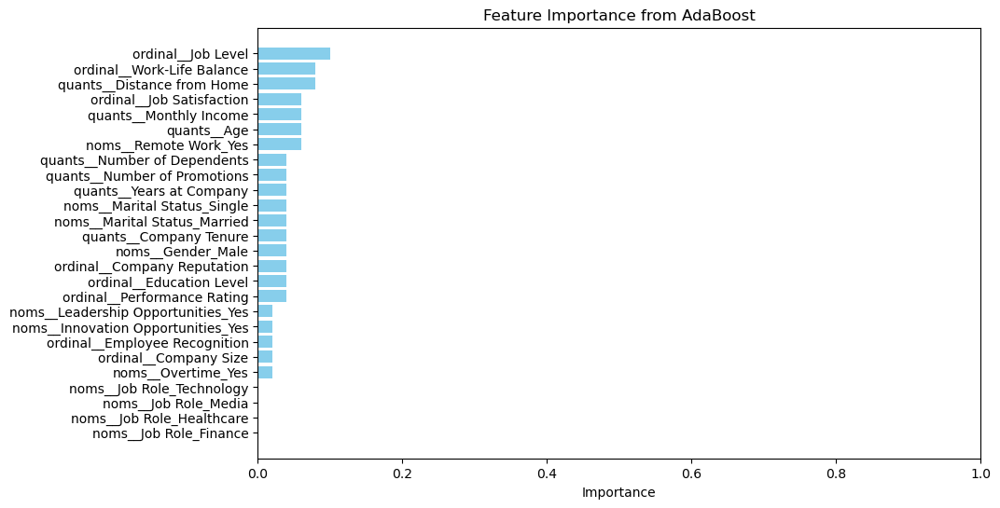

In [ ]:
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], align='center', color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance from AdaBoost')
plt.xlim(0, 1)  # Assuming importances are between 0 and 1
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()

In [ ]:
#remove job role and refit the model
norm1=['Gender','Overtime','Marital Status','Remote Work','Leadership Opportunities','Innovation Opportunities']


In [ ]:
#Preprocessing pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression

preprocessor1 = ColumnTransformer(
    transformers=[
        ('ordinal',OrdinalEncoder(categories=ord_level),ordinal),
        ('noms',OneHotEncoder(sparse_output=False,drop='first'),norm1),
        ('quants',StandardScaler(),quants)
    ]
)

preprocessor_pipeline1 = Pipeline(
    [
        ('preprocessor',preprocessor1),
    ]
)

In [ ]:
# from sklearn.ensemble import AdaBoostClassifier
model_pipline_ab_sel = Pipeline(
    [
       ('preprocessor1',preprocessor1),
       ('model',AdaBoostClassifier(random_state=123))
    ]
)

model_pipline_ab_sel.fit(X_train,y_train)

y_preds = model_pipline_ab_sel.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

c:\Users\Admin\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



              precision    recall  f1-score   support

           0       0.77      0.78      0.78      7868
           1       0.75      0.75      0.75      7032

    accuracy                           0.76     14900
   macro avg       0.76      0.76      0.76     14900
weighted avg       0.76      0.76      0.76     14900

AUC-ROC Score: 0.7626


Same performance with variable removing so this model is good

In [ ]:
feature_names_sel = model_pipline_ab_sel.named_steps['preprocessor1'].get_feature_names_out()


In [ ]:
ada_boost_sel = model_pipline_ab_sel.named_steps['model']

In [ ]:
feature_importances_sel = ada_boost_sel.feature_importances_

In [ ]:
importance_df_sel = pd.DataFrame({
    'Feature': feature_names_sel,
    'Importance': feature_importances_sel
})

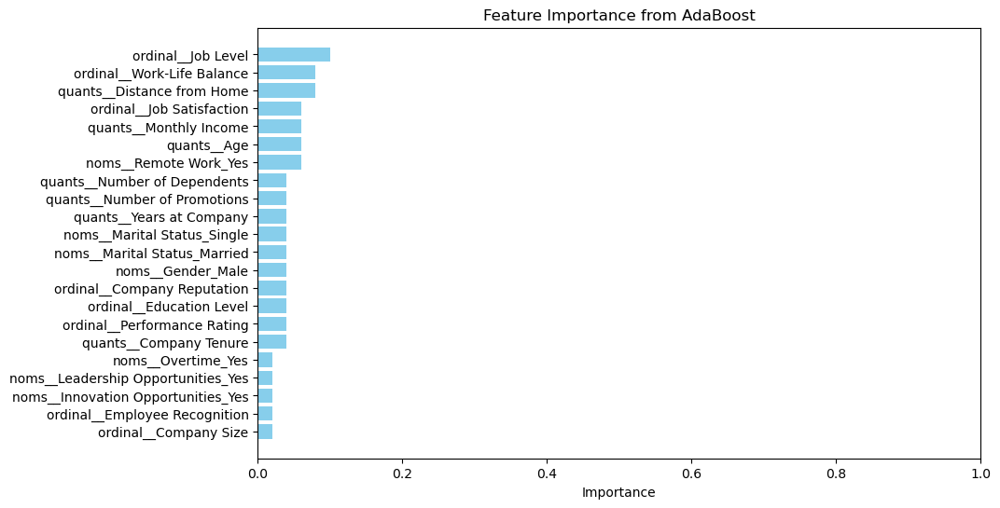

In [ ]:
importance_df_sel = importance_df_sel.sort_values(by='Importance', ascending=False)
# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df_sel['Feature'], importance_df_sel['Importance'], align='center', color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance from AdaBoost')
plt.xlim(0, 1)  # Assuming importances are between 0 and 1
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()

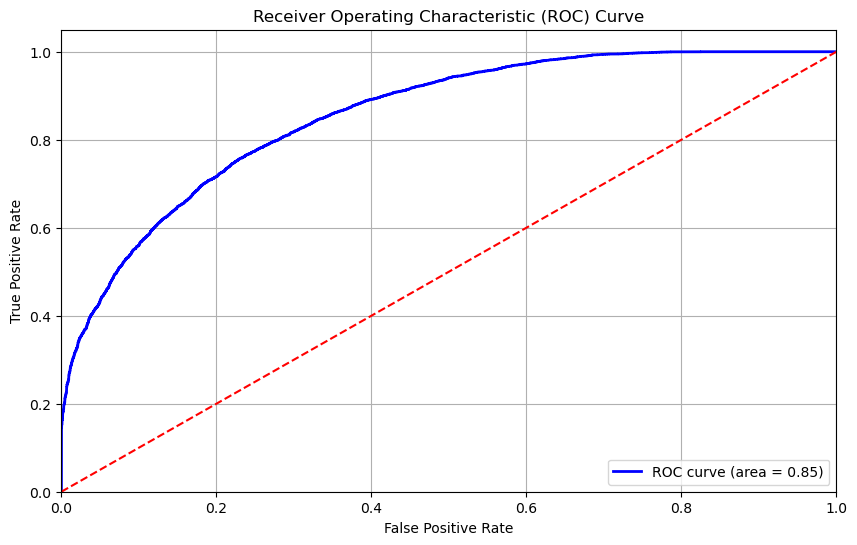

In [ ]:
#drawing AUC
from sklearn.metrics import roc_curve, auc
y_prob = model_pipline_ab_sel.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

### Shap Analysis

In [ ]:
X_train_preprocessed=model_pipline_ab_sel.named_steps['preprocessor1'].transform(X_train)

In [ ]:
#X_train_preprocessed as data frame and column names is in feature_names
feature_names2 = [name.replace('noms__', '').replace('ordinal__', '').replace('quants__', '') for name in feature_names]

X_train_preprocessed1 = pd.DataFrame(X_train_preprocessed, columns=feature_names2)
X_train_preprocessed1

,Work-Life Balance,Job Satisfaction,Performance Rating,Education Level,Job Level,Company Size,Company Reputation,Employee Recognition,Gender_Male,Overtime_Yes,...,Remote Work_Yes,Leadership Opportunities_Yes,Innovation Opportunities_Yes,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
0,3.0,1.0,2.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,...,0.0,0.0,0.0,-0.626336,0.288648,-0.888892,1.173308,-0.983891,-1.059395,1.308164
1,0.0,2.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.691627,-1.045173,-0.821960,2.178351,-1.019020,0.869027,-1.367856
2,2.0,2.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.205827,-0.511645,0.398153,-0.836777,-1.370314,0.869027,0.717865
3,2.0,2.0,3.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,...,1.0,0.0,0.0,-0.212414,-0.778409,-1.540084,0.168266,-0.808244,0.226220,-0.226612
4,1.0,3.0,2.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,1.443273,2.244918,-1.153366,-0.836777,0.737448,-1.059395,0.481746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59593,1.0,2.0,2.0,2.0,2.0,0.0,0.0,3.0,0.0,1.0,...,0.0,0.0,1.0,0.946567,-0.333802,-1.342542,0.168266,0.561801,0.226220,-0.816911
59594,1.0,2.0,3.0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,-1.702533,-1.045173,0.342841,2.178351,-0.281304,-1.059395,0.678512
59595,1.0,2.0,3.0,3.0,0.0,0.0,2.0,1.0,0.0,1.0,...,0.0,1.0,0.0,-1.371396,-0.155959,0.298220,-0.836777,-0.562338,0.226220,-1.053030
59596,1.0,3.0,2.0,2.0,0.0,2.0,2.0,0.0,1.0,0.0,...,0.0,0.0,0.0,-1.288611,-0.689488,-2.031848,-0.836777,0.421283,-1.059395,-1.840095


In [ ]:
y_train1 = pd.DataFrame(y_train, columns=['y'])

In [ ]:
import shap
shap.initjs()

In [ ]:
explainer = shap.PermutationExplainer(ada_boost_sel.predict, X_train_preprocessed)

shap_values = explainer(X_train_preprocessed)